In [1]:
import os 
import utils
import imageutils
import adv_laneline_detection
import matplotlib.image as mpimg
from importlib import reload
import matplotlib.pyplot as plt
import numpy as np
import cv2
import kerasmodel
import datasetclasses
from PIL import Image


C:\Users\modmo\Anaconda2\envs\carnd-term1\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [40]:
reload(utils)
reload(imageutils)
reload(adv_laneline_detection)

<module 'adv_laneline_detection' from 'C:\\Users\\modmo\\SelfDrivingCar\\projects\\advancedLaneFinding\\CarND-Advanced-Lane-Lines\\adv_laneline_detection.py'>

### Load in Camera Calibration Images

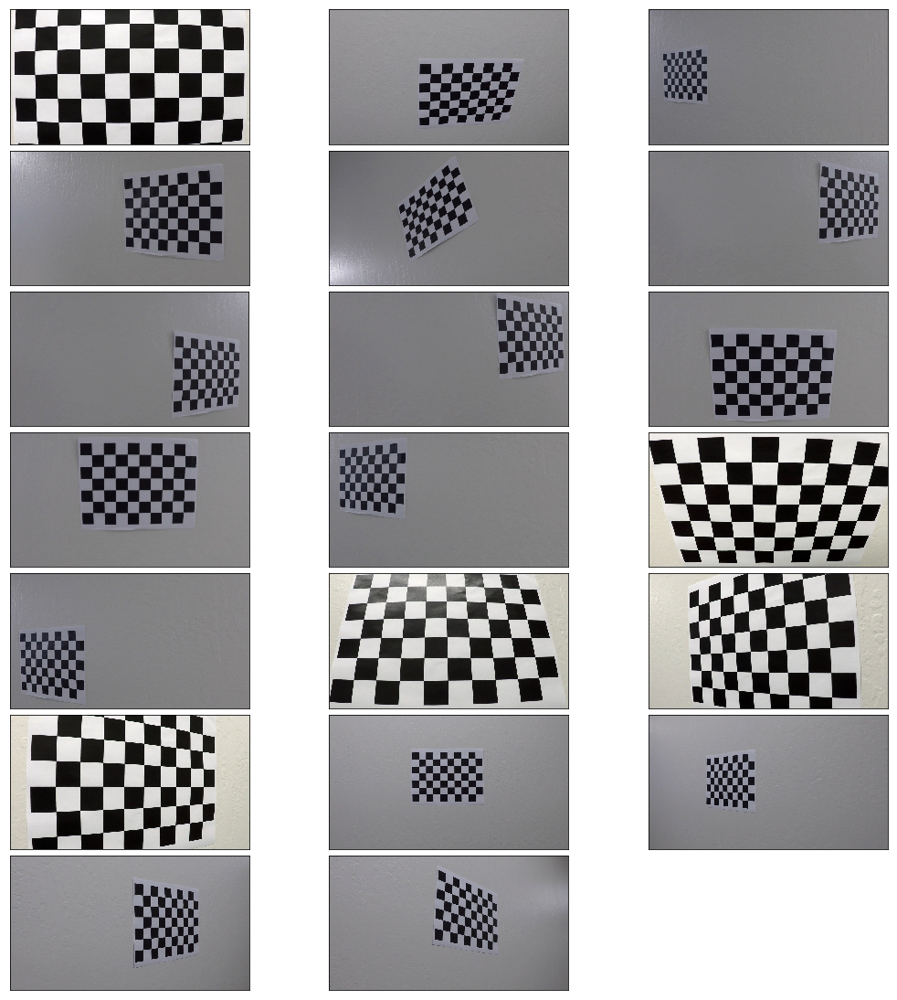

In [3]:
# load in Chessboard Calibration images 
directory = "camera_cal/"
calibration_images = utils.Load_images_for_directory(directory)

utils.show_images(calibration_images, image_name='all_camera_calibration_images', cols=3)

### Get Image Chessboard Corners

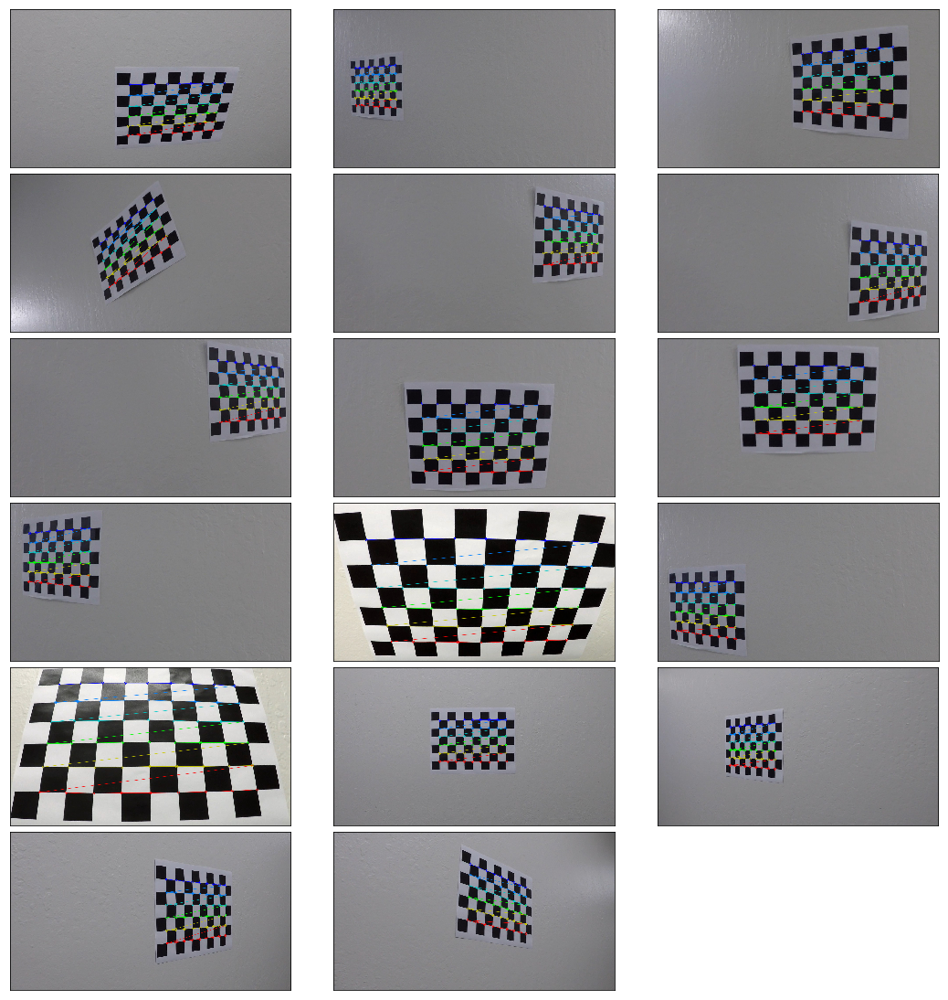

In [4]:
# calibration_points = utils.load_calibration_points_from_pickle()

# if utils.CALIBRATION_PICKLE_FILE in os.listdir('.') and len(calibration_points) > 1:
#     # Load calibration images from pickle file 
# #     calibration_points = utils.load_calibration_points_from_pickle()
#     object_points = calibration_points['object_points']
#     image_points = calibration_points['image_points']
#     plt.imshow(mpimg.imread('output_images/all_calibration_corner_images.png'))
# else :

images_object_points, images_points, corner_images = adv_laneline_detection.get_images_points(calibration_images)
utils.show_images(corner_images, image_name='all_calibration_corner_images', cols=3)
# Save Calibration points to pickle file
# utils.save_calibration_points_to_pickle(object_points, image_points)

### Calibrate Camera and Undistort 

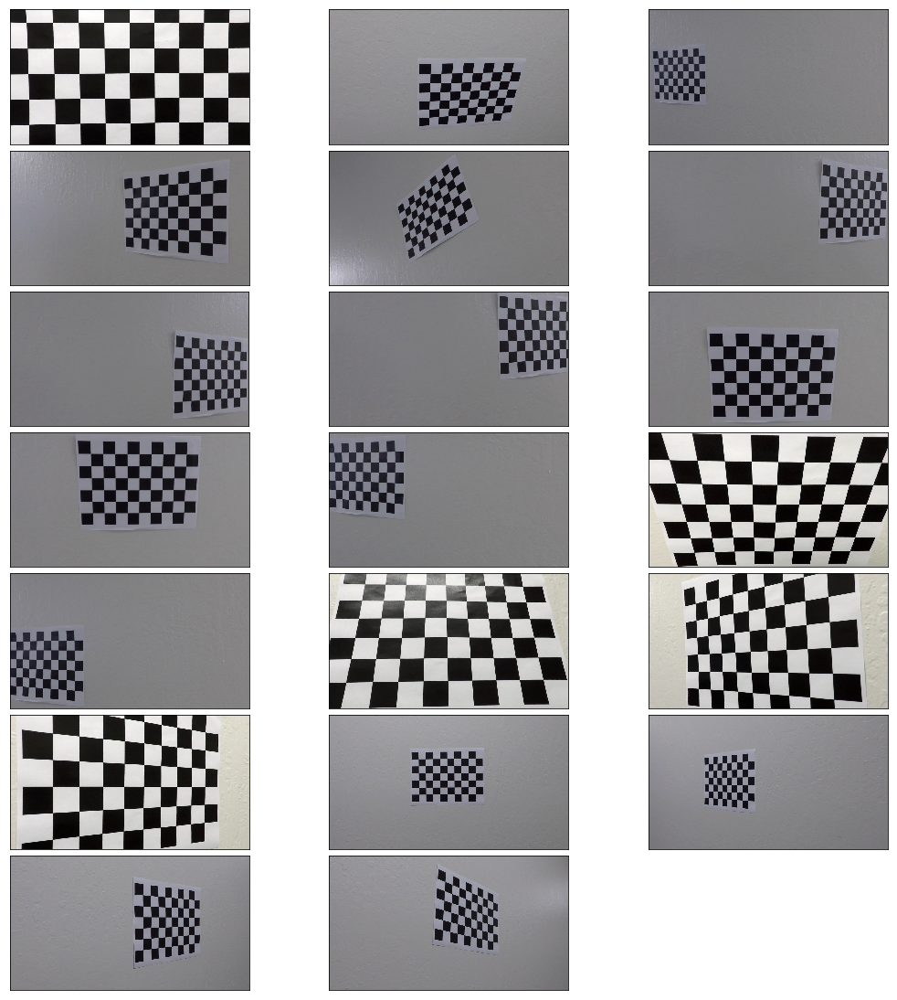

In [5]:
image_shape = calibration_images[0].shape[1::-1]
ret, mtx, dist = adv_laneline_detection.calibrate_camera(images_object_points, images_points, image_shape)
if ret:
    undistorted_images = [adv_laneline_detection.undistort_image(img, mtx, dist) for img in calibration_images]
# undistorted_images = adv_laneline_detection.undistort_images(object_points,
#                                                                        image_points,
#                                                                        calibration_images)
    utils.show_images(undistorted_images, image_name='all_undistorted_calibration_images', cols=3)

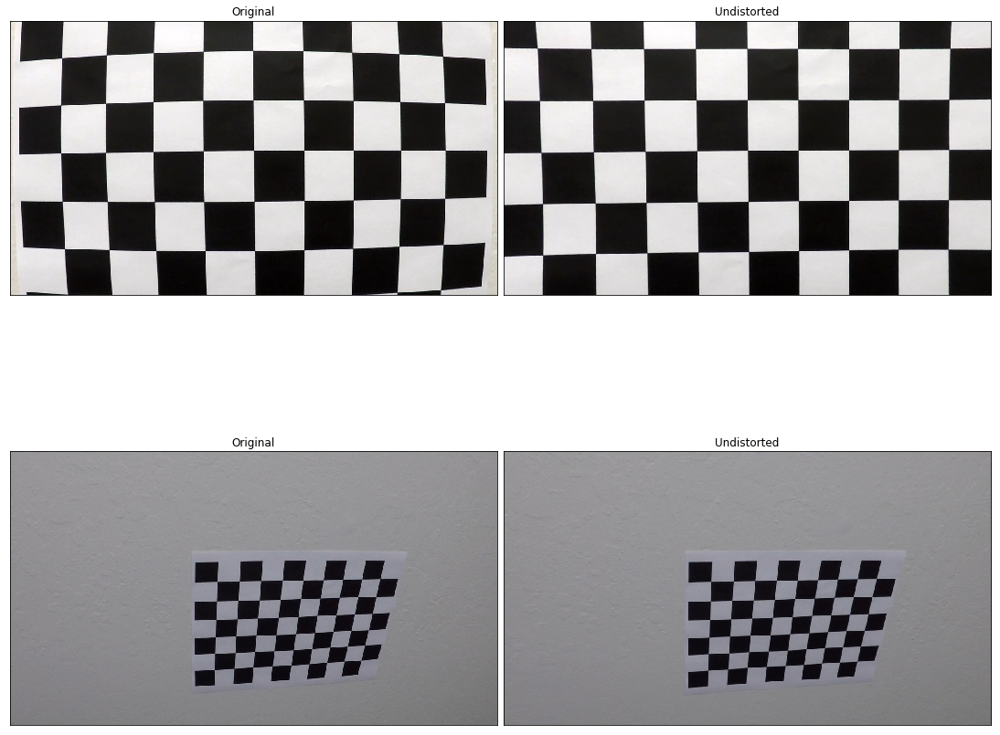

In [6]:
original_undistorted = [calibration_images[0], undistorted_images[0],
                        calibration_images[1], undistorted_images[1]]
utils.show_images(original_undistorted, ['Original', 'Undistorted', 'Original', 'Undistorted'], cols=2)

Here we see 2 images with there original distorted and undistorted variant, we can obviously identify the fisheye distortion that's in the first image and the straighter undistorted image, the second image is another story, the distortion is not as clear as in the the first image, but we can see the difference when we have it 

In [85]:
import pickle
calibration_values = { "mtx": mtx, "dist": dist }
pickle.dump( calibration_values, open( "calibration_values.p", "wb" ) )

## Load Project Images 

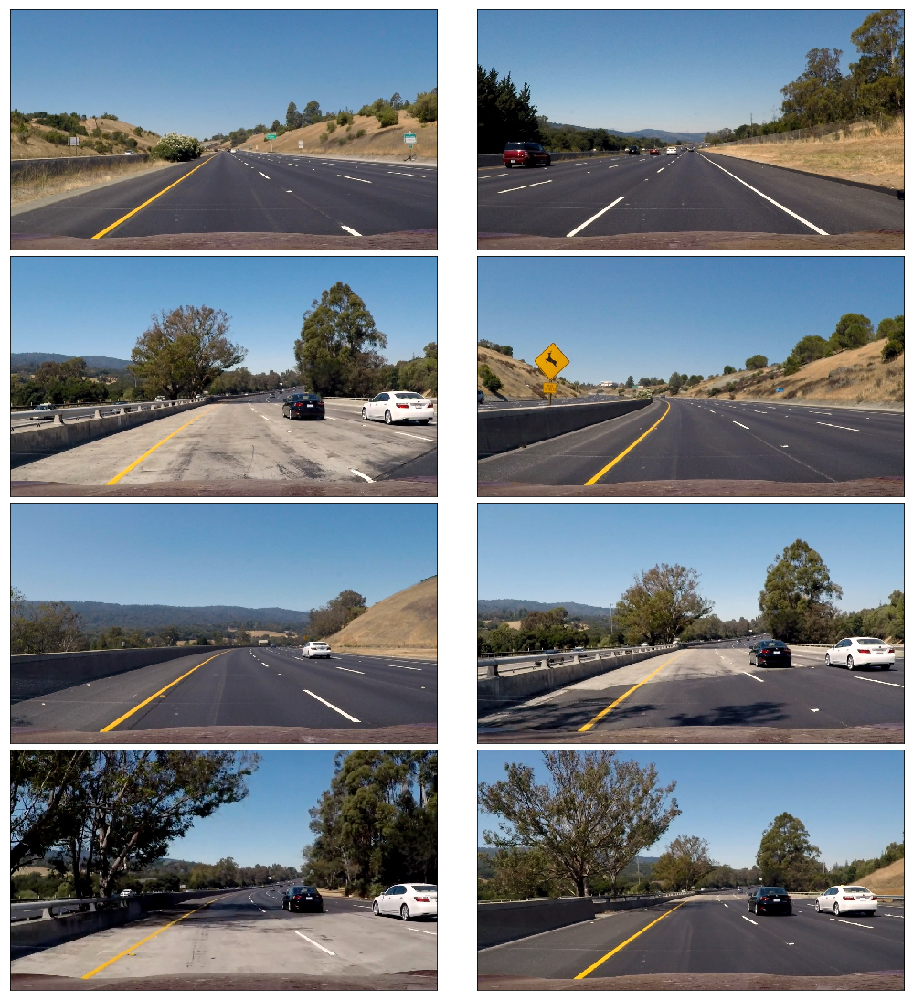

In [86]:
# Read in the test images
dir = "test_images/"
project_test_images = [mpimg.imread(dir + image_name) for image_name in os.listdir(dir)]
utils.show_images(project_test_images, image_name='all_project_test_images', cols=2)
project_test_images = [project_test_images[0],
                       project_test_images[2],
                       project_test_images[3],
                       project_test_images[6]]

## Calibrate Project Images

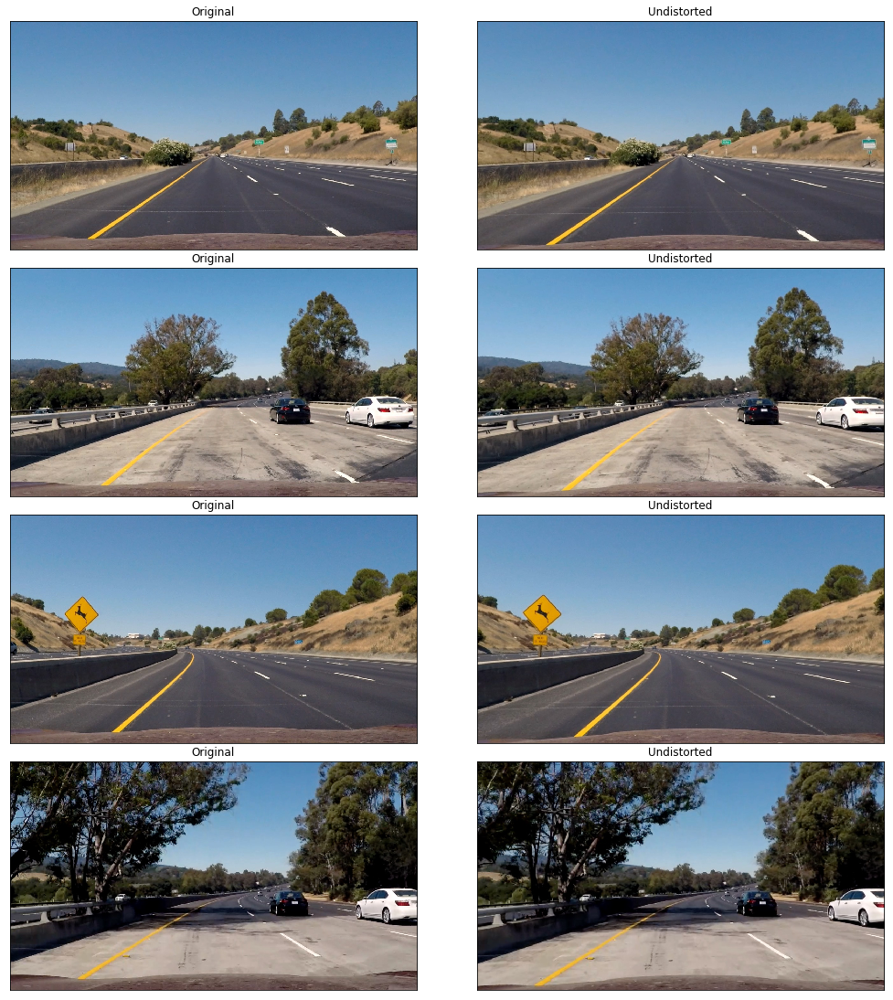

In [87]:
project_undistorted_images = [adv_laneline_detection.undistort_image(img, mtx, dist) for img in project_test_images] 
original_undistorted, titles = [], []
for original_img, undistorted_img in zip(project_test_images, project_undistorted_images):
    original_undistorted.append(original_img)
    titles.append('Original')
    original_undistorted.append(undistorted_img)
    titles.append('Undistorted')
utils.show_images(original_undistorted, 
                  titles,
                  image_name='project_original_undistorted_images', cols=2)

True

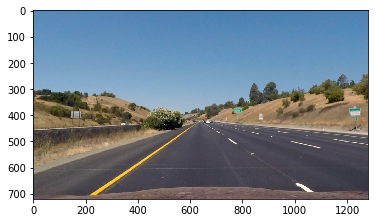

In [88]:
im = adv_laneline_detection.undistort_image(project_test_images[0], mtx, dist)
plt.imshow(im)
cv2.imwrite('messigray.png',im)

## Color Space Thresholding

Here we explore the benefits we can get from using a different color space 

### RGB Color space 

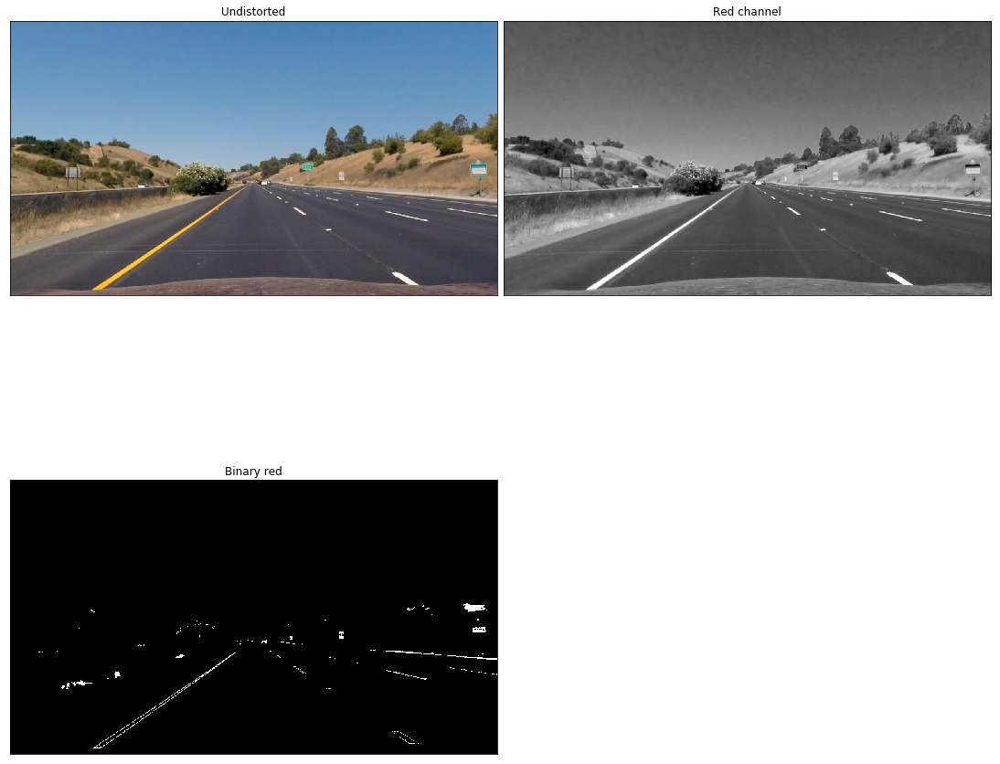

In [89]:
R_channel = project_undistorted_images[0][:, :, 0]
threshold = (200, 250)
binary_red = np.zeros_like(R_channel)
binary_red[(R_channel > threshold[0]) & (R_channel <= threshold[1])] = 1 

utils.show_images([project_undistorted_images[0], R_channel, binary_red], 
                  ['Undistorted', 'Red channel', 'Binary red'],
                  image_name='undistorted_red_images', cols=2)

### HSL or HLS Color Space
Here I'll use the HLS color space as I already did in a prior project and it yielded the best results.

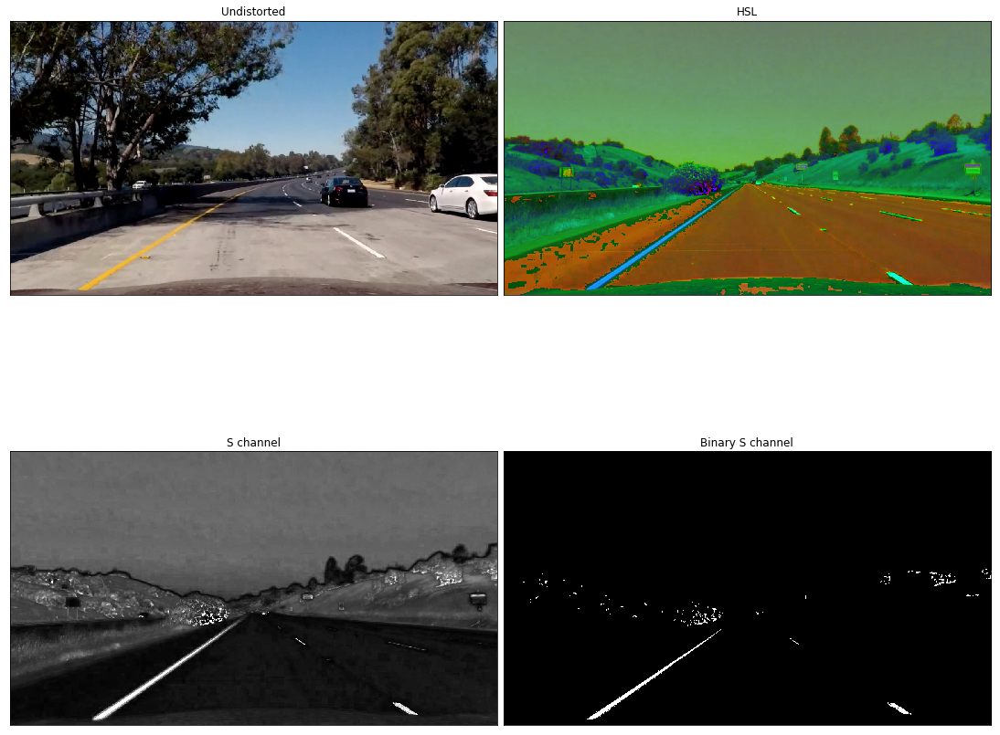

In [90]:
hls_image = imageutils.convert_to_hsl(project_undistorted_images[0])
S_channel = hls_image[:, :, 2]
threshold = (170, 255)
binary_S = np.zeros_like(S_channel)
binary_S[(S_channel > threshold[0]) & (S_channel <= threshold[1])] = 1
utils.show_images([project_undistorted_images[-1], hls_image, S_channel, binary_S], 
                  ['Undistorted', 'HSL', 'S channel', 'Binary S channel'],
                  image_name='undistorted_hsl_images', cols=2)

### LAB and LUV Color Spaces
Here I added the two color space as recommended by the reviewer and got pretty decen

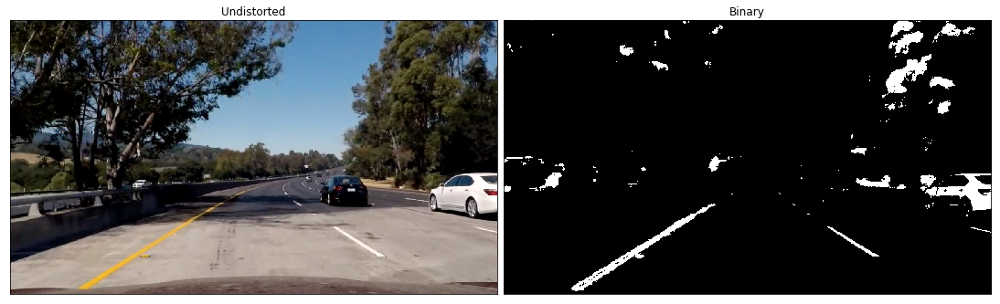

In [91]:
binary = adv_laneline_detection.other_color_thresholds(project_undistorted_images[-1])
utils.show_images([project_undistorted_images[-1], binary], 
                  ['Undistorted', 'Binary'],
                  image_name='luvandlab', cols=2)

### Combined Approach 
As we saw the R channel correctly identifies the white line and the S channel correctly identifies lines under different lighting conditions, so lets combine both results to get a robust representation of our lanelines.

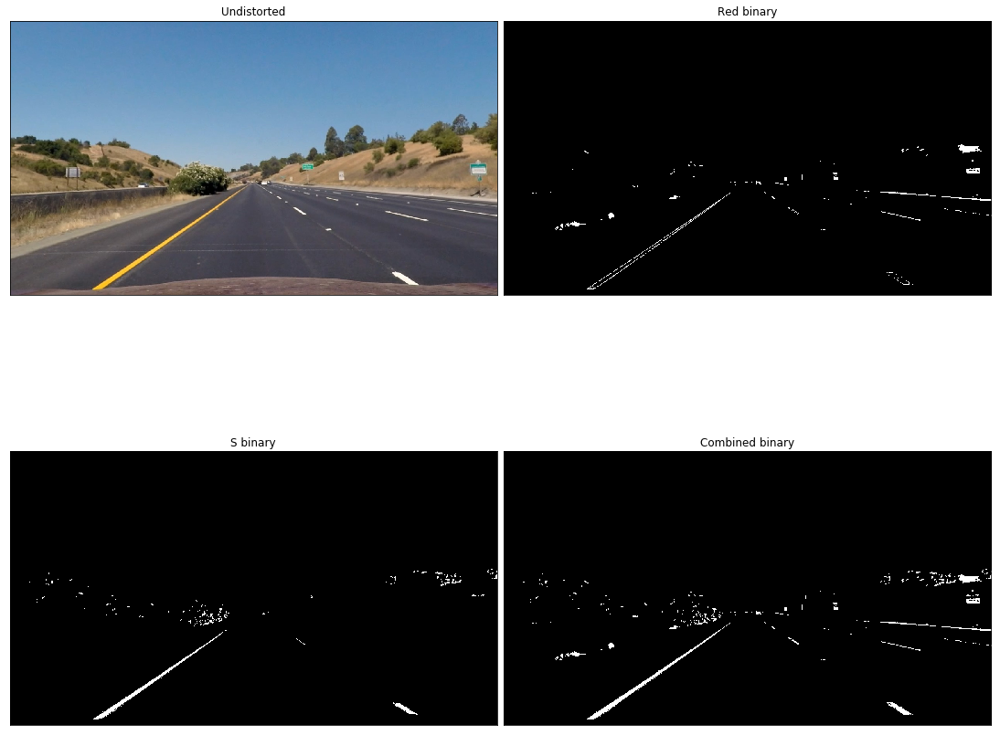

In [92]:
combined_color_binary = np.zeros_like(binary_red)
combined_color_binary[(binary_red == 1) | (binary_S == 1) ] = 1

utils.show_images([project_undistorted_images[0], binary_red, binary_S, combined_color_binary], 
                  ['Undistorted', 'Red binary', 'S binary', 'Combined binary'],
                  image_name='undistorted_combined_color_images', cols=2)

## Gradient Thresholding 
Lets take the third image as an example

### Sobel X & Y Thresholding

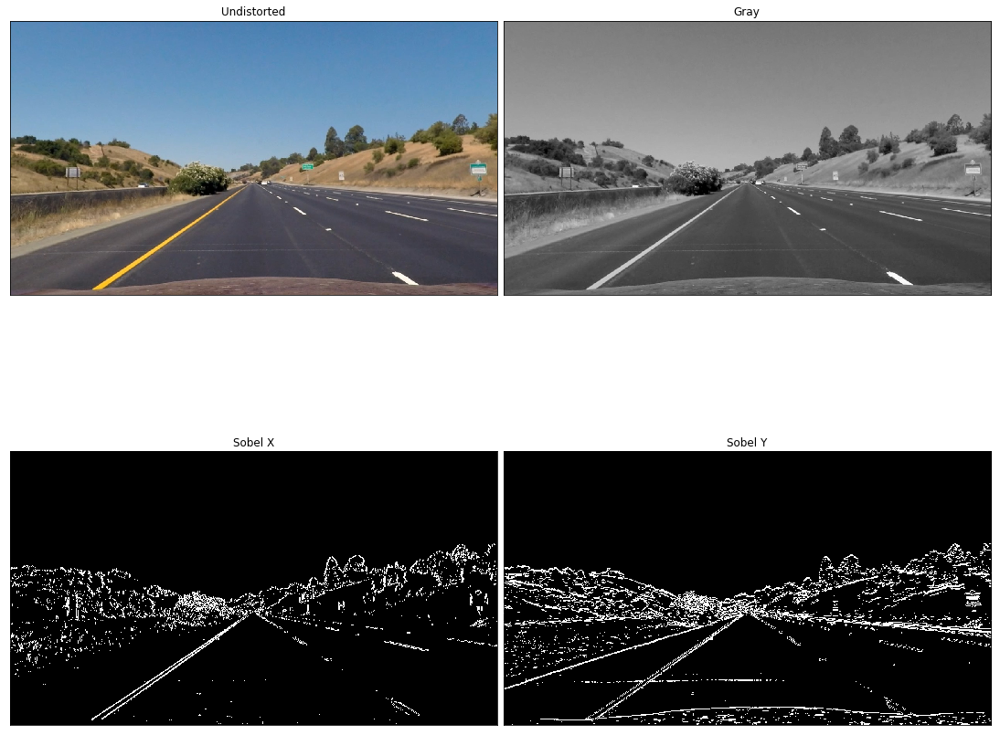

In [93]:
abs_threshold = (20, 100)
gray_image = imageutils.convert_to_gray(project_undistorted_images[0])
sobelx = adv_laneline_detection.abs_sobel_thresh(gray_image, 'x', 3, abs_threshold)
sobely = adv_laneline_detection.abs_sobel_thresh(gray_image, 'y', 3, abs_threshold)
utils.show_images([project_undistorted_images[0], gray_image, sobelx, sobely], 
                  ['Undistorted', 'Gray', 'Sobel X', 'Sobel Y'],
                  image_name='undistorted_sobelxy_images', cols=2)

### Sobel Magnitude & Directional Thresholding

## Camera Calibration 

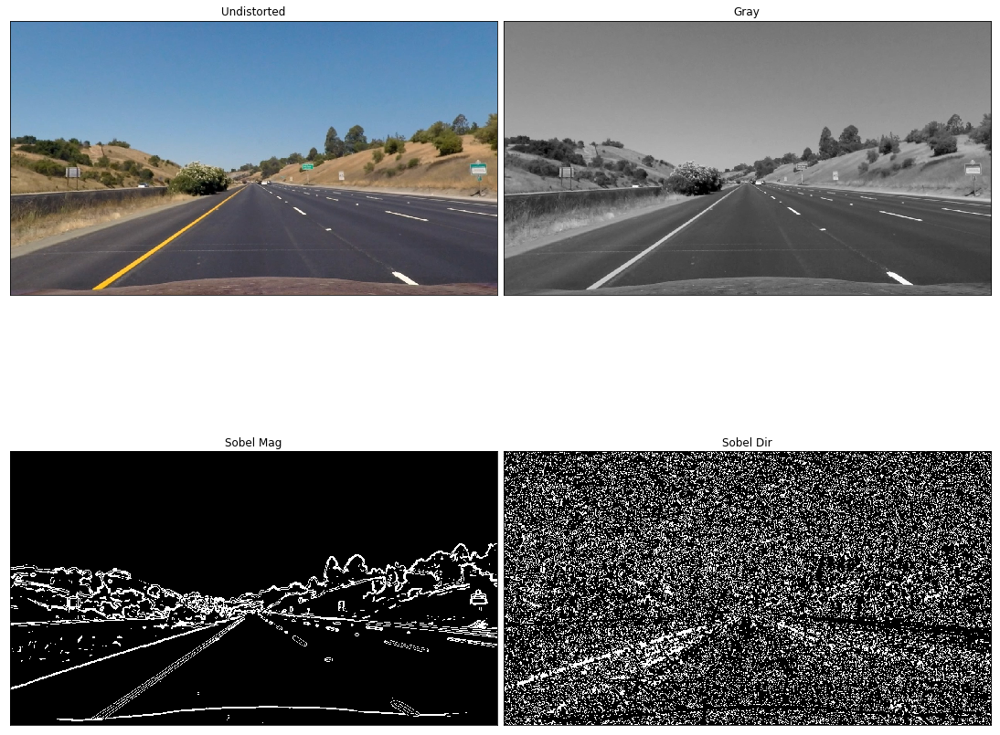

In [94]:
mag_threshold = (40, 100)
dir_threshold = (1.0, 1.3)
sobel_mag = adv_laneline_detection.mag_sobel_thresh(gray_image, 17, mag_threshold)
sobel_dir = adv_laneline_detection.dir_sobel_thresh(gray_image, 17, dir_threshold)
utils.show_images([project_undistorted_images[0], gray_image, sobel_mag, sobel_dir], 
                  ['Undistorted', 'Gray', 'Sobel Mag', 'Sobel Dir'],
                  image_name='undistorted_sobel_mag_dir_images', cols=2)

### Here are all the Sobel Images


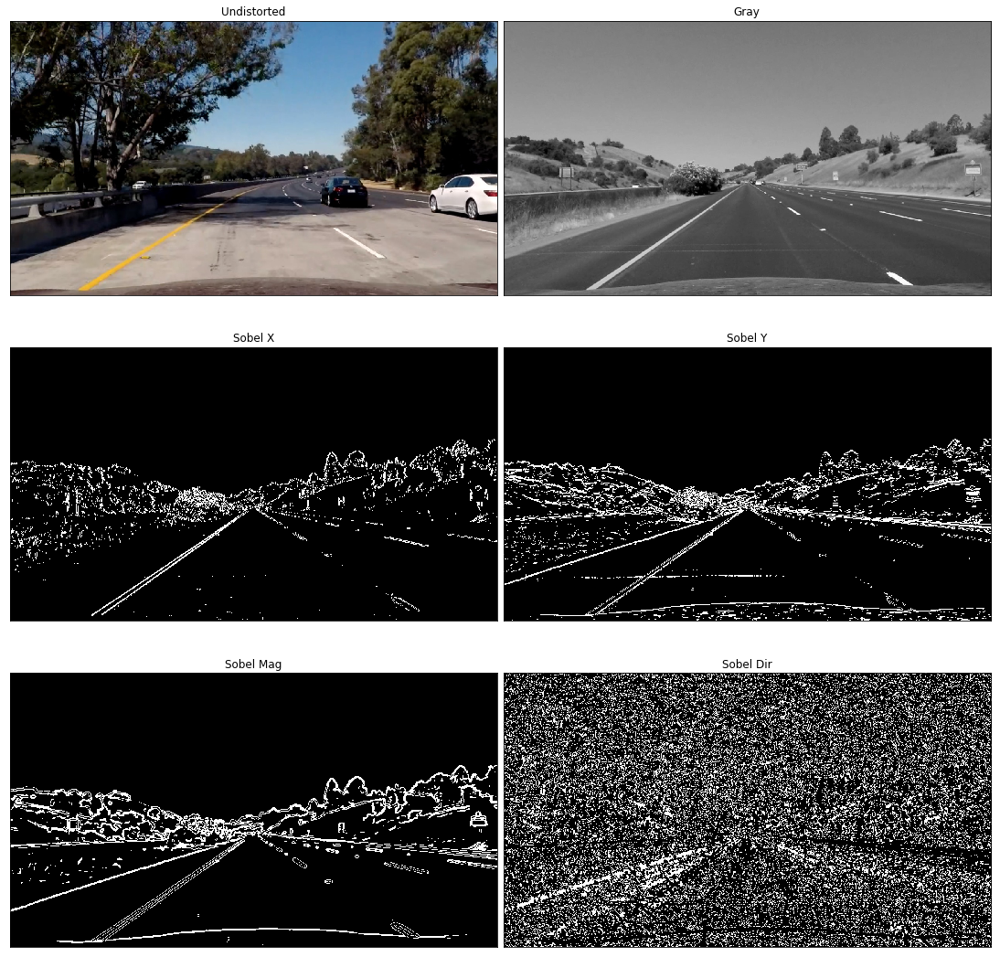

In [95]:
utils.show_images([project_undistorted_images[-1], gray_image, sobelx, sobely, sobel_mag, sobel_dir], 
                  ['Undistorted', 'Gray', 'Sobel X', 'Sobel Y','Sobel Mag', 'Sobel Dir'],
                  image_name='undistorted_all_sobel_images', cols=2)

## Combining Thresholds

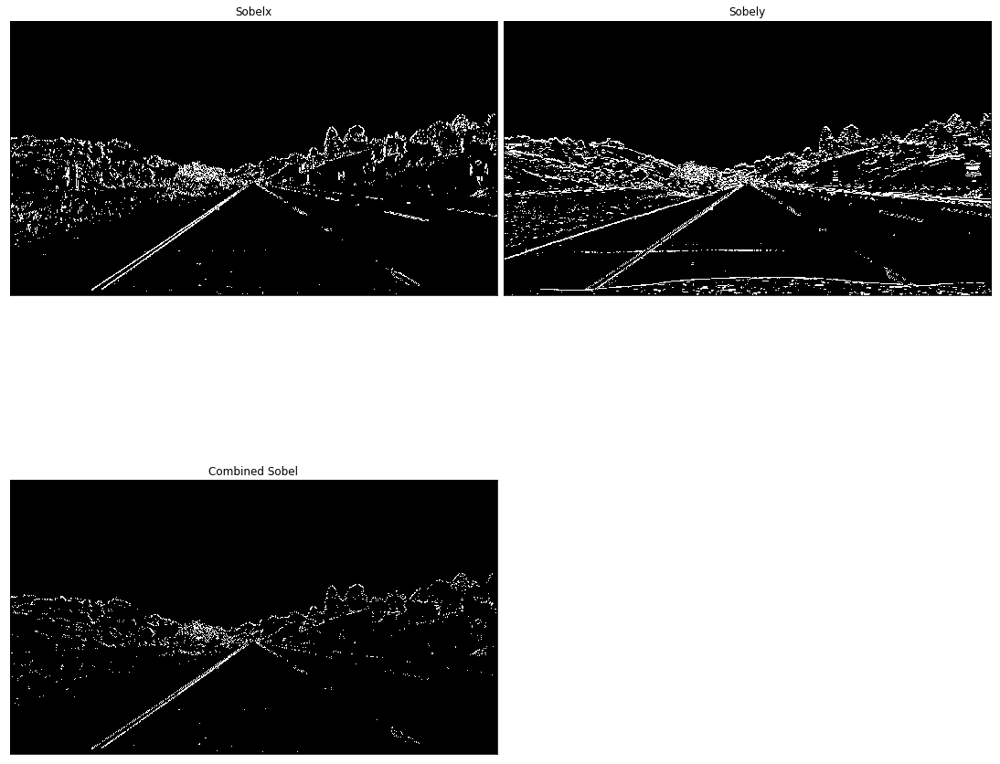

In [96]:
abs_threshold = (20, 100)
gray_image = imageutils.convert_to_gray(project_undistorted_images[0])
combined_sobel_xy = adv_laneline_detection.combined_abs_sobelxy_thresh(gray_image, 3, abs_threshold)
utils.show_images([sobelx, sobely, combined_sobel_xy], 
                  ['Sobelx', 'Sobely', 'Combined Sobel'],
                  image_name='combined_sobelxy_images', cols=2)

### Combining Sobel Magnitude & Directional

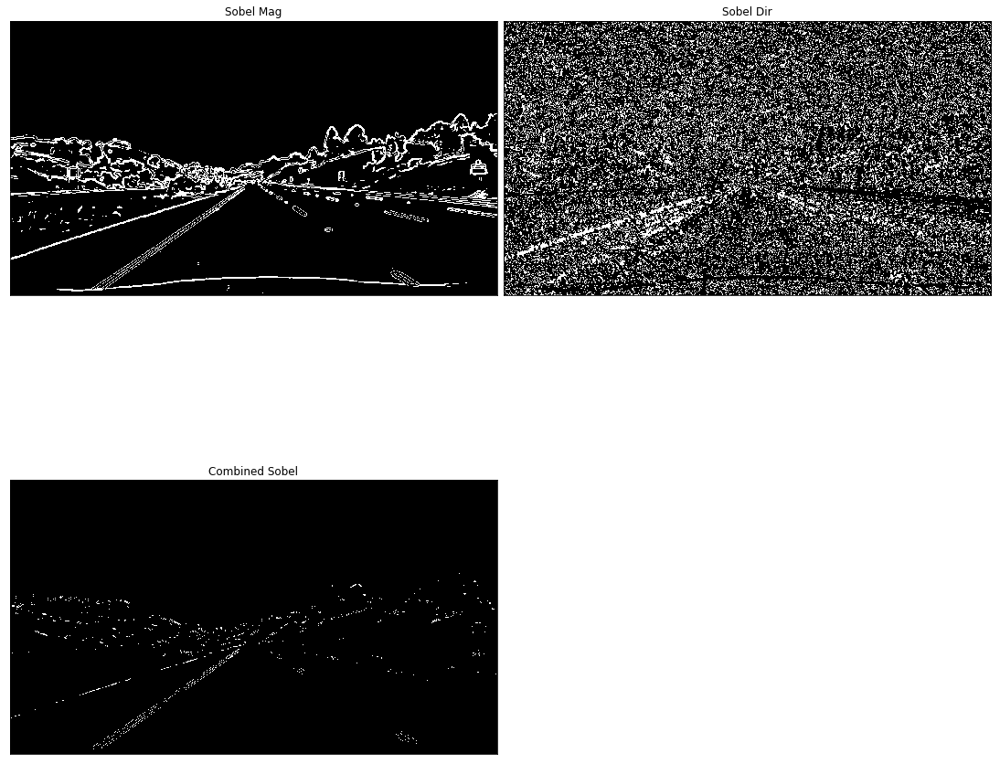

In [97]:
mag_threshold = (70, 100)
dir_threshold = (0.9, 1.3)
combined_sobel_mag_dir = adv_laneline_detection.combined_sobel_mag_dir_thresh(gray_image, 17, mag_threshold, dir_threshold)
utils.show_images([sobel_mag, sobel_dir, combined_sobel_mag_dir], 
                  ['Sobel Mag', 'Sobel Dir', 'Combined Sobel'],
                  image_name='combined_sobel_mag_dir_images', cols=2)

### Combining All Sobel Thresholds

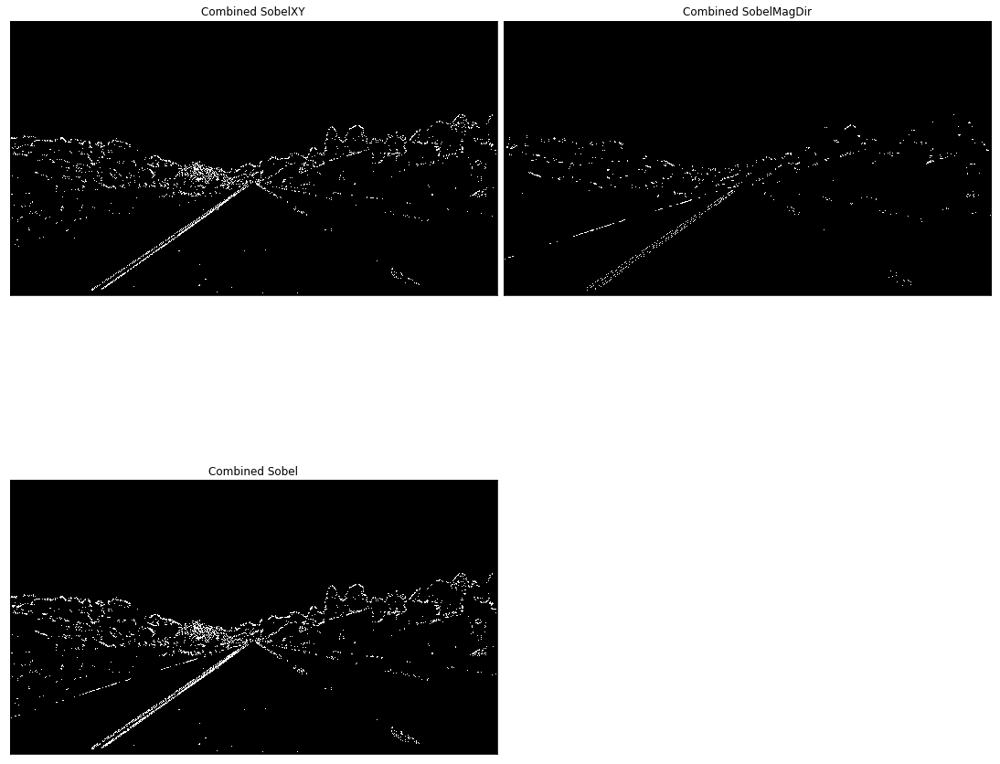

In [98]:
combined_sobel = np.zeros_like(gray_image)
combined_sobel[(combined_sobel_xy == 1) | (combined_sobel_mag_dir == 1) ] = 1
utils.show_images([combined_sobel_xy, combined_sobel_mag_dir, combined_sobel], 
                  ['Combined SobelXY', 'Combined SobelMagDir', 'Combined Sobel'],
                  image_name='combined_sobel_imagess', cols=2)

## Using Gradient and Color Thresholding 

Lets now get the best of both worlds and combine the result of the color thresholding and the one from the gradients to try and get a robust representation of our laneline under different conditions.

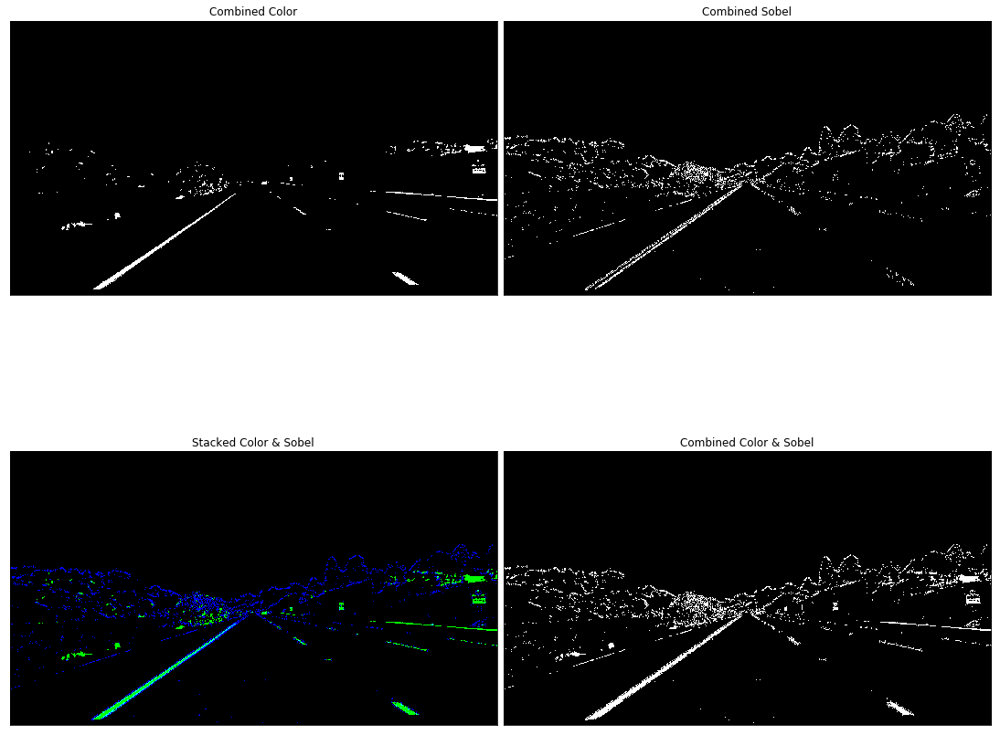

In [99]:
combined_color_gradient = np.zeros_like(combined_sobel)
combined_color_gradient[(combined_color_binary == 1) | (combined_sobel == 1)] = 1 
stacked = np.dstack((np.zeros_like(combined_color_gradient), combined_color_binary, combined_sobel)) * 255
utils.show_images([combined_color_binary, combined_sobel, stacked, combined_color_gradient], 
                  ['Combined Color', 'Combined Sobel', 'Stacked Color & Sobel', 'Combined Color & Sobel'],
                  image_name='combined_color_sobel_images', cols=2)

Lets apply thresholding to all of our test images 

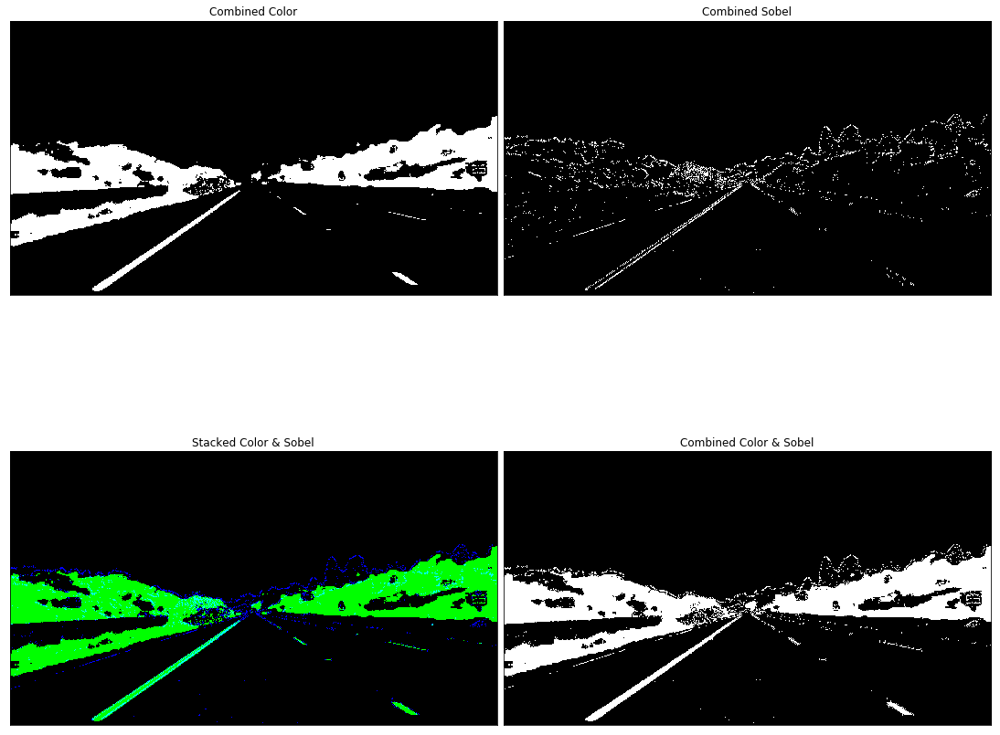

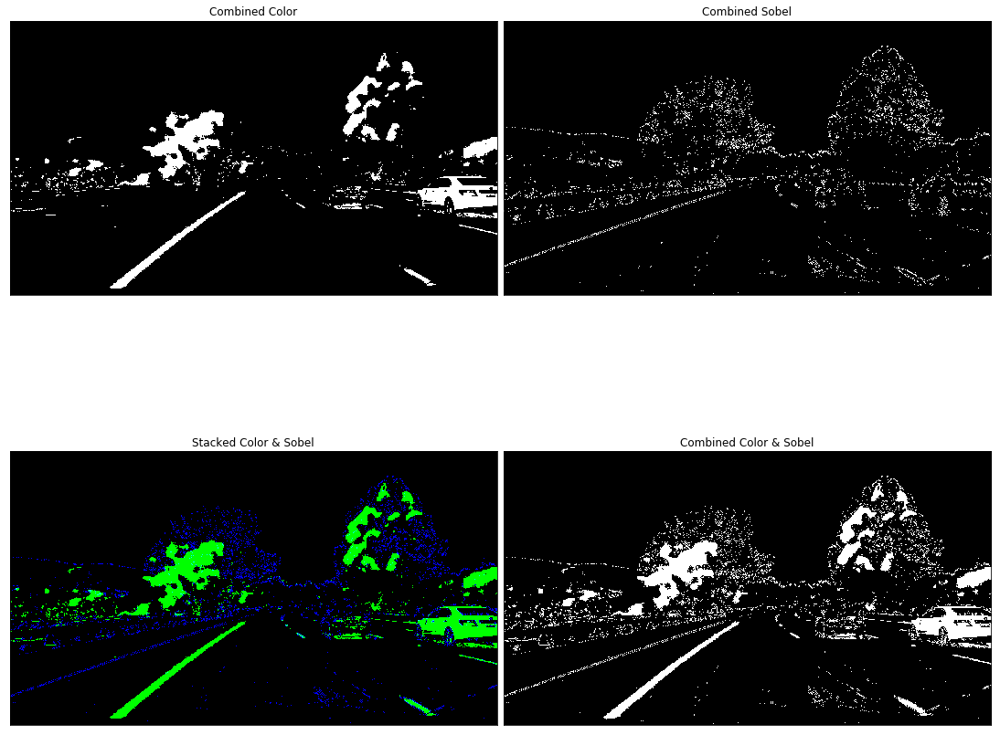

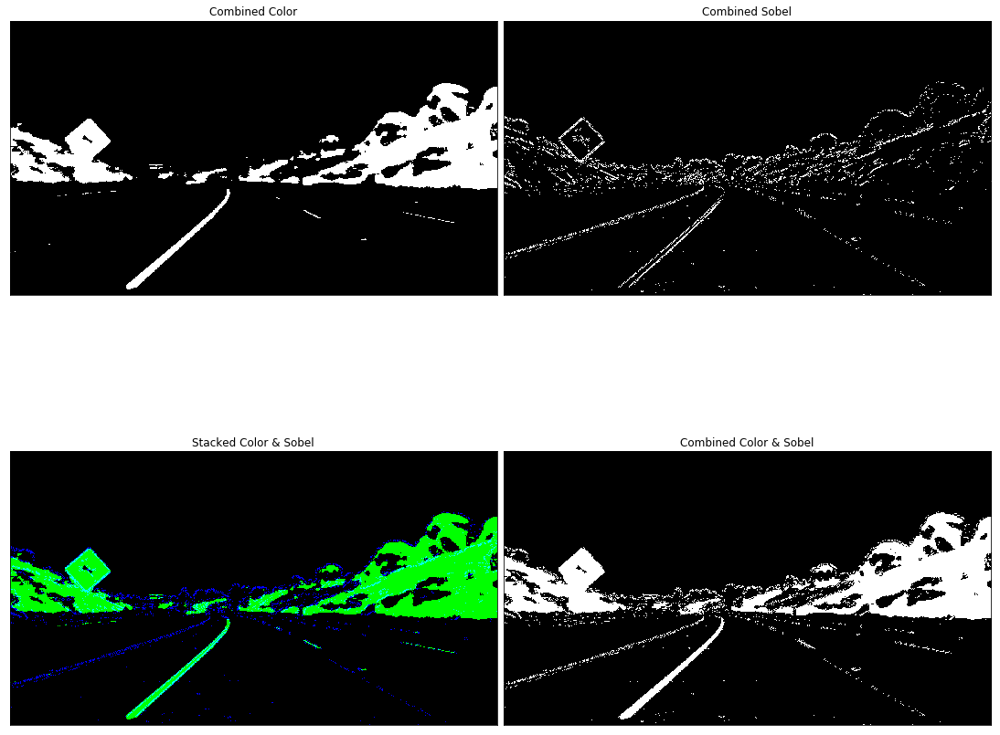

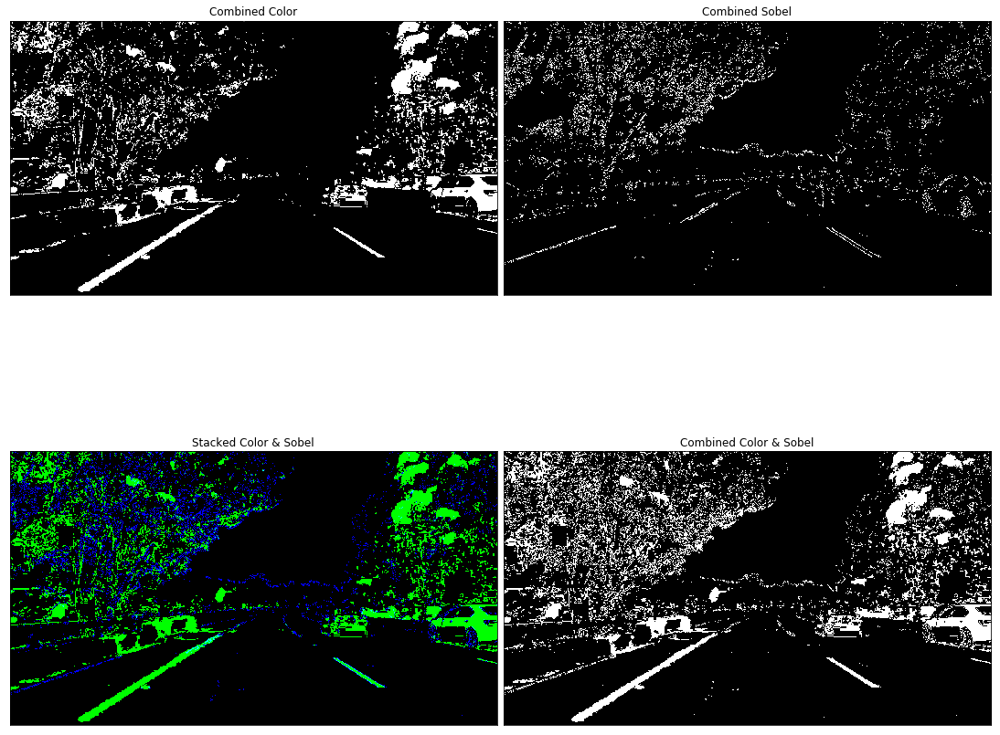

In [100]:
# Color Thresholds 
red_thresh = (220, 250)
hls_thresh = (90, 255)
hls2_thresh = (170, 255)
# Gradient Thresholds 
xy_threshold = (20, 100)
mag_threshold = (70, 100)
dir_threshold = (1.1, 1.3)

thresholded_images = []

for img in project_test_images:
    # Undistort
    undistorted_image = adv_laneline_detection.undistort_image(img, mtx, dist)
    # Color Thresholding 
    color_binary_threshold = adv_laneline_detection.combined_color_threshold(undistorted_image, red_thresh, hls2_thresh)    
    # Gradient Thresholding (Sobel)
    sobel_binary_threshold = adv_laneline_detection.combined_sobel_thresh(undistorted_image,
                                                                          abs_kernel=3,
                                                                          mag_dir_kernel=17,
                                                                          abs_thresh=xy_threshold,
                                                                          mag_thresh=mag_threshold,
                                                                          dir_thresh=dir_threshold)
    # Staked result
    stacked = np.dstack((np.zeros_like(color_binary_threshold), color_binary_threshold, sobel_binary_threshold)) * 255
    
    combined_color_gradient = np.zeros_like(color_binary_threshold)
    combined_color_gradient[(color_binary_threshold == 1) | (sobel_binary_threshold == 1)] = 1 
                                                                          
    utils.show_images([color_binary_threshold, sobel_binary_threshold, stacked, combined_color_gradient], 
                  ['Combined Color', 'Combined Sobel', 'Stacked Color & Sobel', 'Combined Color & Sobel'],
                  cols=2)
    thresholded_images.append(combined_color_gradient)
# img = project_test_images[-1]
# undistorted_image = adv_laneline_detection.undistort_image(img, mtx, dist)
# binary_red = adv_laneline_detection.red_color_threshold(undistorted_image, red_thresh)
# binary_S = adv_laneline_detection.hls_color_threshold(undistorted_image, hls_thresh)
# b_s2 = adv_laneline_detection.hls_color_threshold(undistorted_image, hls2_thresh)
# combined_color_binary = np.zeros_like(binary_red)
# combined_color_binary[(binary_red == 1) | (binary_S == 1) ] = 1

# utils.show_images([project_undistorted_images[3], binary_red, binary_S, b_s2], 
#                   ['Undistorted', 'Red binary', 'S binary', 'Combined binary'],
#                   image_name='undistorted_combined_color_images', cols=2)

## Region of interest  (src)

Finally we'll be using a mask to only get an area of the image that has the lanelines and ignore other parts of the road like other cars, trees, mountains, etc.. Here I'm trying out different *src* and *dst* to ultimately use these values for warping.


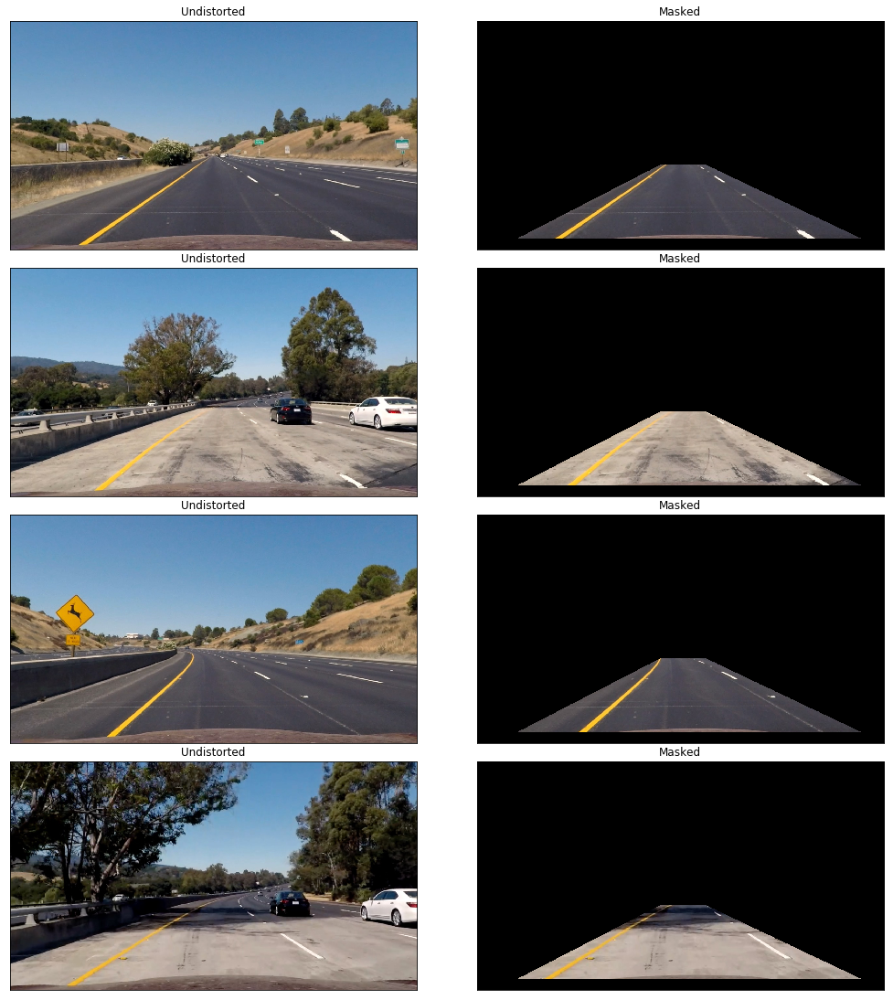

In [101]:
width, height = project_undistorted_images[0].shape[1], project_undistorted_images[0].shape[0]
# Top-Left, Top-right, Bottom-right, Bottom-left 
vertices = np.array([[(width * 0.10, height) # Bottom left
                 , (width * 0.40, height * 0.65)    # Top left vertix 60% if the image's hight
                 , (width * 0.60, height * 0.65)    # Top right vetrix 
                 , (width * 0.95, height)]]  # Bottom right
                 , dtype=np.int32)
vertices = np.array([[(width * 0.10, height * 0.95) # Bottom left
                 , (width * 0.45, height * 0.63)    # Top left vertix 60% if the image's hight
                 , (width * 0.56, height * 0.63)    # Top right vetrix 
                 , (width * 0.94, height * 0.95)]]  # Bottom right
                 , dtype=np.int32)


masked_images = [adv_laneline_detection.region_of_interest(img, vertices) for img in project_undistorted_images]
undistorted_masked, titles = [], []
for undistorted_img, masked_image in zip(project_undistorted_images, masked_images):
    undistorted_masked.append(undistorted_img)
    titles.append('Undistorted')
    undistorted_masked.append(masked_image)
    titles.append('Masked')

utils.show_images(undistorted_masked, 
                  titles,
                  image_name='project_original_undistorted_images', cols=2)

## Transform Perspective (Warp)

Lets now first apply camera calibration for our real world images then perspective transform it.

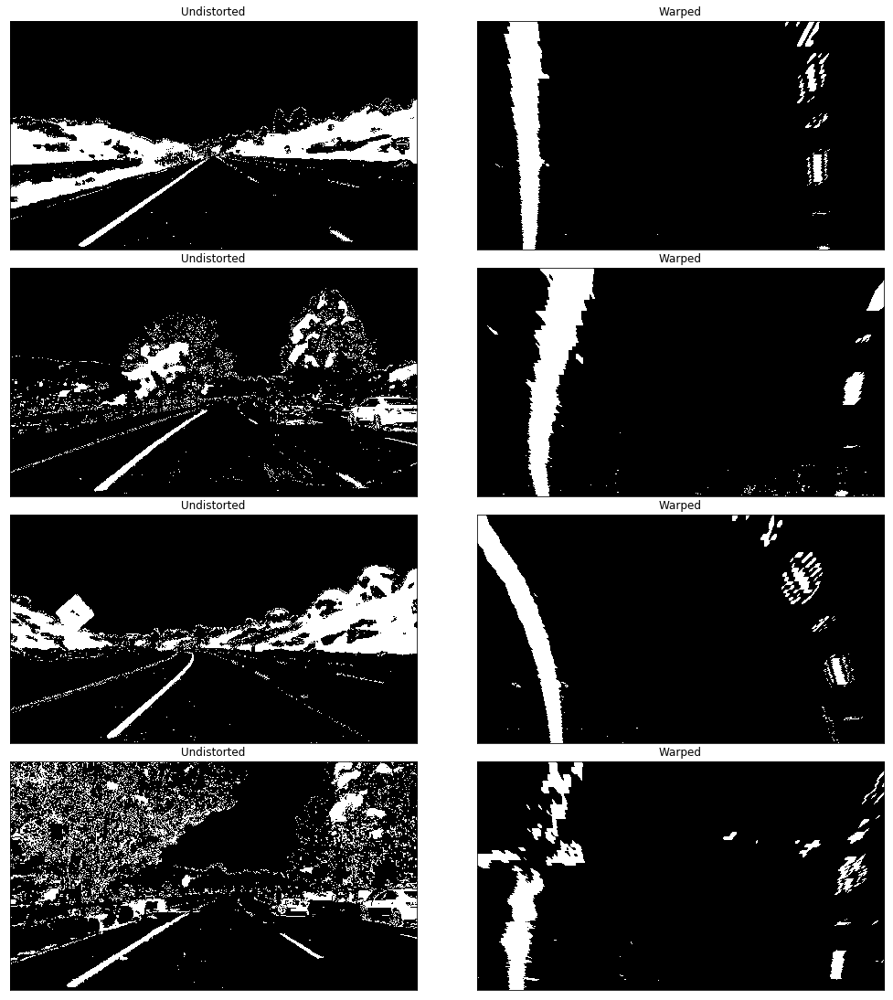

In [195]:
image_offset = 10


dest = np.float32([[image_offset, 0],# Top left
                   [image_offset, height], # Bottom left
                   [width - image_offset, height], # Bottom right
                   [width - image_offset , 0]]) # Top right





src = np.float32([[width * 0.45, height * 0.63] # Top left vertix 60% if the image's hight
                , [width * 0.10, height * 0.95] # Bottom left
                , [width * 0.94, height * 0.95] # Bottom right 
                , [width * 0.56, height * 0.63]]) # Top right vetrix


undistorted_warped, titles = [], []
warped_images = []
M, Minv = None, None
for undistorted_image in thresholded_images:#project_undistorted_images:#
    titles.append('Undistorted')
    undistorted_warped.append(undistorted_image)
    warped_image, M, Minv = adv_laneline_detection.warp_and_transform_image(undistorted_image, src, dest)
    undistorted_warped.append(warped_image)
    titles.append('Warped')
    warped_images.append(warped_image)
warped_images.append(mpimg.imread('./images/warped_example.jpg'))

utils.show_images(undistorted_warped, 
                  titles,
                  image_name='project_undistorted_warped_images', cols=2)
# Smooth Threshold result
warped_images = [adv_laneline_detection.gaussian_blur(img, 11) for img in warped_images]

# print(len(warped_images))
# g = adv_laneline_detection.gaussian_blur(warped_images[1], 11)
# p = warped_images[1]
# utils.show_images([p, g], 
#                   titles,
#                   image_name='project_udfgndistorted_warped_images', cols=2)

## Sliding Window

### Histogram

## Detect Lane Lines and Fit Polynomial

120.0


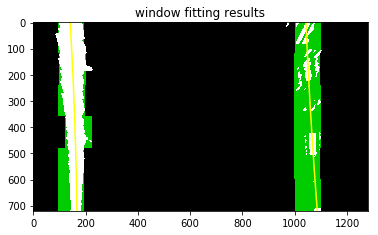

Average curvature is 6301.851065862893
Car position of center is 0.07107059126881778


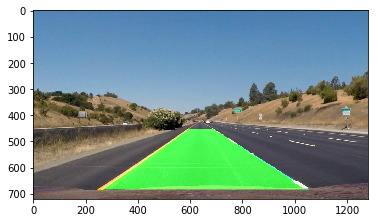

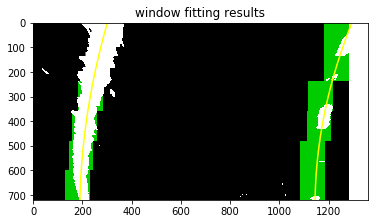

Average curvature is 753.7024631827476
Car position of center is -0.1451674751242183


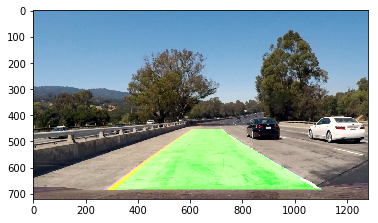

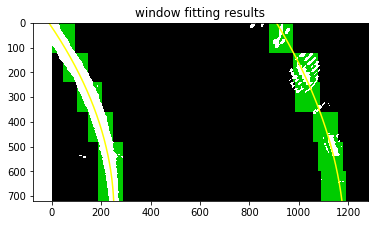

Average curvature is 429.90543720871665
Car position of center is -0.3829906740496103


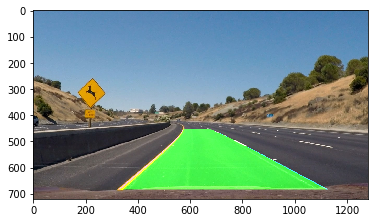

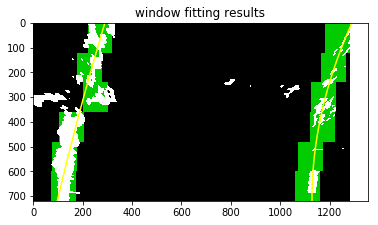

Average curvature is 2138.2400489394286
Car position of center is 0.14258303735659386


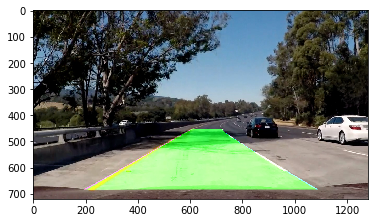

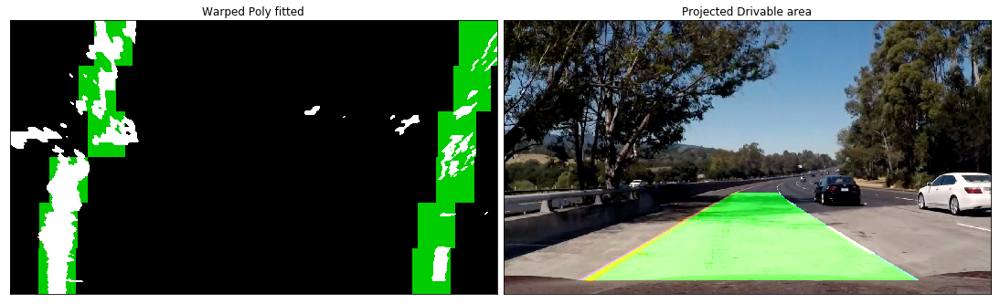

Average curvature is 2138.2400489394286


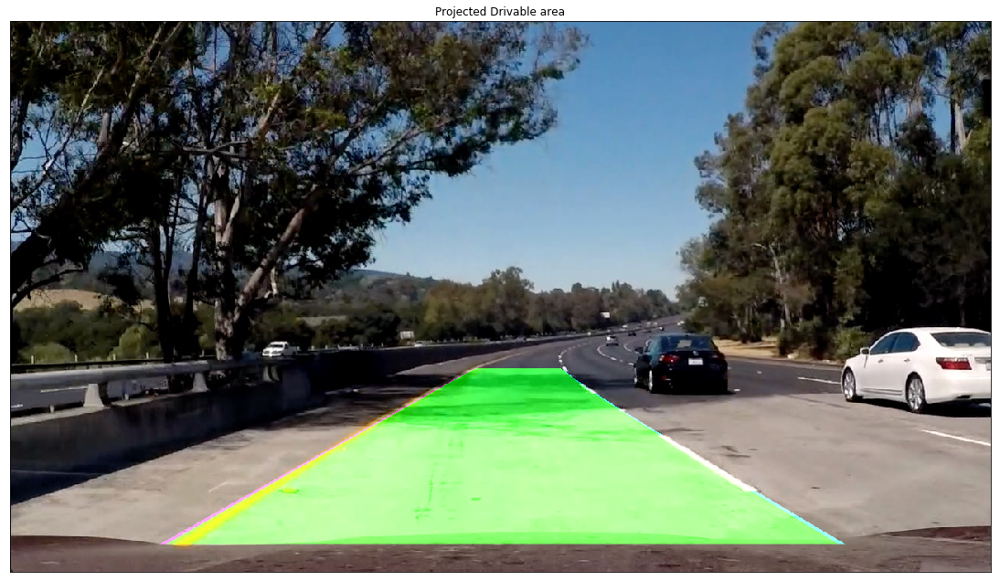

In [196]:
# window settings
window_width = 100
window_height = warped_images[0].shape[0] / 6 # Break image into 9 vertical layers since image height is 720
print(window_height)
margin = 100 # How much to slide left and right for searching



left_fits, right_fits = [], []

for warped, original_image in zip(warped_images, project_test_images):
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    
    # Get lanes centroids (Windows)
    window_centroids = adv_laneline_detection.find_window_centroids(warped,
                                                                    window_width,
                                                                    window_height,
                                                                    margin)
    
    # If we found any window centers
#     if len(window_centroids) > 0:
#         print('Yay')
    output, left_indices, right_indices = adv_laneline_detection.draw_lines_windows(warped,
                                                                                    window_width,
                                                                                    window_height,
                                                                                    nonzerox,
                                                                                    nonzeroy,
                                                                                    window_centroids)
    # Display the final results
    plt.imshow(output)
    plt.title('window fitting results')

#     # If no window centers found, just display orginal road image
#     else:
#         output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_indices]
    lefty = nonzeroy[left_indices] 
    rightx = nonzerox[right_indices]
    righty = nonzeroy[right_indices] 


    
    # Get poly fits for the lane lines
    left_fit, right_fit = adv_laneline_detection.polyfit_lines(leftx, lefty, rightx, righty)
    
    # Color lane lines
    # making the original road pixels 3 color channels
    out_img = np.dstack((warped, warped, warped)) * 255
    out_img[nonzeroy[left_indices], nonzerox[left_indices]] = [255, 0, 0]
    out_img[nonzeroy[right_indices], nonzerox[right_indices]] = [0, 0, 255]
    # Draw polyfit and lane lines
    ploty, left_fitx, right_fitx = adv_laneline_detection.compute_polyfit(left_fit,
                                                                       right_fit,
                                                                       out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.show()
    # Get curvature 
    lane_curvature = adv_laneline_detection.get_curvature(lefty, leftx, righty, rightx)
    print('Average curvature is {}'.format(lane_curvature))
    # Get car position
    car_position = adv_laneline_detection.get_vehicle_position(img, left_fitx, right_fitx)
    print('Car position of center is {}'.format(car_position))
    
    # Draw Drivable area 
    result = adv_laneline_detection.draw_drivable_area(warped,
                                                       original_image,
                                                       ploty,
                                                       left_fitx,
                                                       right_fitx,
                                                       Minv)
    
    plt.imshow(result)
    plt.show()
utils.show_images([output, result], ['Warped Poly fitted', 'Projected Drivable area'], image_name='1', cols=2)
# Get curvature 
lane_curvature = adv_laneline_detection.get_curvature(lefty, leftx, righty, rightx)
print('Average curvature is {}'.format(lane_curvature))

utils.show_images([result], ['Projected Drivable area'], image_name='drawn_drivable_area', cols=1)

##  Train Model
Second round of training the model.
Uncomment if you want to train the model.

In [29]:
# training_dir = 'seg_train/train/'
# labels_dir = 'seg_train/new_labels/'

# training_images_paths = [(training_dir + image_name) for image_name in os.listdir(training_dir)]
# label_images_paths = [(labels_dir + image_name) for image_name in os.listdir(labels_dir)]
# dataset = datasetclasses.Dataset(training_images_paths, label_images_paths)
# print('Training on {} images'.format(dataset.train.len))
# print('Validating on {} images'.format(dataset.valid.len))
# print(training_images_paths[0])
# print(label_images_paths[0])
# # utils.show_images(label_images)
# BATCHSIZE = 8

# print('Training generator')
# train_generator, train_steps_per_epoch = kerasmodel.get_data_generator_and_steps_per_epoch(dataset.train,
#                                                                                 BATCHSIZE)

# print('Validation generator')
# validation_generator, validation_steps_per_epoch = kerasmodel.get_data_generator_and_steps_per_epoch(dataset.valid,
#                                                                                           BATCHSIZE,
#                                                                                           validation=True)

# print('Training steps per epoch {}'.format(train_steps_per_epoch))
# print('Validation steps per epoch {}'.format(validation_steps_per_epoch))


Training on 42 images
Validating on 11 images
seg_train/train/1.jpg
seg_train/new_labels/1.png
Training generator
252
Validation generator
66
Training steps per epoch 32
Validation steps per epoch 9


Succesfully loaded model_berkely_drivable_and_small_2.h5
Started training on 
Data
Epoch 1/20
32/32 [==============================] - ETA: 58s - loss: 0.1748 - acc: 0.95 - ETA: 31s - loss: 0.1759 - acc: 0.95 - ETA: 22s - loss: 0.1717 - acc: 0.95 - ETA: 18s - loss: 0.1517 - acc: 0.95 - ETA: 15s - loss: 0.1423 - acc: 0.95 - ETA: 13s - loss: 0.1349 - acc: 0.96 - ETA: 11s - loss: 0.1345 - acc: 0.96 - ETA: 10s - loss: 0.1263 - acc: 0.96 - ETA: 9s - loss: 0.1258 - acc: 0.9643 - ETA: 8s - loss: 0.1245 - acc: 0.964 - ETA: 9s - loss: 0.1229 - acc: 0.963 - ETA: 8s - loss: 0.1205 - acc: 0.963 - ETA: 7s - loss: 0.1156 - acc: 0.964 - ETA: 7s - loss: 0.1104 - acc: 0.966 - ETA: 6s - loss: 0.1074 - acc: 0.966 - ETA: 5s - loss: 0.1047 - acc: 0.967 - ETA: 5s - loss: 0.1008 - acc: 0.968 - ETA: 5s - loss: 0.0988 - acc: 0.968 - ETA: 4s - loss: 0.0960 - acc: 0.969 - ETA: 4s - loss: 0.0958 - acc: 0.969 - ETA: 3s - loss: 0.0939 - acc: 0.969 - ETA: 3s - loss: 0.0925 - acc: 0.970 - ETA: 2s - loss: 0.0910 - acc


Epoch 00006: val_loss did not improve
Epoch 7/20
32/32 [==============================] - ETA: 7s - loss: 0.0139 - acc: 0.995 - ETA: 7s - loss: 0.0153 - acc: 0.994 - ETA: 7s - loss: 0.0152 - acc: 0.995 - ETA: 6s - loss: 0.0151 - acc: 0.995 - ETA: 6s - loss: 0.0150 - acc: 0.995 - ETA: 5s - loss: 0.0143 - acc: 0.995 - ETA: 5s - loss: 0.0140 - acc: 0.995 - ETA: 5s - loss: 0.0140 - acc: 0.995 - ETA: 5s - loss: 0.0140 - acc: 0.995 - ETA: 5s - loss: 0.0140 - acc: 0.995 - ETA: 4s - loss: 0.0144 - acc: 0.995 - ETA: 4s - loss: 0.0146 - acc: 0.995 - ETA: 4s - loss: 0.0144 - acc: 0.995 - ETA: 4s - loss: 0.0142 - acc: 0.995 - ETA: 3s - loss: 0.0143 - acc: 0.995 - ETA: 3s - loss: 0.0144 - acc: 0.995 - ETA: 3s - loss: 0.0145 - acc: 0.995 - ETA: 3s - loss: 0.0148 - acc: 0.995 - ETA: 3s - loss: 0.0146 - acc: 0.995 - ETA: 2s - loss: 0.0145 - acc: 0.995 - ETA: 2s - loss: 0.0145 - acc: 0.995 - ETA: 2s - loss: 0.0145 - acc: 0.995 - ETA: 2s - loss: 0.0144 - acc: 0.995 - ETA: 1s - loss: 0.0143 - acc: 0.995

32/32 [==============================] - ETA: 7s - loss: 0.0109 - acc: 0.996 - ETA: 7s - loss: 0.0102 - acc: 0.996 - ETA: 7s - loss: 0.0106 - acc: 0.996 - ETA: 6s - loss: 0.0104 - acc: 0.996 - ETA: 6s - loss: 0.0104 - acc: 0.996 - ETA: 6s - loss: 0.0103 - acc: 0.996 - ETA: 5s - loss: 0.0101 - acc: 0.996 - ETA: 5s - loss: 0.0100 - acc: 0.996 - ETA: 5s - loss: 0.0098 - acc: 0.997 - ETA: 5s - loss: 0.0102 - acc: 0.996 - ETA: 4s - loss: 0.0102 - acc: 0.996 - ETA: 4s - loss: 0.0101 - acc: 0.996 - ETA: 4s - loss: 0.0100 - acc: 0.996 - ETA: 4s - loss: 0.0100 - acc: 0.996 - ETA: 4s - loss: 0.0101 - acc: 0.996 - ETA: 3s - loss: 0.0100 - acc: 0.996 - ETA: 3s - loss: 0.0101 - acc: 0.996 - ETA: 3s - loss: 0.0102 - acc: 0.996 - ETA: 3s - loss: 0.0102 - acc: 0.996 - ETA: 2s - loss: 0.0101 - acc: 0.996 - ETA: 2s - loss: 0.0101 - acc: 0.996 - ETA: 2s - loss: 0.0101 - acc: 0.996 - ETA: 2s - loss: 0.0101 - acc: 0.996 - ETA: 1s - loss: 0.0101 - acc: 0.996 - ETA: 1s - loss: 0.0102 - acc: 0.996 - ETA: 1s -

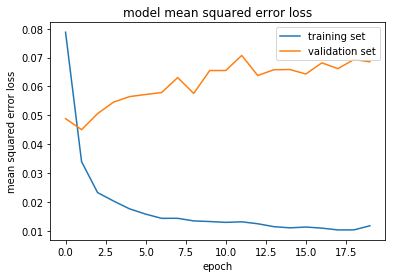

In [30]:
# model_file = 'model_berkely_drivable_and_small_2.h5'
# k_model = kerasmodel.KerasModel(model_file=model_file,
#                              load=True)
# EPOCHS = 20
# # k_model.model.summary()
# # Training the KerasModel model and getting the metrics
# model_history = k_model.train_model_with_generator(train_generator,
#                                                    train_steps_per_epoch,
#                                                    EPOCHS,
#                                                    validation_generator,
#                                                    validation_steps_per_epoch,
#                                                    save_model_filepath=model_file)
# # Plotting the model Loss
# utils.plot_loss(model_history=model_history)

##  Predict

In [124]:
image_to_predict = np.array(Image.open('test_images/straight_lines1.jpg'))
challenge_image_to_predict = np.array(Image.open('challenge_test_images/challenge1.jpg'))

In [120]:
model_file = 'model_berkely_drivable_and_small_2.h5'
k_model = kerasmodel.KerasModel(model_file=model_file,
                             load=True)
lane_image = k_model.predict(image_to_predict)
challenge_lane_image = k_model.predict(challenge_image_to_predict)

Succesfully loaded model_berkely_drivable_and_small_2.h5


(array([432, 432, 432, ..., 684, 684, 684], dtype=int64), array([633, 634, 635, ..., 339, 340, 341], dtype=int64))


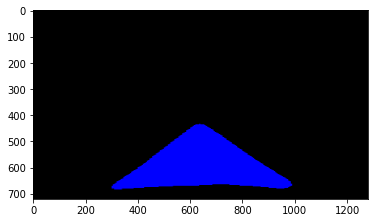

In [138]:
img = cv2.addWeighted(new_copy, 1, lane_image.astype('uint8')*255, 0.7, 0)
plt.imshow(img)

In [81]:
x = np.array([])
x.size

0

(720, 1280, 3)


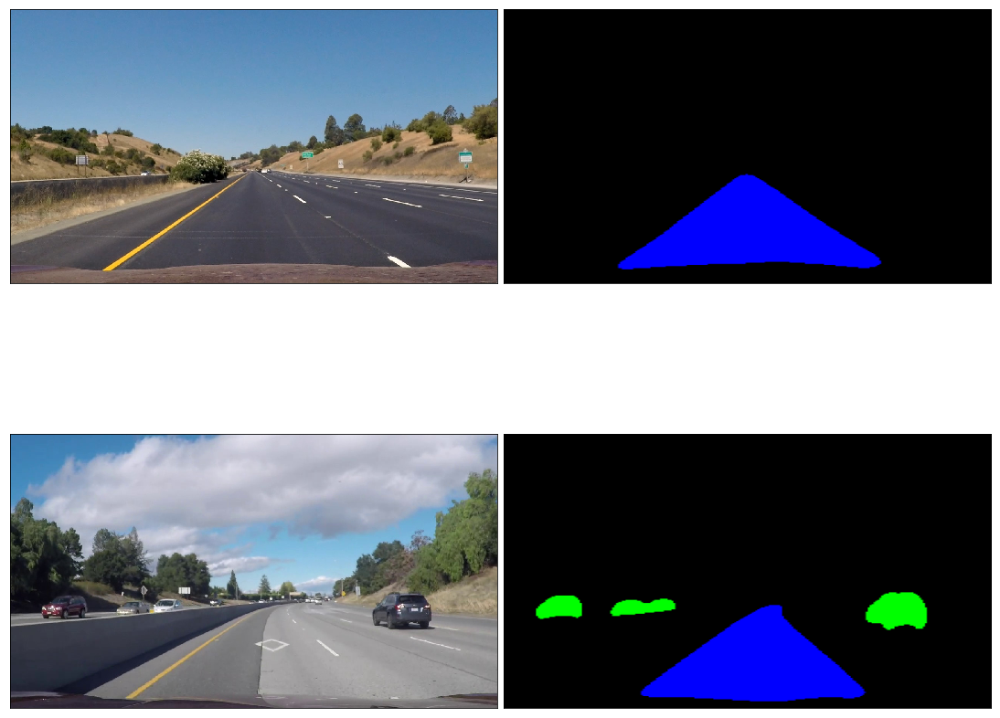

In [97]:
print(lane_image.shape)
utils.show_images([image_to_predict, lane_image, challenge_image_to_predict, challenge_lane_image], image_name='predictions', cols=2)

In [ ]:
print(lane_image.shape)
utils.show_images([image_to_predict, lane_image, challenge_image_to_predict, challenge_lane_image], image_name='predictions', cols=2)

## Difference between CV and SegNet

In [ ]:
plt.imshow(x)
plt.show()
lane_line_finder = adv_laneline_detection.LaneLineFinder(mtx, dist, k_model)
out = lane_line_finder.process_image(x)
plt.imshow(out)
plt.show()

In [ ]:
plt.imshow(x)
plt.show()
lane_line_finder = adv_laneline_detection.LaneLineFinder(mtx, dist)
out = lane_line_finder.process_image(x)
plt.imshow(out)
plt.show()

In [ ]:
x = project_undistorted_images[3]
plt.imshow(x)

plt.show()
preprocessed_image = kerasmodel.preprocess_image(x)
plt.imshow(preprocessed_image)
print(preprocessed_image.shape)
plt.show()
prediction = k_model.model.predict(preprocessed_image[None, :, :, :])
true_value = process_prediction(prediction[0], preprocessed_image)
plt.imshow(true_value[:, :, 0])
plt.show()
plt.imshow(cv2.resize(true_value, (1280, 720)))
plt.show()


# Videos

In [7]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [197]:
reload(utils)
reload(imageutils)
reload(adv_laneline_detection)
reload(kerasmodel)

<module 'kerasmodel' from 'C:\\Users\\modmo\\SelfDrivingCar\\projects\\advancedLaneFinding\\CarND-Advanced-Lane-Lines\\kerasmodel.py'>

## SegNet Videos

### Project Video

In [9]:
model_file = 'model_berkely_drivable_and_small_2.h5'
k_model = kerasmodel.KerasModel(model_file=model_file,
                             load=True)
lane_line_finder  = adv_laneline_detection.LaneLineFinder(mtx, dist, k_model)
project_output = 'videos/project_video_SEG.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(lane_line_finder.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_output, audio=False)
#Close the reader properly 
clip1.reader.close()
clip1.audio.reader.close_proc()

Succesfully loaded model_berkely_drivable_and_small_2.h5
[MoviePy] >>>> Building video videos/project_video_SEG.mp4
[MoviePy] Writing video videos/project_video_SEG.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [02:00<00:00, 10.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_SEG.mp4 

Wall time: 2min 1s


### Challenge Video

In [10]:
lane_line_finder = adv_laneline_detection.LaneLineFinder(mtx, dist, k_model)
challenge_output = 'videos/challenge_video_SEG.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(lane_line_finder.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(challenge_output, audio=False)
#Close the reader properly 
clip1.reader.close()
clip1.audio.reader.close_proc()

[MoviePy] >>>> Building video videos/challenge_video_SEG.mp4
[MoviePy] Writing video videos/challenge_video_SEG.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [00:46<00:00, 10.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/challenge_video_SEG.mp4 

Wall time: 46.8 s


### Harder Challenge Video

In [11]:
lane_line_finderlane_lin  = adv_laneline_detection.LaneLineFinder(mtx, dist, k_model)
harder_challenge_output = 'videos/harder_challenge_video_SEG.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(lane_line_finder.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(harder_challenge_output, audio=False)
#Close the reader properly 
clip1.reader.close()
clip1.audio.reader.close_proc()

[MoviePy] >>>> Building video videos/harder_challenge_video_SEG.mp4
[MoviePy] Writing video videos/harder_challenge_video_SEG.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [01:53<00:00, 10.58it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/harder_challenge_video_SEG.mp4 

Wall time: 1min 53s


## CV Videos
 And now we come to the moment of truth which is the video, this will prove or disprove all of our work until now so what are we waiting for let's do this.

### Project Video

In [210]:
lane_line_finder  = adv_laneline_detection.LaneLineFinder(mtx, dist)#, k_model)
project_output = 'videos/project_video_CV.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(lane_line_finder.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_output, audio=False)
#Close the reader properly 
clip1.reader.close()
clip1.audio.reader.close_proc()

949
841
left curv 398.2600097344613
right curv 321.97555980034406
[MoviePy] >>>> Building video videos/project_video_CV.mp4
[MoviePy] Writing video videos/project_video_CV.mp4




  0%|                                                                                         | 0/1261 [00:00<?, ?it/s]

949
841
left curv 398.2600097344613
right curv 321.97555980034406




  0%|                                                                                 | 1/1261 [00:00<07:23,  2.84it/s]

940
857
left curv 373.3074602136599
right curv 496.7448288250923




  0%|▏                                                                                | 2/1261 [00:00<07:24,  2.83it/s]

954
859
left curv 376.17853267959777
right curv 2468.899323667289




  0%|▏                                                                                | 3/1261 [00:01<07:27,  2.81it/s]

952
854
left curv 372.8071004784676
right curv 6158.428794585647




  0%|▎                                                                                | 4/1261 [00:01<07:25,  2.82it/s]

956
891
left curv 385.9160695950887
right curv 2611.7969958812555




  0%|▎                                                                                | 5/1261 [00:01<07:26,  2.82it/s]

957
853
left curv 377.0440776384723
right curv 535.397290355478




  0%|▍                                                                                | 6/1261 [00:02<07:26,  2.81it/s]

958
874
left curv 423.1285394935941
right curv 787.2603228573721




  1%|▍                                                                                | 7/1261 [00:02<07:27,  2.80it/s]

944
815
left curv 433.6054535581302
right curv 471.8333836112221




  1%|▌                                                                                | 8/1261 [00:02<07:26,  2.80it/s]

949
835
left curv 464.3336265713754
right curv 2308.998583280574




  1%|▌                                                                                | 9/1261 [00:03<07:26,  2.80it/s]

964
852
left curv 519.5922085376615
right curv 577.2708780122626




  1%|▋                                                                               | 10/1261 [00:03<07:26,  2.80it/s]

957
780
left curv 494.68270964013726
right curv 503.8478255307744




  1%|▋                                                                               | 11/1261 [00:03<07:24,  2.81it/s]

942
881
left curv 569.9139671888507
right curv 489.0459838978642




  1%|▊                                                                               | 12/1261 [00:04<07:24,  2.81it/s]

937
813
left curv 662.837889970406
right curv 446.14436787835




  1%|▊                                                                               | 13/1261 [00:04<07:23,  2.81it/s]

938
790
left curv 696.0863314344952
right curv 495.33760415649454




  1%|▉                                                                               | 14/1261 [00:04<07:23,  2.81it/s]

929
840
left curv 589.5823761262604
right curv 2569.1766086868847




  1%|▉                                                                               | 15/1261 [00:05<07:24,  2.81it/s]

931
865
left curv 537.1107658625326
right curv 3553.191878235045




  1%|█                                                                               | 16/1261 [00:05<07:25,  2.79it/s]

936
886
left curv 552.3145851980227
right curv 291589.9239658653




  1%|█                                                                               | 17/1261 [00:06<07:24,  2.80it/s]

943
813
left curv 543.0439303432771
right curv 584.3263823325738




  1%|█▏                                                                              | 18/1261 [00:06<07:23,  2.81it/s]

950
844
left curv 594.9431788671243
right curv 765.191099037471




  2%|█▏                                                                              | 19/1261 [00:06<07:21,  2.81it/s]

934
789
left curv 649.1181088407645
right curv 1070.9579046320162




  2%|█▎                                                                              | 20/1261 [00:07<07:20,  2.82it/s]

947
825
left curv 695.8855805219746
right curv 1035.3916084089994




  2%|█▎                                                                              | 21/1261 [00:07<07:19,  2.82it/s]

954
852
left curv 721.639538933372
right curv 7600.243701405233




  2%|█▍                                                                              | 22/1261 [00:07<07:18,  2.83it/s]

967
873
left curv 752.684961120509
right curv 1914.832750112312




  2%|█▍                                                                              | 23/1261 [00:08<07:18,  2.82it/s]

971
883
left curv 662.3911372636165
right curv 1110.1693949125508




  2%|█▌                                                                              | 24/1261 [00:08<07:17,  2.83it/s]

939
814
left curv 618.5490019782659
right curv 387.12546881989243




  2%|█▌                                                                              | 25/1261 [00:08<07:16,  2.83it/s]

952
781
left curv 681.732458843431
right curv 278.7570397867768




  2%|█▋                                                                              | 26/1261 [00:09<07:15,  2.83it/s]

945
846
left curv 609.1957107334616
right curv 257.761642994965




  2%|█▋                                                                              | 27/1261 [00:09<07:16,  2.83it/s]

968
858
left curv 575.6029965743442
right curv 435.3802969164735




  2%|█▊                                                                              | 28/1261 [00:09<07:15,  2.83it/s]

981
876
left curv 548.0154883042894
right curv 713.3714555892283




  2%|█▊                                                                              | 29/1261 [00:10<07:14,  2.83it/s]

972
883
left curv 430.02611635362103
right curv 1056.234521706188




  2%|█▉                                                                              | 30/1261 [00:10<07:16,  2.82it/s]

974
910
left curv 390.97084702284195
right curv 2688.981015634794




  2%|█▉                                                                              | 31/1261 [00:10<07:15,  2.82it/s]

973
850
left curv 338.53297037801724
right curv 600.6280314730897




  3%|██                                                                              | 32/1261 [00:11<07:15,  2.82it/s]

967
879
left curv 357.8171926920506
right curv 1687.996123413738




  3%|██                                                                              | 33/1261 [00:11<07:14,  2.83it/s]

968
830
left curv 331.1167856183335
right curv 298.5261951416721




  3%|██▏                                                                             | 34/1261 [00:12<07:13,  2.83it/s]

961
818
left curv 320.38859813420436
right curv 9374.356670245783




  3%|██▏                                                                             | 35/1261 [00:12<07:12,  2.83it/s]

964
864
left curv 316.36531774731327
right curv 678.512136699808




  3%|██▎                                                                             | 36/1261 [00:12<07:12,  2.83it/s]

929
783
left curv 309.09477311626915
right curv 307.9549755297842




  3%|██▎                                                                             | 37/1261 [00:13<07:11,  2.83it/s]

927
802
left curv 305.2133944309486
right curv 460.53595265774914




  3%|██▍                                                                             | 38/1261 [00:13<07:10,  2.84it/s]

921
817
left curv 286.55452722528315
right curv 913.0486906380537




  3%|██▍                                                                             | 39/1261 [00:13<07:10,  2.84it/s]

919
849
left curv 298.5822011723514
right curv 618.5793610290823




  3%|██▌                                                                             | 40/1261 [00:14<07:09,  2.84it/s]

928
844
left curv 295.56442276284815
right curv 2581.4919904770104




  3%|██▌                                                                             | 41/1261 [00:14<07:08,  2.84it/s]

935
882
left curv 282.98568550799956
right curv 521.4895614095832




  3%|██▋                                                                             | 42/1261 [00:14<07:08,  2.84it/s]

945
818
left curv 293.486665654599
right curv 316.9054109727658




  3%|██▋                                                                             | 43/1261 [00:15<07:08,  2.84it/s]

952
840
left curv 309.5917558654792
right curv 428.63743818243654




  3%|██▊                                                                             | 44/1261 [00:15<07:08,  2.84it/s]

958
859
left curv 333.1876997539983
right curv 539.646388480086




  4%|██▊                                                                             | 45/1261 [00:15<07:08,  2.84it/s]

934
825
left curv 350.2386174815687
right curv 671.9193854543901




  4%|██▉                                                                             | 46/1261 [00:16<07:07,  2.84it/s]

953
842
left curv 376.4461488598001
right curv 799.8045425138386




  4%|██▉                                                                             | 47/1261 [00:16<07:07,  2.84it/s]

958
860
left curv 388.0457415794082
right curv 2558.271574597871




  4%|███                                                                             | 48/1261 [00:16<07:06,  2.84it/s]

965
883
left curv 458.14193338513894
right curv 968.0210066906754




  4%|███                                                                             | 49/1261 [00:17<07:06,  2.84it/s]

935
776
left curv 492.93143772897014
right curv 257.3523159163867




  4%|███▏                                                                            | 50/1261 [00:17<07:06,  2.84it/s]

934
787
left curv 553.5470612382487
right curv 292.67761480189876




  4%|███▏                                                                            | 51/1261 [00:17<07:06,  2.84it/s]

930
825
left curv 581.4101162304589
right curv 427.88098657837406




  4%|███▎                                                                            | 52/1261 [00:18<07:05,  2.84it/s]

929
844
left curv 573.6011501008325
right curv 692.9026649056473




  4%|███▎                                                                            | 53/1261 [00:18<07:05,  2.84it/s]

938
883
left curv 539.924623100681
right curv 839.127685287959




  4%|███▍                                                                            | 54/1261 [00:19<07:05,  2.84it/s]

949
875
left curv 684.6421332448778
right curv 889.7077790830945




  4%|███▍                                                                            | 55/1261 [00:19<07:04,  2.84it/s]

955
906
left curv 740.1329269654974
right curv 817.124349322617




  4%|███▌                                                                            | 56/1261 [00:19<07:04,  2.84it/s]

961
844
left curv 752.4844939176145
right curv 816.6311275656356




  5%|███▌                                                                            | 57/1261 [00:20<07:04,  2.84it/s]

948
812
left curv 700.7360123513511
right curv 6370.542988854202




  5%|███▋                                                                            | 58/1261 [00:20<07:04,  2.83it/s]

940
821
left curv 580.5932010345902
right curv 22176.58162003236




  5%|███▋                                                                            | 59/1261 [00:20<07:03,  2.84it/s]

957
840
left curv 581.7518626807789
right curv 1386.4558566663554




  5%|███▊                                                                            | 60/1261 [00:21<07:03,  2.84it/s]

946
749
left curv 516.5086357514563
right curv 1359.8843805799995




  5%|███▊                                                                            | 61/1261 [00:21<07:03,  2.84it/s]

913
771
left curv 509.6784743769301
right curv 3977.1879454026353




  5%|███▉                                                                            | 62/1261 [00:21<07:02,  2.84it/s]

920
801
left curv 514.769281976044
right curv 2381.842696885541




  5%|███▉                                                                            | 63/1261 [00:22<07:02,  2.84it/s]

916
821
left curv 496.73723117196954
right curv 2725.288967964917




  5%|████                                                                            | 64/1261 [00:22<07:02,  2.84it/s]

921
840
left curv 490.42943964314287
right curv 2750.355401823462




  5%|████                                                                            | 65/1261 [00:22<07:02,  2.83it/s]

930
829
left curv 463.9083667886696
right curv 4776.4426108835605




  5%|████▏                                                                           | 66/1261 [00:23<07:01,  2.83it/s]

935
796
left curv 502.2776671790301
right curv 624.3168177081893




  5%|████▎                                                                           | 67/1261 [00:23<07:01,  2.83it/s]

944
809
left curv 519.1601163478269
right curv 592.2395240151819




  5%|████▎                                                                           | 68/1261 [00:23<07:00,  2.84it/s]

949
737
left curv 475.95597946128436
right curv 520.7720741817692




  5%|████▍                                                                           | 69/1261 [00:24<07:00,  2.84it/s]

934
752
left curv 557.5781417298905
right curv 639.003660069824




  6%|████▍                                                                           | 70/1261 [00:24<07:00,  2.84it/s]

927
787
left curv 580.1735513692134
right curv 955.4829218017292




  6%|████▌                                                                           | 71/1261 [00:25<06:59,  2.84it/s]

938
818
left curv 631.5908890448371
right curv 684.0896252651992




  6%|████▌                                                                           | 72/1261 [00:25<06:59,  2.83it/s]

964
836
left curv 734.4155639127041
right curv 505.00014738709064




  6%|████▋                                                                           | 73/1261 [00:25<06:59,  2.84it/s]

954
721
left curv 768.0912217671226
right curv 523.0436196758815




  6%|████▋                                                                           | 74/1261 [00:26<06:58,  2.84it/s]

908
760
left curv 901.3998828312184
right curv 507.8748924133156




  6%|████▊                                                                           | 75/1261 [00:26<06:58,  2.83it/s]

906
809
left curv 942.7157876760316
right curv 723.6347513076756




  6%|████▊                                                                           | 76/1261 [00:26<06:58,  2.83it/s]

922
836
left curv 1252.3690393009388
right curv 694.950125384485




  6%|████▉                                                                           | 77/1261 [00:27<06:57,  2.83it/s]

936
840
left curv 1609.8880272563217
right curv 951.080242760143




  6%|████▉                                                                           | 78/1261 [00:27<06:57,  2.83it/s]

950
860
left curv 1626.074224277368
right curv 900.5002040548505




  6%|█████                                                                           | 79/1261 [00:27<06:57,  2.83it/s]

964
899
left curv 1704.0952251452757
right curv 2480.8351933545564




  6%|█████                                                                           | 80/1261 [00:28<06:56,  2.83it/s]

959
905
left curv 1268.287092255432
right curv 2570.407423954891




  6%|█████▏                                                                          | 81/1261 [00:28<06:56,  2.83it/s]

983
861
left curv 1168.321284591324
right curv 463.7165951235274




  7%|█████▏                                                                          | 82/1261 [00:28<06:56,  2.83it/s]

966
873
left curv 1022.2526880436163
right curv 905.6883803491543




  7%|█████▎                                                                          | 83/1261 [00:29<06:55,  2.83it/s]

986
906
left curv 1328.5419759235776
right curv 1215.6675525388473




  7%|█████▎                                                                          | 84/1261 [00:29<06:55,  2.83it/s]

987
833
left curv 1007.2807026252237
right curv 1391.5785233864533




  7%|█████▍                                                                          | 85/1261 [00:30<06:55,  2.83it/s]

990
869
left curv 919.9642884936068
right curv 579.3216380813756




  7%|█████▍                                                                          | 86/1261 [00:30<06:55,  2.83it/s]

985
855
left curv 604.5901272913936
right curv 505.8680271683995




  7%|█████▌                                                                          | 87/1261 [00:30<06:54,  2.83it/s]

944
798
left curv 537.9615263124459
right curv 519.6351526892154




  7%|█████▌                                                                          | 88/1261 [00:31<06:54,  2.83it/s]

939
810
left curv 447.7696906577927
right curv 2213.699806481823




  7%|█████▋                                                                          | 89/1261 [00:31<06:54,  2.83it/s]

927
745
left curv 397.58464411815766
right curv 805.1912145312463




  7%|█████▋                                                                          | 90/1261 [00:31<06:53,  2.83it/s]

938
821
left curv 396.157919303974
right curv 908.407394282808




  7%|█████▊                                                                          | 91/1261 [00:32<06:53,  2.83it/s]

944
856
left curv 423.83956879594837
right curv 930.2678346547519




  7%|█████▊                                                                          | 92/1261 [00:32<06:53,  2.83it/s]

953
814
left curv 387.4065691352399
right curv 529.2496160859108




  7%|█████▉                                                                          | 93/1261 [00:32<06:52,  2.83it/s]

955
761
left curv 381.6202265380835
right curv 474.64022772627186




  7%|█████▉                                                                          | 94/1261 [00:33<06:52,  2.83it/s]

913
780
left curv 403.76716474013574
right curv 456.0826014159007




  8%|██████                                                                          | 95/1261 [00:33<06:52,  2.83it/s]

937
797
left curv 403.8272804302984
right curv 483.922879482131




  8%|██████                                                                          | 96/1261 [00:33<06:51,  2.83it/s]

938
787
left curv 420.77933372970153
right curv 484.6742827218242




  8%|██████▏                                                                         | 97/1261 [00:34<06:51,  2.83it/s]

945
810
left curv 425.52981405663735
right curv 397.31510135595073




  8%|██████▏                                                                         | 98/1261 [00:34<06:51,  2.83it/s]

946
721
left curv 437.9483853960337
right curv 332.9436823342734




  8%|██████▎                                                                         | 99/1261 [00:35<06:51,  2.83it/s]

919
761
left curv 464.384908944261
right curv 325.9469058691725




  8%|██████▎                                                                        | 100/1261 [00:35<06:50,  2.83it/s]

917
798
left curv 460.46073916209434
right curv 514.3963846192072




  8%|██████▎                                                                        | 101/1261 [00:35<06:50,  2.83it/s]

914
812
left curv 452.1736367901386
right curv 659.7641283127277




  8%|██████▍                                                                        | 102/1261 [00:36<06:49,  2.83it/s]

910
849
left curv 426.54406391640293
right curv 563.9968312809317




  8%|██████▍                                                                        | 103/1261 [00:36<06:49,  2.83it/s]

939
858
left curv 427.48972800822816
right curv 1108.6592585052676




  8%|██████▌                                                                        | 104/1261 [00:36<06:49,  2.83it/s]

930
848
left curv 438.8027118748683
right curv 730.4584363613084




  8%|██████▌                                                                        | 105/1261 [00:37<06:48,  2.83it/s]

939
870
left curv 459.18163883103756
right curv 1091.834465999058




  8%|██████▋                                                                        | 106/1261 [00:37<06:48,  2.83it/s]

971
902
left curv 434.042029589463
right curv 960.159625969557




  8%|██████▋                                                                        | 107/1261 [00:37<06:48,  2.83it/s]

923
851
left curv 385.60374636434335
right curv 486.320904241922




  9%|██████▊                                                                        | 108/1261 [00:38<06:47,  2.83it/s]

947
788
left curv 394.719353866474
right curv 393.1700845388976




  9%|██████▊                                                                        | 109/1261 [00:38<06:47,  2.83it/s]

936
803
left curv 390.60573444628943
right curv 606.3396717817992




  9%|██████▉                                                                        | 110/1261 [00:38<06:46,  2.83it/s]

952
852
left curv 376.54998330919545
right curv 493.2279297226002




  9%|██████▉                                                                        | 111/1261 [00:39<06:46,  2.83it/s]

970
875
left curv 421.72595937284643
right curv 417.9983291113827




  9%|███████                                                                        | 112/1261 [00:39<06:46,  2.83it/s]

934
761
left curv 396.67778504720485
right curv 311.65913556304866




  9%|███████                                                                        | 113/1261 [00:39<06:45,  2.83it/s]

924
772
left curv 380.80350387877115
right curv 319.8613604393926




  9%|███████▏                                                                       | 114/1261 [00:40<06:45,  2.83it/s]

927
798
left curv 355.76874796275723
right curv 560.3604630335228




  9%|███████▏                                                                       | 115/1261 [00:40<06:44,  2.83it/s]

926
858
left curv 338.0283311549829
right curv 635.6082344649565




  9%|███████▎                                                                       | 116/1261 [00:40<06:44,  2.83it/s]

933
864
left curv 341.5579117439894
right curv 808.2564038544722




  9%|███████▎                                                                       | 117/1261 [00:41<06:44,  2.83it/s]

935
887
left curv 336.4398347927174
right curv 891.6868041642856




  9%|███████▍                                                                       | 118/1261 [00:41<06:43,  2.83it/s]

942
820
left curv 331.64364292090426
right curv 470.6872643142599




  9%|███████▍                                                                       | 119/1261 [00:42<06:43,  2.83it/s]

938
784
left curv 315.78379022369387
right curv 349.16311035009227




 10%|███████▌                                                                       | 120/1261 [00:42<06:43,  2.83it/s]

934
800
left curv 323.2520601678786
right curv 371.45939381682354




 10%|███████▌                                                                       | 121/1261 [00:42<06:42,  2.83it/s]

930
816
left curv 330.9389556260601
right curv 430.1819452653769




 10%|███████▋                                                                       | 122/1261 [00:43<06:42,  2.83it/s]

937
750
left curv 313.56337725230486
right curv 454.80854898351953




 10%|███████▋                                                                       | 123/1261 [00:43<06:41,  2.83it/s]

938
711
left curv 327.25883967668926
right curv 423.7692999714758




 10%|███████▊                                                                       | 124/1261 [00:43<06:41,  2.83it/s]

908
783
left curv 325.1186061881762
right curv 559.7820492135316




 10%|███████▊                                                                       | 125/1261 [00:44<06:41,  2.83it/s]

918
803
left curv 354.0725579342018
right curv 648.120768094027




 10%|███████▉                                                                       | 126/1261 [00:44<06:40,  2.83it/s]

918
807
left curv 352.5041804330525
right curv 939.9659697925206




 10%|███████▉                                                                       | 127/1261 [00:44<06:40,  2.83it/s]

922
810
left curv 371.5079295966069
right curv 777.5214396713301




 10%|████████                                                                       | 128/1261 [00:45<06:39,  2.83it/s]

919
841
left curv 359.82148143081605
right curv 1049.7565058283162




 10%|████████                                                                       | 129/1261 [00:45<06:39,  2.83it/s]

926
862
left curv 384.9439569043984
right curv 662.7934563481379




 10%|████████▏                                                                      | 130/1261 [00:45<06:39,  2.83it/s]

941
806
left curv 392.15715268916887
right curv 395.0342605743989




 10%|████████▏                                                                      | 131/1261 [00:46<06:38,  2.83it/s]

940
766
left curv 373.8479861772604
right curv 404.46058969919335




 10%|████████▎                                                                      | 132/1261 [00:46<06:38,  2.83it/s]

912
787
left curv 401.18566291061234
right curv 369.4142571777683




 11%|████████▎                                                                      | 133/1261 [00:46<06:37,  2.84it/s]

924
810
left curv 421.07244306811714
right curv 459.4953635105595




 11%|████████▍                                                                      | 134/1261 [00:47<06:37,  2.84it/s]

921
797
left curv 430.36208182817455
right curv 496.14792898454596




 11%|████████▍                                                                      | 135/1261 [00:47<06:37,  2.84it/s]

948
741
left curv 449.3679671033678
right curv 441.54720351573025




 11%|████████▌                                                                      | 136/1261 [00:47<06:36,  2.84it/s]

944
780
left curv 474.5142428204591
right curv 361.0359337633544




 11%|████████▌                                                                      | 137/1261 [00:48<06:36,  2.84it/s]

924
803
left curv 491.59694142362343
right curv 489.0054867253652




 11%|████████▋                                                                      | 138/1261 [00:48<06:35,  2.84it/s]

916
821
left curv 524.2586024393177
right curv 545.3592622923854




 11%|████████▋                                                                      | 139/1261 [00:49<06:35,  2.84it/s]

932
844
left curv 558.8910395282413
right curv 635.935821101601




 11%|████████▊                                                                      | 140/1261 [00:49<06:35,  2.84it/s]

937
844
left curv 558.3621952594823
right curv 1671.1367367764112




 11%|████████▊                                                                      | 141/1261 [00:49<06:34,  2.84it/s]

946
879
left curv 597.8249992989884
right curv 907.76672804951




 11%|████████▉                                                                      | 142/1261 [00:50<06:34,  2.84it/s]

942
810
left curv 516.3238854060323
right curv 498.68194490721623




 11%|████████▉                                                                      | 143/1261 [00:50<06:34,  2.84it/s]

949
819
left curv 521.6238703908587
right curv 608.678352600246




 11%|█████████                                                                      | 144/1261 [00:50<06:33,  2.84it/s]

967
794
left curv 529.5894989450093
right curv 536.2822498361265




 11%|█████████                                                                      | 145/1261 [00:51<06:33,  2.84it/s]

940
804
left curv 516.1657964708038
right curv 380.34322101669784




 12%|█████████▏                                                                     | 146/1261 [00:51<06:33,  2.84it/s]

954
824
left curv 528.2483302752127
right curv 482.0572934181968




 12%|█████████▏                                                                     | 147/1261 [00:51<06:32,  2.84it/s]

950
810
left curv 445.36040133970147
right curv 471.3536189492781




 12%|█████████▎                                                                     | 148/1261 [00:52<06:32,  2.84it/s]

948
773
left curv 427.72009675407514
right curv 565.2865191715017




 12%|█████████▎                                                                     | 149/1261 [00:52<06:32,  2.84it/s]

958
788
left curv 471.239403691067
right curv 419.38569604600696




 12%|█████████▍                                                                     | 150/1261 [00:52<06:31,  2.84it/s]

919
817
left curv 483.311569593919
right curv 632.6647712547195




 12%|█████████▍                                                                     | 151/1261 [00:53<06:31,  2.84it/s]

922
817
left curv 525.9029140492107
right curv 597.5571312192692




 12%|█████████▌                                                                     | 152/1261 [00:53<06:31,  2.84it/s]

921
855
left curv 487.6641772025073
right curv 601.0436988615152




 12%|█████████▌                                                                     | 153/1261 [00:53<06:30,  2.84it/s]

930
876
left curv 516.736928645202
right curv 911.3312341689385




 12%|█████████▋                                                                     | 154/1261 [00:54<06:30,  2.84it/s]

952
875
left curv 500.13889366619964
right curv 1349.1064379884851




 12%|█████████▋                                                                     | 155/1261 [00:54<06:30,  2.83it/s]

951
908
left curv 495.53410007833514
right curv 1723.768879856656




 12%|█████████▊                                                                     | 156/1261 [00:55<06:29,  2.83it/s]

954
905
left curv 500.9923266724185
right curv 962.4351232490052




 12%|█████████▊                                                                     | 157/1261 [00:55<06:29,  2.83it/s]

918
792
left curv 448.97114040410963
right curv 427.1267276316072




 13%|█████████▉                                                                     | 158/1261 [00:55<06:29,  2.83it/s]

937
826
left curv 444.3606909412103
right curv 664.9808946434156




 13%|█████████▉                                                                     | 159/1261 [00:56<06:28,  2.84it/s]

938
822
left curv 406.89004792384196
right curv 479.81235646367475




 13%|██████████                                                                     | 160/1261 [00:56<06:28,  2.84it/s]

962
851
left curv 490.26980671817233
right curv 550.0809728845671




 13%|██████████                                                                     | 161/1261 [00:56<06:27,  2.84it/s]

969
778
left curv 480.3175050656016
right curv 368.5783560604122




 13%|██████████▏                                                                    | 162/1261 [00:57<06:27,  2.84it/s]

946
823
left curv 512.6632185785128
right curv 396.21624999713544




 13%|██████████▏                                                                    | 163/1261 [00:57<06:27,  2.84it/s]

941
841
left curv 474.45904378670355
right curv 628.364217136994




 13%|██████████▎                                                                    | 164/1261 [00:57<06:26,  2.84it/s]

923
818
left curv 484.7992061940629
right curv 587.7513875719789




 13%|██████████▎                                                                    | 165/1261 [00:58<06:26,  2.84it/s]

934
848
left curv 469.0936649386547
right curv 657.688352045612




 13%|██████████▍                                                                    | 166/1261 [00:58<06:26,  2.84it/s]

951
877
left curv 427.66661333249823
right curv 1100.395899491983




 13%|██████████▍                                                                    | 167/1261 [00:58<06:25,  2.84it/s]

962
903
left curv 503.24658072283233
right curv 1136.7771241601104




 13%|██████████▌                                                                    | 168/1261 [00:59<06:25,  2.84it/s]

961
844
left curv 526.4732874764957
right curv 400.7363134480874




 13%|██████████▌                                                                    | 169/1261 [00:59<06:25,  2.83it/s]

971
871
left curv 596.6373481041572
right curv 472.2114295981251




 13%|██████████▋                                                                    | 170/1261 [00:59<06:24,  2.83it/s]

956
822
left curv 626.6509541935991
right curv 247.93377428032022




 14%|██████████▋                                                                    | 171/1261 [01:00<06:24,  2.83it/s]

952
837
left curv 634.5053392450216
right curv 281.0730278962507




 14%|██████████▊                                                                    | 172/1261 [01:00<06:24,  2.83it/s]

967
860
left curv 621.2352799215765
right curv 479.10429867036794




 14%|██████████▊                                                                    | 173/1261 [01:01<06:23,  2.84it/s]

967
783
left curv 548.7153280924416
right curv 330.784247388027




 14%|██████████▉                                                                    | 174/1261 [01:01<06:23,  2.84it/s]

928
755
left curv 515.3361133802825
right curv 277.86232603292797




 14%|██████████▉                                                                    | 175/1261 [01:01<06:22,  2.84it/s]

929
828
left curv 464.01386591916594
right curv 240.8974888778877




 14%|███████████                                                                    | 176/1261 [01:02<06:22,  2.84it/s]

940
851
left curv 532.5163828307444
right curv 326.80412782686375




 14%|███████████                                                                    | 177/1261 [01:02<06:22,  2.84it/s]

946
826
left curv 515.7419354649559
right curv 297.23316269982166




 14%|███████████▏                                                                   | 178/1261 [01:02<06:21,  2.84it/s]

958
883
left curv 497.6334407520139
right curv 350.63854543329796




 14%|███████████▏                                                                   | 179/1261 [01:03<06:21,  2.84it/s]

967
901
left curv 468.2734529690816
right curv 399.91075628386966




 14%|███████████▎                                                                   | 180/1261 [01:03<06:21,  2.84it/s]

972
841
left curv 384.9705483469285
right curv 322.70036690794




 14%|███████████▎                                                                   | 181/1261 [01:03<06:20,  2.84it/s]

983
863
left curv 379.0658930164845
right curv 356.4208136186971




 14%|███████████▍                                                                   | 182/1261 [01:04<06:20,  2.84it/s]

961
806
left curv 356.18446711012894
right curv 331.31742823647966




 15%|███████████▍                                                                   | 183/1261 [01:04<06:20,  2.84it/s]

963
817
left curv 317.42293589848634
right curv 481.9794952572904




 15%|███████████▌                                                                   | 184/1261 [01:04<06:19,  2.84it/s]

974
748
left curv 292.5157733965201
right curv 896.8271893687389




 15%|███████████▌                                                                   | 185/1261 [01:05<06:19,  2.84it/s]

969
701
left curv 254.00642951778724
right curv 351.77104344303285




 15%|███████████▋                                                                   | 186/1261 [01:05<06:19,  2.84it/s]

936
782
left curv 254.3934933887242
right curv 322.7142843830312




 15%|███████████▋                                                                   | 187/1261 [01:05<06:18,  2.84it/s]

928
779
left curv 250.54530568707534
right curv 606.8305475372648




 15%|███████████▊                                                                   | 188/1261 [01:06<06:18,  2.84it/s]

922
799
left curv 257.3209044217928
right curv 459.36502043602945




 15%|███████████▊                                                                   | 189/1261 [01:06<06:18,  2.84it/s]

906
752
left curv 263.34094057420253
right curv 345.61873268304953




 15%|███████████▉                                                                   | 190/1261 [01:07<06:17,  2.84it/s]

916
710
left curv 263.3513721261352
right curv 347.0402364957815




 15%|███████████▉                                                                   | 191/1261 [01:07<06:17,  2.84it/s]

944
700
left curv 275.0545670856333
right curv 366.5892499919468




 15%|████████████                                                                   | 192/1261 [01:07<06:16,  2.84it/s]

935
744
left curv 282.7190176254463
right curv 423.4983645213677




 15%|████████████                                                                   | 193/1261 [01:08<06:16,  2.84it/s]

942
760
left curv 297.16686129535674
right curv 367.1397071941381




 15%|████████████▏                                                                  | 194/1261 [01:08<06:16,  2.84it/s]

918
780
left curv 304.34804752126183
right curv 443.0995817371408




 15%|████████████▏                                                                  | 195/1261 [01:08<06:15,  2.84it/s]

945
794
left curv 367.62846982407996
right curv 562.9986340789068




 16%|████████████▎                                                                  | 196/1261 [01:09<06:15,  2.84it/s]

963
802
left curv 438.8081897579637
right curv 762.5815499817928




 16%|████████████▎                                                                  | 197/1261 [01:09<06:14,  2.84it/s]

977
830
left curv 516.9014305117607
right curv 1732.4263748570158




 16%|████████████▍                                                                  | 198/1261 [01:09<06:14,  2.84it/s]

992
897
left curv 621.0873244159918
right curv 960.6784670258718




 16%|████████████▍                                                                  | 199/1261 [01:10<06:14,  2.84it/s]

966
913
left curv 625.8564908819535
right curv 620.0853614744723




 16%|████████████▌                                                                  | 200/1261 [01:10<06:13,  2.84it/s]

969
821
left curv 819.8403146441872
right curv 277.84779240167




 16%|████████████▌                                                                  | 201/1261 [01:10<06:13,  2.84it/s]

962
802
left curv 652.4931492747323
right curv 252.04071137702556




 16%|████████████▋                                                                  | 202/1261 [01:11<06:12,  2.84it/s]

982
870
left curv 610.6310591836348
right curv 566.267150426076




 16%|████████████▋                                                                  | 203/1261 [01:11<06:12,  2.84it/s]

986
894
left curv 556.8001610732954
right curv 554.6733920683339




 16%|████████████▊                                                                  | 204/1261 [01:11<06:12,  2.84it/s]

973
895
left curv 480.9189903690661
right curv 580.0929563048029




 16%|████████████▊                                                                  | 205/1261 [01:12<06:11,  2.84it/s]

976
833
left curv 457.39025983453394
right curv 363.9165355106697




 16%|████████████▉                                                                  | 206/1261 [01:12<06:11,  2.84it/s]

972
752
left curv 380.50288671230857
right curv 388.60839358399477




 16%|████████████▉                                                                  | 207/1261 [01:12<06:11,  2.84it/s]

945
809
left curv 345.46037663632865
right curv 1050.8135517656083




 16%|█████████████                                                                  | 208/1261 [01:13<06:10,  2.84it/s]

958
822
left curv 395.01478526350695
right curv 1116.1636170633567




 17%|█████████████                                                                  | 209/1261 [01:13<06:10,  2.84it/s]

969
844
left curv 423.5498683496306
right curv 2097.777983901802




 17%|█████████████▏                                                                 | 210/1261 [01:13<06:10,  2.84it/s]

981
885
left curv 434.065703485544
right curv 1226.7238714924501




 17%|█████████████▏                                                                 | 211/1261 [01:14<06:09,  2.84it/s]

949
799
left curv 453.1310798750238
right curv 353.38168228667257




 17%|█████████████▎                                                                 | 212/1261 [01:14<06:09,  2.84it/s]

951
822
left curv 444.8239893067025
right curv 340.57338589147787




 17%|█████████████▎                                                                 | 213/1261 [01:15<06:09,  2.84it/s]

935
841
left curv 405.25051405152647
right curv 638.3229593146368




 17%|█████████████▍                                                                 | 214/1261 [01:15<06:08,  2.84it/s]

945
841
left curv 404.7396200778231
right curv 838.1336905329985




 17%|█████████████▍                                                                 | 215/1261 [01:15<06:08,  2.84it/s]

964
880
left curv 369.8281269004513
right curv 791.2915790262957




 17%|█████████████▌                                                                 | 216/1261 [01:16<06:07,  2.84it/s]

954
898
left curv 370.30171707669115
right curv 1344.4623072288325




 17%|█████████████▌                                                                 | 217/1261 [01:16<06:07,  2.84it/s]

965
916
left curv 417.8402633987701
right curv 1573.4180340427774




 17%|█████████████▋                                                                 | 218/1261 [01:16<06:07,  2.84it/s]

966
771
left curv 394.9143377240394
right curv 639.1644895502193




 17%|█████████████▋                                                                 | 219/1261 [01:17<06:06,  2.84it/s]

935
822
left curv 443.9496603256977
right curv 758.1799888031903




 17%|█████████████▊                                                                 | 220/1261 [01:17<06:06,  2.84it/s]

952
840
left curv 512.7894823908239
right curv 811.8920549616253




 18%|█████████████▊                                                                 | 221/1261 [01:17<06:06,  2.84it/s]

963
859
left curv 524.7883829694362
right curv 833.8185528456462




 18%|█████████████▉                                                                 | 222/1261 [01:18<06:05,  2.84it/s]

968
855
left curv 588.6626925483316
right curv 522.8719144867654




 18%|█████████████▉                                                                 | 223/1261 [01:18<06:05,  2.84it/s]

914
767
left curv 538.9769891801811
right curv 654.135568134585




 18%|██████████████                                                                 | 224/1261 [01:18<06:05,  2.84it/s]

933
825
left curv 592.261921338711
right curv 462.6399719707688




 18%|██████████████                                                                 | 225/1261 [01:19<06:04,  2.84it/s]

915
840
left curv 570.5407025367596
right curv 688.961031547874




 18%|██████████████▏                                                                | 226/1261 [01:19<06:04,  2.84it/s]

924
833
left curv 606.5632719646102
right curv 762.8888028956918




 18%|██████████████▏                                                                | 227/1261 [01:19<06:03,  2.84it/s]

935
883
left curv 668.472730552738
right curv 807.5075853773343




 18%|██████████████▎                                                                | 228/1261 [01:20<06:03,  2.84it/s]

942
887
left curv 682.5866903736535
right curv 790.634325710749




 18%|██████████████▎                                                                | 229/1261 [01:20<06:03,  2.84it/s]

955
918
left curv 897.8011398667953
right curv 1350.336703842519




 18%|██████████████▍                                                                | 230/1261 [01:20<06:02,  2.84it/s]

957
848
left curv 837.3224188749743
right curv 513.8181592716203




 18%|██████████████▍                                                                | 231/1261 [01:21<06:02,  2.84it/s]

940
889
left curv 1118.4857491445782
right curv 559.0004081660529




 18%|██████████████▌                                                                | 232/1261 [01:21<06:02,  2.84it/s]

956
840
left curv 1053.0329660013035
right curv 573.6974864902767




 18%|██████████████▌                                                                | 233/1261 [01:22<06:01,  2.84it/s]

960
860
left curv 1050.762397315488
right curv 787.4417180319222




 19%|██████████████▋                                                                | 234/1261 [01:22<06:01,  2.84it/s]

969
878
left curv 1155.344766099016
right curv 490.39987898839456




 19%|██████████████▋                                                                | 235/1261 [01:22<06:01,  2.84it/s]

970
798
left curv 856.3640802608065
right curv 382.7876496857955




 19%|██████████████▊                                                                | 236/1261 [01:23<06:00,  2.84it/s]

935
821
left curv 796.6867163004589
right curv 406.5107363271973




 19%|██████████████▊                                                                | 237/1261 [01:23<06:00,  2.84it/s]

931
828
left curv 775.7630382469456
right curv 380.0286492917577




 19%|██████████████▉                                                                | 238/1261 [01:23<06:00,  2.84it/s]

932
791
left curv 680.0435540196407
right curv 366.98862224953405




 19%|██████████████▉                                                                | 239/1261 [01:24<05:59,  2.84it/s]

946
844
left curv 676.9991367594263
right curv 537.3233681588833




 19%|███████████████                                                                | 240/1261 [01:24<05:59,  2.84it/s]

946
790
left curv 616.5835182482716
right curv 303.25199679645755




 19%|███████████████                                                                | 241/1261 [01:24<05:58,  2.84it/s]

961
748
left curv 673.678681679862
right curv 323.45882042545287




 19%|███████████████▏                                                               | 242/1261 [01:25<05:58,  2.84it/s]

969
785
left curv 542.5442586870097
right curv 340.7871937515821




 19%|███████████████▏                                                               | 243/1261 [01:25<05:58,  2.84it/s]

945
806
left curv 571.940935217257
right curv 342.74669022697617




 19%|███████████████▎                                                               | 244/1261 [01:25<05:57,  2.84it/s]

966
813
left curv 533.7409054102537
right curv 549.7139828938439




 19%|███████████████▎                                                               | 245/1261 [01:26<05:57,  2.84it/s]

968
754
left curv 518.8590846050693
right curv 620.0483743809187




 20%|███████████████▍                                                               | 246/1261 [01:26<05:57,  2.84it/s]

966
767
left curv 544.3630634687382
right curv 705.1612732653757




 20%|███████████████▍                                                               | 247/1261 [01:26<05:56,  2.84it/s]

955
785
left curv 463.34495005735505
right curv 333.0897842337474




 20%|███████████████▌                                                               | 248/1261 [01:27<05:56,  2.84it/s]

937
806
left curv 533.4963353905147
right curv 467.13125302954546




 20%|███████████████▌                                                               | 249/1261 [01:27<05:56,  2.84it/s]

932
823
left curv 490.1846610577726
right curv 426.35358105534885




 20%|███████████████▋                                                               | 250/1261 [01:27<05:55,  2.84it/s]

927
802
left curv 539.7868865872989
right curv 469.42988469746865




 20%|███████████████▋                                                               | 251/1261 [01:28<05:55,  2.84it/s]

941
851
left curv 568.9291284582309
right curv 489.18340137509745




 20%|███████████████▊                                                               | 252/1261 [01:28<05:54,  2.84it/s]

951
801
left curv 561.3928089240717
right curv 349.9980291624772




 20%|███████████████▊                                                               | 253/1261 [01:28<05:54,  2.84it/s]

963
818
left curv 630.2790113950363
right curv 365.82383407709995




 20%|███████████████▉                                                               | 254/1261 [01:29<05:54,  2.84it/s]

962
770
left curv 569.3067543978519
right curv 400.63659095185056




 20%|███████████████▉                                                               | 255/1261 [01:29<05:53,  2.84it/s]

934
787
left curv 579.3827452362801
right curv 359.465136310345




 20%|████████████████                                                               | 256/1261 [01:30<05:53,  2.84it/s]

940
817
left curv 541.495281726323
right curv 333.51159657299746




 20%|████████████████                                                               | 257/1261 [01:30<05:53,  2.84it/s]

951
795
left curv 530.8607123588874
right curv 482.26780213413184




 20%|████████████████▏                                                              | 258/1261 [01:30<05:52,  2.84it/s]

956
745
left curv 573.1034074583973
right curv 414.48403275539806




 21%|████████████████▏                                                              | 259/1261 [01:31<05:52,  2.84it/s]

935
781
left curv 549.3740265357434
right curv 412.1868924919229




 21%|████████████████▎                                                              | 260/1261 [01:31<05:52,  2.84it/s]

954
813
left curv 614.7168644802838
right curv 514.247499668835




 21%|████████████████▎                                                              | 261/1261 [01:31<05:52,  2.84it/s]

925
829
left curv 606.2644971221212
right curv 611.2470962605291




 21%|████████████████▍                                                              | 262/1261 [01:32<05:51,  2.84it/s]

938
848
left curv 621.2418979310667
right curv 503.4703015410213




 21%|████████████████▍                                                              | 263/1261 [01:32<05:51,  2.84it/s]

941
836
left curv 626.7880756355006
right curv 619.3636155995079




 21%|████████████████▌                                                              | 264/1261 [01:32<05:50,  2.84it/s]

949
870
left curv 588.5953283711443
right curv 658.6999857721797




 21%|████████████████▌                                                              | 265/1261 [01:33<05:50,  2.84it/s]

960
898
left curv 631.4756186514755
right curv 680.3625924651502




 21%|████████████████▋                                                              | 266/1261 [01:33<05:50,  2.84it/s]

961
759
left curv 558.2558465318552
right curv 405.4901231842158




 21%|████████████████▋                                                              | 267/1261 [01:33<05:49,  2.84it/s]

939
778
left curv 603.0357596426419
right curv 442.7151685111203




 21%|████████████████▊                                                              | 268/1261 [01:34<05:49,  2.84it/s]

965
802
left curv 607.4898907995621
right curv 554.4911279238516




 21%|████████████████▊                                                              | 269/1261 [01:34<05:49,  2.84it/s]

970
814
left curv 656.7938234804512
right curv 568.291421106239




 21%|████████████████▉                                                              | 270/1261 [01:35<05:48,  2.84it/s]

970
855
left curv 641.1637004828314
right curv 543.5253349580903




 21%|████████████████▉                                                              | 271/1261 [01:35<05:48,  2.84it/s]

966
757
left curv 568.1607208937854
right curv 635.0739132393463




 22%|█████████████████                                                              | 272/1261 [01:35<05:48,  2.84it/s]

944
795
left curv 587.8577439002181
right curv 922.9803711405641




 22%|█████████████████                                                              | 273/1261 [01:36<05:47,  2.84it/s]

926
811
left curv 515.7730307842829
right curv 1036.3397906524078




 22%|█████████████████▏                                                             | 274/1261 [01:36<05:47,  2.84it/s]

938
748
left curv 544.7503436178152
right curv 2042.374683855947




 22%|█████████████████▏                                                             | 275/1261 [01:36<05:47,  2.84it/s]

946
836
left curv 618.8558812955619
right curv 1186.7387721394673




 22%|█████████████████▎                                                             | 276/1261 [01:37<05:46,  2.84it/s]

952
861
left curv 603.7583919787199
right curv 1563.110703678836




 22%|█████████████████▎                                                             | 277/1261 [01:37<05:46,  2.84it/s]

957
879
left curv 642.4533369607404
right curv 909.9512399879794




 22%|█████████████████▍                                                             | 278/1261 [01:37<05:45,  2.84it/s]

956
788
left curv 637.8912055675954
right curv 622.7060880429559




 22%|█████████████████▍                                                             | 279/1261 [01:38<05:45,  2.84it/s]

927
804
left curv 612.6052396471279
right curv 488.1792730293148




 22%|█████████████████▌                                                             | 280/1261 [01:38<05:45,  2.84it/s]

952
822
left curv 593.8462068466639
right curv 334.7689897443707




 22%|█████████████████▌                                                             | 281/1261 [01:38<05:44,  2.84it/s]

949
812
left curv 566.0118949495035
right curv 470.38397989714537




 22%|█████████████████▋                                                             | 282/1261 [01:39<05:44,  2.84it/s]

954
835
left curv 648.3503193836192
right curv 595.9723419152839




 22%|█████████████████▋                                                             | 283/1261 [01:39<05:44,  2.84it/s]

958
768
left curv 637.1136949809037
right curv 426.161239390226




 23%|█████████████████▊                                                             | 284/1261 [01:39<05:43,  2.84it/s]

942
819
left curv 702.1640006572817
right curv 643.2196300844331




 23%|█████████████████▊                                                             | 285/1261 [01:40<05:43,  2.84it/s]

954
846
left curv 657.9861484390725
right curv 783.5246670484744




 23%|█████████████████▉                                                             | 286/1261 [01:40<05:43,  2.84it/s]

947
849
left curv 777.2222630903755
right curv 1062.4754856770023




 23%|█████████████████▉                                                             | 287/1261 [01:41<05:42,  2.84it/s]

951
884
left curv 771.0027460479228
right curv 1612.319740481538




 23%|██████████████████                                                             | 288/1261 [01:41<05:42,  2.84it/s]

954
879
left curv 694.4470546118341
right curv 1531.0973807721161




 23%|██████████████████                                                             | 289/1261 [01:41<05:42,  2.84it/s]

972
900
left curv 843.4345792366441
right curv 1326.19692922804




 23%|██████████████████▏                                                            | 290/1261 [01:42<05:41,  2.84it/s]

954
764
left curv 713.0783969995412
right curv 658.1241028338318




 23%|██████████████████▏                                                            | 291/1261 [01:42<05:41,  2.84it/s]

925
765
left curv 796.2599847804623
right curv 393.9800584419187




 23%|██████████████████▎                                                            | 292/1261 [01:42<05:41,  2.84it/s]

944
786
left curv 811.0581232462142
right curv 320.23978223890555




 23%|██████████████████▎                                                            | 293/1261 [01:43<05:40,  2.84it/s]

958
804
left curv 803.0468189941731
right curv 381.2865616581244




 23%|██████████████████▍                                                            | 294/1261 [01:43<05:40,  2.84it/s]

948
823
left curv 827.9694477417238
right curv 579.5259955648941




 23%|██████████████████▍                                                            | 295/1261 [01:43<05:40,  2.84it/s]

956
788
left curv 820.8005571119086
right curv 609.1326681741485




 23%|██████████████████▌                                                            | 296/1261 [01:44<05:39,  2.84it/s]

938
806
left curv 900.1406602884922
right curv 3758.586177327968




 24%|██████████████████▌                                                            | 297/1261 [01:44<05:39,  2.84it/s]

939
812
left curv 946.4036248807527
right curv 61275.34082087751




 24%|██████████████████▋                                                            | 298/1261 [01:44<05:38,  2.84it/s]

939
840
left curv 1046.8260570969671
right curv 3131.196833389476




 24%|██████████████████▋                                                            | 299/1261 [01:45<05:38,  2.84it/s]

959
867
left curv 1054.6149150406345
right curv 1338.9756125201973




 24%|██████████████████▊                                                            | 300/1261 [01:45<05:38,  2.84it/s]

961
845
left curv 1179.7288489793527
right curv 2733.9443251268312




 24%|██████████████████▊                                                            | 301/1261 [01:45<05:37,  2.84it/s]

960
869
left curv 1141.4142084515036
right curv 1288.9350509297617




 24%|██████████████████▉                                                            | 302/1261 [01:46<05:37,  2.84it/s]

964
894
left curv 1080.2731583716625
right curv 1999.6509935436986




 24%|██████████████████▉                                                            | 303/1261 [01:46<05:37,  2.84it/s]

981
829
left curv 1403.4463767334414
right curv 802.5263502550914




 24%|███████████████████                                                            | 304/1261 [01:47<05:36,  2.84it/s]

957
849
left curv 1690.1928870515994
right curv 670.6227468064593




 24%|███████████████████                                                            | 305/1261 [01:47<05:36,  2.84it/s]

958
812
left curv 1544.8640225474562
right curv 700.7481752369342




 24%|███████████████████▏                                                           | 306/1261 [01:47<05:36,  2.84it/s]

966
843
left curv 1536.7531766348109
right curv 1570.6104997260863




 24%|███████████████████▏                                                           | 307/1261 [01:48<05:35,  2.84it/s]

963
800
left curv 1375.40525199115
right curv 5246.638435309381




 24%|███████████████████▎                                                           | 308/1261 [01:48<05:35,  2.84it/s]

931
817
left curv 1652.151808952937
right curv 4235.2277079945225




 25%|███████████████████▎                                                           | 309/1261 [01:48<05:35,  2.84it/s]

938
822
left curv 2324.6504094577394
right curv 15378.944054327008




 25%|███████████████████▍                                                           | 310/1261 [01:49<05:34,  2.84it/s]

919
824
left curv 2420.634091400868
right curv 24482.277911141286




 25%|███████████████████▍                                                           | 311/1261 [01:49<05:34,  2.84it/s]

932
826
left curv 2793.7665545366845
right curv 7438.701857991265




 25%|███████████████████▌                                                           | 312/1261 [01:49<05:34,  2.84it/s]

928
740
left curv 2485.9633515588685
right curv 749.9899201159683




 25%|███████████████████▌                                                           | 313/1261 [01:50<05:33,  2.84it/s]

935
762
left curv 4585.0436482397145
right curv 847.2530294028214




 25%|███████████████████▋                                                           | 314/1261 [01:50<05:33,  2.84it/s]

943
770
left curv 10661.336795802023
right curv 1251.618273047503




 25%|███████████████████▋                                                           | 315/1261 [01:50<05:33,  2.84it/s]

917
760
left curv 46437.700215088495
right curv 890.9850110033303




 25%|███████████████████▊                                                           | 316/1261 [01:51<05:32,  2.84it/s]

940
779
left curv 30066.828304593822
right curv 452.92602926841187




 25%|███████████████████▊                                                           | 317/1261 [01:51<05:32,  2.84it/s]

941
738
left curv 23029.89340097398
right curv 1058.4420971166264




 25%|███████████████████▉                                                           | 318/1261 [01:51<05:32,  2.84it/s]

941
750
left curv 11811.20196359173
right curv 1220.8137747439725




 25%|███████████████████▉                                                           | 319/1261 [01:52<05:31,  2.84it/s]

934
761
left curv 5837.262208847807
right curv 1058.2326859379752




 25%|████████████████████                                                           | 320/1261 [01:52<05:31,  2.84it/s]

903
777
left curv 2837.903849639107
right curv 1516.2996110207396




 25%|████████████████████                                                           | 321/1261 [01:53<05:31,  2.84it/s]

913
795
left curv 2677.647711603303
right curv 13109.285645453805




 26%|████████████████████▏                                                          | 322/1261 [01:53<05:30,  2.84it/s]

915
770
left curv 4743.904017465083
right curv 1855.7694362547343




 26%|████████████████████▏                                                          | 323/1261 [01:53<05:30,  2.84it/s]

928
805
left curv 6240.01361690408
right curv 2918.1730111062743




 26%|████████████████████▎                                                          | 324/1261 [01:54<05:30,  2.84it/s]

929
834
left curv 76430.01648755893
right curv 11843.012497413738




 26%|████████████████████▎                                                          | 325/1261 [01:54<05:29,  2.84it/s]

934
801
left curv 10078.374316070882
right curv 992.8846582491171




 26%|████████████████████▍                                                          | 326/1261 [01:54<05:29,  2.84it/s]

944
791
left curv 225536.9362552531
right curv 954.0403209482683




 26%|████████████████████▍                                                          | 327/1261 [01:55<05:29,  2.84it/s]

948
781
left curv 28104.629062568674
right curv 983.9120662678379




 26%|████████████████████▌                                                          | 328/1261 [01:55<05:29,  2.84it/s]

964
834
left curv 17857.17305698796
right curv 677.8494249522859




 26%|████████████████████▌                                                          | 329/1261 [01:56<05:28,  2.84it/s]

954
812
left curv 11958.585176591883
right curv 878.9858733365403




 26%|████████████████████▋                                                          | 330/1261 [01:56<05:28,  2.83it/s]

954
812
left curv 23081.73621726036
right curv 17844.121970334203




 26%|████████████████████▋                                                          | 331/1261 [01:56<05:28,  2.83it/s]

946
756
left curv 51847.27506677304
right curv 2298.320211858538




 26%|████████████████████▊                                                          | 332/1261 [01:57<05:27,  2.83it/s]

924
782
left curv 49652.13450830309
right curv 1096.6266267194374




 26%|████████████████████▊                                                          | 333/1261 [01:57<05:27,  2.83it/s]

921
794
left curv 7602.438569782864
right curv 1764.8639786114456




 26%|████████████████████▉                                                          | 334/1261 [01:57<05:27,  2.83it/s]

923
770
left curv 26502.274546700643
right curv 8639.501537919228




 27%|████████████████████▉                                                          | 335/1261 [01:58<05:26,  2.83it/s]

941
806
left curv 10622.04123282216
right curv 4290.143233164015




 27%|█████████████████████                                                          | 336/1261 [01:58<05:26,  2.83it/s]

946
839
left curv 20538.18241978194
right curv 1710.6199825536014




 27%|█████████████████████                                                          | 337/1261 [01:58<05:26,  2.83it/s]

949
800
left curv 9472.019816618827
right curv 2571.53723426636




 27%|█████████████████████▏                                                         | 338/1261 [01:59<05:25,  2.83it/s]

950
817
left curv 10736.333099109735
right curv 1641.6216940462323




 27%|█████████████████████▏                                                         | 339/1261 [01:59<05:25,  2.83it/s]

953
775
left curv 20761.827257128647
right curv 1739.9644261756416




 27%|█████████████████████▎                                                         | 340/1261 [02:00<05:25,  2.83it/s]

943
790
left curv 38945.46462024538
right curv 764.0194380103379




 27%|█████████████████████▎                                                         | 341/1261 [02:00<05:24,  2.83it/s]

924
766
left curv 6872.419638341818
right curv 2863.9862618923744




 27%|█████████████████████▍                                                         | 342/1261 [02:00<05:24,  2.83it/s]

942
723
left curv 92249.74745705818
right curv 2208.286064474628




 27%|█████████████████████▍                                                         | 343/1261 [02:01<05:24,  2.83it/s]

946
744
left curv 12880.211132710727
right curv 26892.36636910587




 27%|█████████████████████▌                                                         | 344/1261 [02:01<05:24,  2.83it/s]

926
796
left curv 22500.42332246685
right curv 1466.0145921350809




 27%|█████████████████████▌                                                         | 345/1261 [02:01<05:23,  2.83it/s]

930
824
left curv 28939.02111843214
right curv 1756.2460543052366




 27%|█████████████████████▋                                                         | 346/1261 [02:02<05:23,  2.83it/s]

926
839
left curv 4003.001993714635
right curv 1531.3861986021755




 28%|█████████████████████▋                                                         | 347/1261 [02:02<05:23,  2.83it/s]

936
861
left curv 4805.309508640469
right curv 1693.0813601867221




 28%|█████████████████████▊                                                         | 348/1261 [02:03<05:22,  2.83it/s]

939
831
left curv 2457.665825990941
right curv 2931.358724352194




 28%|█████████████████████▊                                                         | 349/1261 [02:03<05:22,  2.83it/s]

945
872
left curv 2732.4976339032432
right curv 4825.001080328007




 28%|█████████████████████▉                                                         | 350/1261 [02:03<05:22,  2.83it/s]

946
886
left curv 2224.2277457352625
right curv 13131.89326911626




 28%|█████████████████████▉                                                         | 351/1261 [02:04<05:21,  2.83it/s]

950
854
left curv 2042.5375903717104
right curv 918.9229704210485




 28%|██████████████████████                                                         | 352/1261 [02:04<05:21,  2.83it/s]

947
814
left curv 2181.6486875144983
right curv 606.5398091118552




 28%|██████████████████████                                                         | 353/1261 [02:04<05:21,  2.83it/s]

958
851
left curv 2200.179568376311
right curv 556.6578061434143




 28%|██████████████████████▏                                                        | 354/1261 [02:05<05:20,  2.83it/s]

966
858
left curv 2372.0394832234338
right curv 771.3638158569713




 28%|██████████████████████▏                                                        | 355/1261 [02:05<05:20,  2.83it/s]

962
774
left curv 3370.596774164784
right curv 809.2293459783979




 28%|██████████████████████▎                                                        | 356/1261 [02:05<05:20,  2.83it/s]

932
770
left curv 9330.02343238387
right curv 2453.9201286595885




 28%|██████████████████████▎                                                        | 357/1261 [02:06<05:19,  2.83it/s]

933
832
left curv 44937.194328957565
right curv 4506.546561007849




 28%|██████████████████████▍                                                        | 358/1261 [02:06<05:19,  2.83it/s]

924
834
left curv 3716.079193788889
right curv 3240.2217716673463




 28%|██████████████████████▍                                                        | 359/1261 [02:07<05:19,  2.83it/s]

929
854
left curv 2407.244371266721
right curv 13548.091036359398




 29%|██████████████████████▌                                                        | 360/1261 [02:07<05:18,  2.83it/s]

932
857
left curv 1937.6744840798297
right curv 12259.09707140133




 29%|██████████████████████▌                                                        | 361/1261 [02:07<05:18,  2.82it/s]

948
817
left curv 1208.6061443900712
right curv 1454.9985732712591




 29%|██████████████████████▋                                                        | 362/1261 [02:08<05:18,  2.82it/s]

940
830
left curv 1051.459717363178
right curv 993.6491575568665




 29%|██████████████████████▋                                                        | 363/1261 [02:08<05:17,  2.82it/s]

944
762
left curv 913.4796666881641
right curv 1067.4261322176167




 29%|██████████████████████▊                                                        | 364/1261 [02:08<05:17,  2.82it/s]

917
805
left curv 899.4129563525255
right curv 1290.3309033581997




 29%|██████████████████████▊                                                        | 365/1261 [02:09<05:17,  2.82it/s]

935
803
left curv 906.8522090114641
right curv 1574.8462353733323




 29%|██████████████████████▉                                                        | 366/1261 [02:09<05:16,  2.82it/s]

934
717
left curv 869.0718281344713
right curv 3149.478811345479




 29%|██████████████████████▉                                                        | 367/1261 [02:09<05:16,  2.82it/s]

929
752
left curv 781.4983186636423
right curv 2357.6375680556057




 29%|███████████████████████                                                        | 368/1261 [02:10<05:16,  2.82it/s]

923
771
left curv 999.1017797787714
right curv 2609.3088609196775




 29%|███████████████████████                                                        | 369/1261 [02:10<05:16,  2.82it/s]

929
789
left curv 987.2257643580087
right curv 1904.5088805682028




 29%|███████████████████████▏                                                       | 370/1261 [02:11<05:15,  2.82it/s]

921
821
left curv 1200.1588953683995
right curv 3129.8428761041523




 29%|███████████████████████▏                                                       | 371/1261 [02:11<05:15,  2.82it/s]

937
812
left curv 1559.6996204999039
right curv 1338.2183821565743




 30%|███████████████████████▎                                                       | 372/1261 [02:11<05:15,  2.82it/s]

951
834
left curv 2282.9254176237805
right curv 5338.730136836902




 30%|███████████████████████▎                                                       | 373/1261 [02:12<05:15,  2.82it/s]

946
848
left curv 4725.016256033521
right curv 2419.193617593912




 30%|███████████████████████▍                                                       | 374/1261 [02:12<05:14,  2.82it/s]

952
816
left curv 15668.117563533906
right curv 2000.4797055733618




 30%|███████████████████████▍                                                       | 375/1261 [02:13<05:14,  2.82it/s]

961
761
left curv 7942.540298982481
right curv 1684.624938379411




 30%|███████████████████████▌                                                       | 376/1261 [02:13<05:14,  2.82it/s]

943
805
left curv 4297.301572913215
right curv 1124.4388440566738




 30%|███████████████████████▌                                                       | 377/1261 [02:13<05:13,  2.82it/s]

945
712
left curv 2798.8766906204114
right curv 3972.8127752627283




 30%|███████████████████████▋                                                       | 378/1261 [02:14<05:13,  2.82it/s]

951
729
left curv 2094.530094616906
right curv 2782.6299210410516




 30%|███████████████████████▋                                                       | 379/1261 [02:14<05:13,  2.82it/s]

953
764
left curv 1774.9542063164376
right curv 14616.675514085828




 30%|███████████████████████▊                                                       | 380/1261 [02:14<05:12,  2.82it/s]

938
767
left curv 2109.796963425269
right curv 1708.2154853862098




 30%|███████████████████████▊                                                       | 381/1261 [02:15<05:12,  2.82it/s]

938
801
left curv 1821.160592163821
right curv 2083.7340931966705




 30%|███████████████████████▉                                                       | 382/1261 [02:15<05:12,  2.82it/s]

923
811
left curv 1626.552570158903
right curv 808.9249842490625




 30%|███████████████████████▉                                                       | 383/1261 [02:15<05:11,  2.82it/s]

932
844
left curv 1840.791781425094
right curv 2017.7619957270192




 30%|████████████████████████                                                       | 384/1261 [02:16<05:11,  2.82it/s]

936
826
left curv 1563.7879163525552
right curv 2732.031050329094




 31%|████████████████████████                                                       | 385/1261 [02:16<05:11,  2.82it/s]

949
854
left curv 2039.0997980740779
right curv 3830.296224280578




 31%|████████████████████████▏                                                      | 386/1261 [02:17<05:10,  2.82it/s]

948
883
left curv 2154.850777359215
right curv 3351.3944592679823




 31%|████████████████████████▏                                                      | 387/1261 [02:17<05:10,  2.82it/s]

947
895
left curv 1852.504047292651
right curv 2332.9046477603783




 31%|████████████████████████▎                                                      | 388/1261 [02:17<05:10,  2.82it/s]

936
901
left curv 2355.9515539940294
right curv 993.3883627736224




 31%|████████████████████████▎                                                      | 389/1261 [02:18<05:09,  2.82it/s]

945
823
left curv 2899.876973769001
right curv 1174.496957624533




 31%|████████████████████████▍                                                      | 390/1261 [02:18<05:09,  2.82it/s]

969
866
left curv 2563.8128056293945
right curv 1852.335479365525




 31%|████████████████████████▍                                                      | 391/1261 [02:18<05:08,  2.82it/s]

944
885
left curv 3135.4688918143192
right curv 4258.403602772603




 31%|████████████████████████▌                                                      | 392/1261 [02:19<05:08,  2.82it/s]

929
808
left curv 2783.0544194685976
right curv 1898.7031641832284




 31%|████████████████████████▌                                                      | 393/1261 [02:19<05:08,  2.82it/s]

926
806
left curv 2816.0107305705806
right curv 7637.09819234086




 31%|████████████████████████▋                                                      | 394/1261 [02:19<05:07,  2.82it/s]

924
820
left curv 4400.069065913461
right curv 2758.0324705475637




 31%|████████████████████████▋                                                      | 395/1261 [02:20<05:07,  2.82it/s]

937
863
left curv 7016.168743439895
right curv 1242.3024218248383




 31%|████████████████████████▊                                                      | 396/1261 [02:20<05:07,  2.82it/s]

950
874
left curv 3005.3505682635177
right curv 1489.5205712133152




 31%|████████████████████████▊                                                      | 397/1261 [02:21<05:06,  2.82it/s]

953
910
left curv 2994.6060137160107
right curv 969.5077548827588




 32%|████████████████████████▉                                                      | 398/1261 [02:21<05:06,  2.81it/s]

956
895
left curv 2693.293444654305
right curv 904.5882038767579




 32%|████████████████████████▉                                                      | 399/1261 [02:21<05:06,  2.81it/s]

968
920
left curv 4000.1224829438106
right curv 2881.275444756799




 32%|█████████████████████████                                                      | 400/1261 [02:22<05:05,  2.81it/s]

950
922
left curv 6470.547953890515
right curv 99461.99494248052




 32%|█████████████████████████                                                      | 401/1261 [02:22<05:05,  2.81it/s]

951
942
left curv 5245.86969210138
right curv 2103.739002560574




 32%|█████████████████████████▏                                                     | 402/1261 [02:22<05:05,  2.81it/s]

948
845
left curv 12693.738388152626
right curv 1806.8690642677143




 32%|█████████████████████████▏                                                     | 403/1261 [02:23<05:04,  2.81it/s]

952
849
left curv 64436.08998406282
right curv 1193.4396809561028




 32%|█████████████████████████▎                                                     | 404/1261 [02:23<05:04,  2.81it/s]

929
893
left curv 25967.419118759368
right curv 960.2435799388109




 32%|█████████████████████████▎                                                     | 405/1261 [02:23<05:04,  2.81it/s]

932
916
left curv 10776.294262546926
right curv 2910.623209854519




 32%|█████████████████████████▍                                                     | 406/1261 [02:24<05:03,  2.81it/s]

935
831
left curv 45469.21114122123
right curv 4602.3058465093745




 32%|█████████████████████████▍                                                     | 407/1261 [02:24<05:03,  2.81it/s]

943
845
left curv 38580.47052022438
right curv 21882.516382515532




 32%|█████████████████████████▌                                                     | 408/1261 [02:24<05:03,  2.81it/s]

947
895
left curv 19487.328730280635
right curv 5269.095024943326




 32%|█████████████████████████▌                                                     | 409/1261 [02:25<05:02,  2.81it/s]

942
913
left curv 5417.029444022054
right curv 1498.612449917048




 33%|█████████████████████████▋                                                     | 410/1261 [02:25<05:02,  2.81it/s]

968
892
left curv 5316.812286788345
right curv 1349.510789832233




 33%|█████████████████████████▋                                                     | 411/1261 [02:26<05:02,  2.81it/s]

968
919
left curv 4251.802534511431
right curv 1677.3505503952215




 33%|█████████████████████████▊                                                     | 412/1261 [02:26<05:01,  2.81it/s]

961
919
left curv 4228.1920496085895
right curv 1391.2498836833854




 33%|█████████████████████████▊                                                     | 413/1261 [02:26<05:01,  2.81it/s]

974
934
left curv 3051.5683791541205
right curv 676.1020862647872




 33%|█████████████████████████▉                                                     | 414/1261 [02:27<05:00,  2.81it/s]

948
854
left curv 2367.580621540238
right curv 1396.988912617626




 33%|█████████████████████████▉                                                     | 415/1261 [02:27<05:00,  2.81it/s]

954
879
left curv 2335.6948842176967
right curv 2983.3130063820618




 33%|██████████████████████████                                                     | 416/1261 [02:27<05:00,  2.81it/s]

939
892
left curv 1773.495748374247
right curv 1807.086429059777




 33%|██████████████████████████                                                     | 417/1261 [02:28<04:59,  2.81it/s]

930
912
left curv 1935.7398145992724
right curv 1976.2419460392139




 33%|██████████████████████████▏                                                    | 418/1261 [02:28<04:59,  2.81it/s]

943
821
left curv 2805.121452883721
right curv 7657.058410554265




 33%|██████████████████████████▏                                                    | 419/1261 [02:28<04:59,  2.81it/s]

929
873
left curv 1973.0017150026579
right curv 2643.1433690350527




 33%|██████████████████████████▎                                                    | 420/1261 [02:29<04:58,  2.81it/s]

951
870
left curv 1979.8573734617441
right curv 1071.3037086737095




 33%|██████████████████████████▍                                                    | 421/1261 [02:29<04:58,  2.81it/s]

940
853
left curv 2256.4814900542146
right curv 1066.3322410983346




 33%|██████████████████████████▍                                                    | 422/1261 [02:29<04:58,  2.81it/s]

947
876
left curv 1870.3807743415969
right curv 2626.1753317485623




 34%|██████████████████████████▌                                                    | 423/1261 [02:30<04:57,  2.81it/s]

949
897
left curv 2251.7631716236106
right curv 1985.7865458235383




 34%|██████████████████████████▌                                                    | 424/1261 [02:30<04:57,  2.81it/s]

948
916
left curv 2081.1749940332397
right curv 899.0503717047654




 34%|██████████████████████████▋                                                    | 425/1261 [02:31<04:57,  2.81it/s]

950
946
left curv 2503.3996270764105
right curv 1020.2458474298797




 34%|██████████████████████████▋                                                    | 426/1261 [02:31<04:56,  2.81it/s]

970
885
left curv 2519.797819191187
right curv 885.0925717593468




 34%|██████████████████████████▊                                                    | 427/1261 [02:31<04:56,  2.81it/s]

953
887
left curv 4617.977192943688
right curv 833.7969208503383




 34%|██████████████████████████▊                                                    | 428/1261 [02:32<04:56,  2.81it/s]

935
902
left curv 7207.699640087354
right curv 1383.9416282252023




 34%|██████████████████████████▉                                                    | 429/1261 [02:32<04:55,  2.81it/s]

935
852
left curv 34816.78665052769
right curv 2190.268792481808




 34%|██████████████████████████▉                                                    | 430/1261 [02:32<04:55,  2.81it/s]

943
834
left curv 27277.27660954398
right curv 5815.446435446642




 34%|███████████████████████████                                                    | 431/1261 [02:33<04:55,  2.81it/s]

943
840
left curv 33013.80571562813
right curv 143177.3000254479




 34%|███████████████████████████                                                    | 432/1261 [02:33<04:54,  2.81it/s]

966
916
left curv 156671.011244132
right curv 5631.053460041808




 34%|███████████████████████████▏                                                   | 433/1261 [02:33<04:54,  2.81it/s]

967
931
left curv 20796.418450998583
right curv 3095.8505218913756




 34%|███████████████████████████▏                                                   | 434/1261 [02:34<04:53,  2.81it/s]

958
902
left curv 6341.227209117267
right curv 7771.205511029479




 34%|███████████████████████████▎                                                   | 435/1261 [02:34<04:53,  2.81it/s]

969
919
left curv 3363.084831285108
right curv 10300.038092053328




 35%|███████████████████████████▎                                                   | 436/1261 [02:35<04:53,  2.81it/s]

966
837
left curv 2945.1982164425226
right curv 1148.353559100641




 35%|███████████████████████████▍                                                   | 437/1261 [02:35<04:52,  2.81it/s]

956
858
left curv 2975.183593823408
right curv 630.734125446752




 35%|███████████████████████████▍                                                   | 438/1261 [02:35<04:52,  2.81it/s]

955
837
left curv 2193.5427174962965
right curv 835.7887590629766




 35%|███████████████████████████▌                                                   | 439/1261 [02:36<04:52,  2.81it/s]

947
831
left curv 2436.342979261493
right curv 3367.263138040422




 35%|███████████████████████████▌                                                   | 440/1261 [02:36<04:51,  2.81it/s]

929
807
left curv 2315.3006514587264
right curv 27866.565731273895




 35%|███████████████████████████▋                                                   | 441/1261 [02:36<04:51,  2.81it/s]

930
786
left curv 2958.22367289693
right curv 15715.113335351874




 35%|███████████████████████████▋                                                   | 442/1261 [02:37<04:51,  2.81it/s]

942
855
left curv 2880.1441925214085
right curv 3906.146633862105




 35%|███████████████████████████▊                                                   | 443/1261 [02:37<04:50,  2.81it/s]

954
870
left curv 2247.7835068668837
right curv 4682.072453401915




 35%|███████████████████████████▊                                                   | 444/1261 [02:37<04:50,  2.81it/s]

976
868
left curv 1982.0304995153401
right curv 3924.1445676875833




 35%|███████████████████████████▉                                                   | 445/1261 [02:38<04:50,  2.81it/s]

962
888
left curv 2217.258740698669
right curv 9291.047910394902




 35%|███████████████████████████▉                                                   | 446/1261 [02:38<04:49,  2.81it/s]

972
854
left curv 2237.0640925629696
right curv 812071.0496921245




 35%|████████████████████████████                                                   | 447/1261 [02:38<04:49,  2.81it/s]

975
877
left curv 2920.016231982054
right curv 216828.5671451227




 36%|████████████████████████████                                                   | 448/1261 [02:39<04:49,  2.81it/s]

965
775
left curv 2479.0758817066926
right curv 2359.998418155044




 36%|████████████████████████████▏                                                  | 449/1261 [02:39<04:48,  2.81it/s]

965
820
left curv 3798.54017003029
right curv 817.1258108049049




 36%|████████████████████████████▏                                                  | 450/1261 [02:40<04:48,  2.81it/s]

967
832
left curv 3594.8624284554576
right curv 1610.3169949828093




 36%|████████████████████████████▎                                                  | 451/1261 [02:40<04:48,  2.81it/s]

966
848
left curv 5276.808500732229
right curv 2488.152264801379




 36%|████████████████████████████▎                                                  | 452/1261 [02:40<04:47,  2.81it/s]

957
813
left curv 9690.576118660756
right curv 1283.3452868197119




 36%|████████████████████████████▍                                                  | 453/1261 [02:41<04:47,  2.81it/s]

939
809
left curv 117650.11429990892
right curv 2296.206845743046




 36%|████████████████████████████▍                                                  | 454/1261 [02:41<04:47,  2.81it/s]

940
813
left curv 7716.847983580562
right curv 1393.398004622444




 36%|████████████████████████████▌                                                  | 455/1261 [02:41<04:46,  2.81it/s]

952
819
left curv 5176.069824443643
right curv 3326.5229287763054




 36%|████████████████████████████▌                                                  | 456/1261 [02:42<04:46,  2.81it/s]

951
817
left curv 3060.558377593114
right curv 6824.819285857112




 36%|████████████████████████████▋                                                  | 457/1261 [02:42<04:46,  2.81it/s]

952
842
left curv 2950.1884795572078
right curv 5575.536051010872




 36%|████████████████████████████▋                                                  | 458/1261 [02:42<04:45,  2.81it/s]

948
834
left curv 2024.3425667872777
right curv 13968.244534117019




 36%|████████████████████████████▊                                                  | 459/1261 [02:43<04:45,  2.81it/s]

956
829
left curv 1677.505509139296
right curv 18712.203646264334




 36%|████████████████████████████▊                                                  | 460/1261 [02:43<04:44,  2.81it/s]

943
817
left curv 1553.2511310493442
right curv 3144.6425749995856




 37%|████████████████████████████▉                                                  | 461/1261 [02:44<04:44,  2.81it/s]

957
801
left curv 1600.8442496997045
right curv 3165.851639126537




 37%|████████████████████████████▉                                                  | 462/1261 [02:44<04:44,  2.81it/s]

960
826
left curv 1703.7030938832359
right curv 2848.9734504281178




 37%|█████████████████████████████                                                  | 463/1261 [02:44<04:43,  2.81it/s]

957
861
left curv 1491.1031476136195
right curv 1887.345594707878




 37%|█████████████████████████████                                                  | 464/1261 [02:45<04:43,  2.81it/s]

945
826
left curv 1473.9864396283017
right curv 1723.776113816015




 37%|█████████████████████████████▏                                                 | 465/1261 [02:45<04:43,  2.81it/s]

938
826
left curv 1486.93356797848
right curv 1223.442399093264




 37%|█████████████████████████████▏                                                 | 466/1261 [02:45<04:42,  2.81it/s]

941
848
left curv 1626.5704884957474
right curv 863.8916331576795




 37%|█████████████████████████████▎                                                 | 467/1261 [02:46<04:42,  2.81it/s]

941
862
left curv 1875.6495329913575
right curv 758.1158004037725




 37%|█████████████████████████████▎                                                 | 468/1261 [02:46<04:42,  2.81it/s]

940
881
left curv 1834.2140378651084
right curv 892.3040936149831




 37%|█████████████████████████████▍                                                 | 469/1261 [02:46<04:41,  2.81it/s]

948
913
left curv 1986.492839940027
right curv 848.4451571191722




 37%|█████████████████████████████▍                                                 | 470/1261 [02:47<04:41,  2.81it/s]

951
886
left curv 3017.3564138401853
right curv 1211.797724424539




 37%|█████████████████████████████▌                                                 | 471/1261 [02:47<04:41,  2.81it/s]

958
905
left curv 3178.561806787856
right curv 1087.6429549665302




 37%|█████████████████████████████▌                                                 | 472/1261 [02:47<04:40,  2.81it/s]

941
831
left curv 4889.518216382696
right curv 1400.7933708505561




 38%|█████████████████████████████▋                                                 | 473/1261 [02:48<04:40,  2.81it/s]

943
849
left curv 4062.045238792591
right curv 1434.8859566927413




 38%|█████████████████████████████▋                                                 | 474/1261 [02:48<04:40,  2.81it/s]

950
879
left curv 443601.1052532342
right curv 2611.0122338172737




 38%|█████████████████████████████▊                                                 | 475/1261 [02:49<04:39,  2.81it/s]

948
860
left curv 4722.348737274196
right curv 791.7831293597231




 38%|█████████████████████████████▊                                                 | 476/1261 [02:49<04:39,  2.81it/s]

940
917
left curv 18508.974967903046
right curv 1102.579703870412




 38%|█████████████████████████████▉                                                 | 477/1261 [02:49<04:39,  2.81it/s]

945
938
left curv 5638.088912211983
right curv 3262.8807485769003




 38%|█████████████████████████████▉                                                 | 478/1261 [02:50<04:38,  2.81it/s]

938
855
left curv 3570.030474919951
right curv 2702.142629846967




 38%|██████████████████████████████                                                 | 479/1261 [02:50<04:38,  2.81it/s]

959
877
left curv 7521.442848427213
right curv 3967.8616689314795




 38%|██████████████████████████████                                                 | 480/1261 [02:50<04:38,  2.81it/s]

955
921
left curv 3725.16020027192
right curv 3249.8948396165933




 38%|██████████████████████████████▏                                                | 481/1261 [02:51<04:37,  2.81it/s]

966
942
left curv 4738.343384232637
right curv 5468.20377433595




 38%|██████████████████████████████▏                                                | 482/1261 [02:51<04:37,  2.81it/s]

969
973
left curv 4617.039174599635
right curv 2169.5678230529993




 38%|██████████████████████████████▎                                                | 483/1261 [02:51<04:37,  2.81it/s]

979
941
left curv 78892.34687108596
right curv 2325.3194580918966




 38%|██████████████████████████████▎                                                | 484/1261 [02:52<04:36,  2.81it/s]

968
960
left curv 121772.62355523741
right curv 26531.913764845183




 38%|██████████████████████████████▍                                                | 485/1261 [02:52<04:36,  2.81it/s]

976
863
left curv 20229.025760693447
right curv 3962.024417001834




 39%|██████████████████████████████▍                                                | 486/1261 [02:53<04:35,  2.81it/s]

971
855
left curv 13185.833538175619
right curv 1930.3944064830057




 39%|██████████████████████████████▌                                                | 487/1261 [02:53<04:35,  2.81it/s]

962
897
left curv 37904.83539006012
right curv 761.8438179471704




 39%|██████████████████████████████▌                                                | 488/1261 [02:53<04:35,  2.81it/s]

943
823
left curv 9971.2518364725
right curv 1744.906708892072




 39%|██████████████████████████████▋                                                | 489/1261 [02:54<04:34,  2.81it/s]

944
837
left curv 9233.88455392977
right curv 8719.374801956179




 39%|██████████████████████████████▋                                                | 490/1261 [02:54<04:34,  2.81it/s]

937
840
left curv 34643.073629653256
right curv 4282.922632075607




 39%|██████████████████████████████▊                                                | 491/1261 [02:54<04:34,  2.81it/s]

959
858
left curv 196342.2489259753
right curv 185356.99029568533




 39%|██████████████████████████████▊                                                | 492/1261 [02:55<04:33,  2.81it/s]

958
889
left curv 23643.103060857517
right curv 2807.0731851777905




 39%|██████████████████████████████▉                                                | 493/1261 [02:55<04:33,  2.81it/s]

965
916
left curv 69032.31285780399
right curv 5433.186623588548




 39%|██████████████████████████████▉                                                | 494/1261 [02:55<04:33,  2.81it/s]

967
925
left curv 13825.475750893283
right curv 6513.629437250764




 39%|███████████████████████████████                                                | 495/1261 [02:56<04:32,  2.81it/s]

950
921
left curv 6877.5611405018535
right curv 3097.849246501574




 39%|███████████████████████████████                                                | 496/1261 [02:56<04:32,  2.81it/s]

959
936
left curv 5443.715960329151
right curv 1090.0759900410387




 39%|███████████████████████████████▏                                               | 497/1261 [02:57<04:32,  2.81it/s]

955
871
left curv 4784.170919869218
right curv 1098.4116806869797




 39%|███████████████████████████████▏                                               | 498/1261 [02:57<04:31,  2.81it/s]

983
841
left curv 5172.669732432163
right curv 598241.3540668567




 40%|███████████████████████████████▎                                               | 499/1261 [02:57<04:31,  2.81it/s]

983
911
left curv 6286.530164255125
right curv 1482.892816925998




 40%|███████████████████████████████▎                                               | 500/1261 [02:58<04:31,  2.81it/s]

980
935
left curv 15744.254316266839
right curv 1994.3928283776




 40%|███████████████████████████████▍                                               | 501/1261 [02:58<04:30,  2.81it/s]

979
966
left curv 6369.27582066279
right curv 1741.6980119833956




 40%|███████████████████████████████▍                                               | 502/1261 [02:58<04:30,  2.81it/s]

981
942
left curv 4155.639075318657
right curv 18241.412725806338




 40%|███████████████████████████████▌                                               | 503/1261 [02:59<04:30,  2.81it/s]

1021
876
left curv 4503.634325891849
right curv 2055.1348707984152




 40%|███████████████████████████████▌                                               | 504/1261 [02:59<04:29,  2.81it/s]

983
928
left curv 4021.6193654787785
right curv 6982.092647517973




 40%|███████████████████████████████▋                                               | 505/1261 [02:59<04:29,  2.81it/s]

983
923
left curv 4285.249979229441
right curv 3461.4058063187413




 40%|███████████████████████████████▋                                               | 506/1261 [03:00<04:29,  2.81it/s]

988
953
left curv 4398.016352163391
right curv 1559.1374817423132




 40%|███████████████████████████████▊                                               | 507/1261 [03:00<04:28,  2.81it/s]

1000
947
left curv 3259.774271670813
right curv 1354.6136613148378




 40%|███████████████████████████████▊                                               | 508/1261 [03:01<04:28,  2.81it/s]

989
994
left curv 1933.6573035859585
right curv 782.9827898476195




 40%|███████████████████████████████▉                                               | 509/1261 [03:01<04:28,  2.81it/s]

1002
1002
left curv 1260.3077462797987
right curv 2502.3224371425204




 40%|███████████████████████████████▉                                               | 510/1261 [03:01<04:27,  2.81it/s]

995
958
left curv 3589.979962914953
right curv 1621.3246839684166




 41%|████████████████████████████████                                               | 511/1261 [03:02<04:27,  2.81it/s]

976
929
left curv 5992.311691112921
right curv 785.4043145810456




 41%|████████████████████████████████                                               | 512/1261 [03:02<04:26,  2.81it/s]

950
930
left curv 32198.48605158911
right curv 516.6249895667522




 41%|████████████████████████████████▏                                              | 513/1261 [03:02<04:26,  2.81it/s]

961
927
left curv 6905.622486977382
right curv 1088.4614437222901




 41%|████████████████████████████████▏                                              | 514/1261 [03:03<04:26,  2.81it/s]

960
838
left curv 7497.600397624415
right curv 1712.5732169358334




 41%|████████████████████████████████▎                                              | 515/1261 [03:03<04:25,  2.81it/s]

970
858
left curv 2545.23522065223
right curv 2215.14867389553




 41%|████████████████████████████████▎                                              | 516/1261 [03:03<04:25,  2.81it/s]

975
912
left curv 3234.1753345247243
right curv 2535.4758025849787




 41%|████████████████████████████████▍                                              | 517/1261 [03:04<04:25,  2.81it/s]

969
930
left curv 3146.80388001815
right curv 10399.818447429428




 41%|████████████████████████████████▍                                              | 518/1261 [03:04<04:24,  2.80it/s]

977
956
left curv 3054.3341754388453
right curv 8830.716001328514




 41%|████████████████████████████████▌                                              | 519/1261 [03:05<04:24,  2.80it/s]

969
924
left curv 27735.098581420192
right curv 1556.7776895939826




 41%|████████████████████████████████▌                                              | 520/1261 [03:05<04:24,  2.80it/s]

989
953
left curv 185034.5857298365
right curv 1343.575821393132




 41%|████████████████████████████████▋                                              | 521/1261 [03:05<04:23,  2.80it/s]

979
888
left curv 15782.70284063335
right curv 1406.3572773204485




 41%|████████████████████████████████▋                                              | 522/1261 [03:06<04:23,  2.80it/s]

976
947
left curv 18111.490410951632
right curv 1502.7612839950455




 41%|████████████████████████████████▊                                              | 523/1261 [03:06<04:23,  2.80it/s]

971
831
left curv 3810.747979835657
right curv 8491.53909823497




 42%|████████████████████████████████▊                                              | 524/1261 [03:06<04:22,  2.80it/s]

950
880
left curv 15610.930630655903
right curv 3650.5675355399208




 42%|████████████████████████████████▉                                              | 525/1261 [03:07<04:22,  2.80it/s]

967
908
left curv 13071.077829922038
right curv 9849.093630538635




 42%|████████████████████████████████▉                                              | 526/1261 [03:07<04:22,  2.80it/s]

971
935
left curv 2618.5377447984356
right curv 27448.693519862733




 42%|█████████████████████████████████                                              | 527/1261 [03:07<04:21,  2.80it/s]

979
987
left curv 5637.497754141735
right curv 19924.536360222188




 42%|█████████████████████████████████                                              | 528/1261 [03:08<04:21,  2.80it/s]

976
1003
left curv 1562.0732992907238
right curv 15437.003028698271




 42%|█████████████████████████████████▏                                             | 529/1261 [03:08<04:21,  2.80it/s]

965
776
left curv 1208.4875722157076
right curv 330.58452614924596




 42%|█████████████████████████████████▏                                             | 530/1261 [03:09<04:20,  2.80it/s]

969
860
left curv 6972.642791570423
right curv 1748.672363212686




 42%|█████████████████████████████████▎                                             | 531/1261 [03:09<04:20,  2.80it/s]

964
828
left curv 2178.4237137744117
right curv 2667.0139915387363




 42%|█████████████████████████████████▎                                             | 532/1261 [03:09<04:20,  2.80it/s]

945
849
left curv 1395.7547230481928
right curv 754.29788393216




 42%|█████████████████████████████████▍                                             | 533/1261 [03:10<04:19,  2.80it/s]

952
840
left curv 1771.6513539064808
right curv 689.88174141737




 42%|█████████████████████████████████▍                                             | 534/1261 [03:10<04:19,  2.80it/s]

980
867
left curv 1677.795417887208
right curv 781.4834516791894




 42%|█████████████████████████████████▌                                             | 535/1261 [03:10<04:19,  2.80it/s]

967
895
left curv 3549.4257055668763
right curv 744.7564079646992




 43%|█████████████████████████████████▌                                             | 536/1261 [03:11<04:18,  2.80it/s]

951
923
left curv 1946.0619651485065
right curv 803.0837035797603




 43%|█████████████████████████████████▋                                             | 537/1261 [03:11<04:18,  2.80it/s]

960
948
left curv 1839.2813409876808
right curv 821.6452577680544




 43%|█████████████████████████████████▋                                             | 538/1261 [03:12<04:18,  2.80it/s]

951
943
left curv 422688.5394179774
right curv 751.7093034617739




 43%|█████████████████████████████████▊                                             | 539/1261 [03:12<04:17,  2.80it/s]

958
950
left curv 3852.2683457775097
right curv 881.987019454083




 43%|█████████████████████████████████▊                                             | 540/1261 [03:12<04:17,  2.80it/s]

966
942
left curv 1654.0791635336038
right curv 1176.2057780306175




 43%|█████████████████████████████████▉                                             | 541/1261 [03:13<04:17,  2.80it/s]

962
866
left curv 1831.7980452517536
right curv 1536.0035931751147




 43%|█████████████████████████████████▉                                             | 542/1261 [03:13<04:16,  2.80it/s]

970
871
left curv 2098.2849136776244
right curv 1372.1114740035223




 43%|██████████████████████████████████                                             | 543/1261 [03:14<04:16,  2.80it/s]

965
853
left curv 1307.668313301256
right curv 4347.659729828603




 43%|██████████████████████████████████                                             | 544/1261 [03:14<04:16,  2.80it/s]

974
890
left curv 2418.7456487377112
right curv 2440.884582505531




 43%|██████████████████████████████████▏                                            | 545/1261 [03:14<04:16,  2.80it/s]

947
920
left curv 5266.185135734587
right curv 5458.079121361617




 43%|██████████████████████████████████▏                                            | 546/1261 [03:15<04:15,  2.80it/s]

936
943
left curv 5096.64883516438
right curv 2534.4460065417347




 43%|██████████████████████████████████▎                                            | 547/1261 [03:15<04:15,  2.79it/s]

938
915
left curv 23402.903250803323
right curv 2122.8607482568077




 43%|██████████████████████████████████▎                                            | 548/1261 [03:16<04:15,  2.79it/s]

945
958
left curv 41953.47053752489
right curv 1353.5711799951014




 44%|██████████████████████████████████▍                                            | 549/1261 [03:16<04:14,  2.79it/s]

960
986
left curv 1801.487422628551
right curv 1751.2959853563962




 44%|██████████████████████████████████▍                                            | 550/1261 [03:16<04:14,  2.79it/s]

973
1012
left curv 1629.2702927188118
right curv 1253.4413879035737




 44%|██████████████████████████████████▌                                            | 551/1261 [03:17<04:14,  2.79it/s]

978
1034
left curv 1488.2947693115061
right curv 1047.9523517371165




 44%|██████████████████████████████████▌                                            | 552/1261 [03:17<04:13,  2.79it/s]

969
1044
left curv 1053.4573204360588
right curv 1287.2694885995354




 44%|██████████████████████████████████▋                                            | 553/1261 [03:17<04:13,  2.79it/s]

953
1042
left curv 1350.8149704784935
right curv 1485.8259592542647




 44%|██████████████████████████████████▋                                            | 554/1261 [03:18<04:13,  2.79it/s]

972
1040
left curv 1294.0387628784954
right curv 563.4113552420905




 44%|██████████████████████████████████▊                                            | 555/1261 [03:18<04:12,  2.79it/s]

967
1023
left curv 1673.5995263816733
right curv 583.9275120728955




 44%|██████████████████████████████████▊                                            | 556/1261 [03:19<04:12,  2.79it/s]

964
1017
left curv 1070.4784549693177
right curv 3331.4551749548655




 44%|██████████████████████████████████▉                                            | 557/1261 [03:19<04:12,  2.79it/s]

968
1040
left curv 1008.8601374025579
right curv 9433.856086287495




 44%|██████████████████████████████████▉                                            | 558/1261 [03:19<04:11,  2.79it/s]

1001
1118
left curv 1430.9048060350824
right curv 462.0280416095273




 44%|███████████████████████████████████                                            | 559/1261 [03:20<04:11,  2.79it/s]

1051
1186
left curv 2196.103558641141
right curv 8312.428012526725




 44%|███████████████████████████████████                                            | 560/1261 [03:20<04:11,  2.79it/s]

1073
1194
left curv 32752.19945876701
right curv 1956.2980904609472




 44%|███████████████████████████████████▏                                           | 561/1261 [03:20<04:10,  2.79it/s]

1083
1198
left curv 2567.811156879452
right curv 741.8416269544781




 45%|███████████████████████████████████▏                                           | 562/1261 [03:21<04:10,  2.79it/s]

1044
1189
left curv 1908.7151254302692
right curv 6257.867619330584




 45%|███████████████████████████████████▎                                           | 563/1261 [03:21<04:09,  2.79it/s]

1049
1050
left curv 3003.7995465674153
right curv 1538.6245957715662




 45%|███████████████████████████████████▎                                           | 564/1261 [03:21<04:09,  2.79it/s]

1012
1041
left curv 3993.11614725264
right curv 821.5212166689249




 45%|███████████████████████████████████▍                                           | 565/1261 [03:22<04:09,  2.79it/s]

990
903
left curv 2208.4661561356597
right curv 335.2553520203529




 45%|███████████████████████████████████▍                                           | 566/1261 [03:22<04:08,  2.79it/s]

986
837
left curv 1055.119976733745
right curv 683.9126355946536




 45%|███████████████████████████████████▌                                           | 567/1261 [03:22<04:08,  2.79it/s]

965
835
left curv 3958.9395020590687
right curv 851.5564413827038




 45%|███████████████████████████████████▌                                           | 568/1261 [03:23<04:08,  2.79it/s]

964
891
left curv 849.8230232615485
right curv 598.5115638956039




 45%|███████████████████████████████████▋                                           | 569/1261 [03:23<04:07,  2.79it/s]

972
916
left curv 1365.7382872885921
right curv 675.0794581521262




 45%|███████████████████████████████████▋                                           | 570/1261 [03:24<04:07,  2.79it/s]

980
983
left curv 21388.08332523842
right curv 715.7468042273181




 45%|███████████████████████████████████▊                                           | 571/1261 [03:24<04:06,  2.79it/s]

992
974
left curv 3458.6375223419554
right curv 890.5151113475454




 45%|███████████████████████████████████▊                                           | 572/1261 [03:24<04:06,  2.79it/s]

1020
968
left curv 2863.5080791066875
right curv 1273.4522154928125




 45%|███████████████████████████████████▉                                           | 573/1261 [03:25<04:06,  2.79it/s]

1020
992
left curv 2660.6616542973484
right curv 1359.2597146338535




 46%|███████████████████████████████████▉                                           | 574/1261 [03:25<04:05,  2.79it/s]

1060
996
left curv 1972.6238841701254
right curv 1164.31137375703




 46%|████████████████████████████████████                                           | 575/1261 [03:25<04:05,  2.79it/s]

998
972
left curv 1012.9247649079607
right curv 1644.0782304477307




 46%|████████████████████████████████████                                           | 576/1261 [03:26<04:05,  2.79it/s]

991
939
left curv 1216.3591299926836
right curv 651.0121235616439




 46%|████████████████████████████████████▏                                          | 577/1261 [03:26<04:04,  2.79it/s]

979
955
left curv 19715.963128821644
right curv 1420.2210464434725




 46%|████████████████████████████████████▏                                          | 578/1261 [03:26<04:04,  2.79it/s]

981
869
left curv 3210.6882861619197
right curv 3585.1559145107562




 46%|████████████████████████████████████▎                                          | 579/1261 [03:27<04:03,  2.80it/s]

1070
868
left curv 6381.4600384337145
right curv 1577.9660539238698




 46%|████████████████████████████████████▎                                          | 580/1261 [03:27<04:03,  2.80it/s]

972
874
left curv 2981.9351892808622
right curv 1035.2935529115036




 46%|████████████████████████████████████▍                                          | 581/1261 [03:27<04:03,  2.80it/s]

975
907
left curv 1444.7422963122178
right curv 943.5104767820004




 46%|████████████████████████████████████▍                                          | 582/1261 [03:28<04:02,  2.80it/s]

967
926
left curv 932.2087364489004
right curv 822.0164098095039




 46%|████████████████████████████████████▌                                          | 583/1261 [03:28<04:02,  2.80it/s]

975
957
left curv 986.3669476905822
right curv 603.993516540686




 46%|████████████████████████████████████▌                                          | 584/1261 [03:28<04:02,  2.80it/s]

1001
982
left curv 1165.7149196716932
right curv 655.6009266902292




 46%|████████████████████████████████████▋                                          | 585/1261 [03:29<04:01,  2.80it/s]

973
935
left curv 675.4155339032376
right curv 580.7504905713394




 46%|████████████████████████████████████▋                                          | 586/1261 [03:29<04:01,  2.80it/s]

984
1005
left curv 867.4825394181843
right curv 736.9838952930769




 47%|████████████████████████████████████▊                                          | 587/1261 [03:29<04:00,  2.80it/s]

973
978
left curv 1262.353502943922
right curv 660.81084473315




 47%|████████████████████████████████████▊                                          | 588/1261 [03:30<04:00,  2.80it/s]

977
968
left curv 1334.5860542764865
right curv 554.4769832652381




 47%|████████████████████████████████████▉                                          | 589/1261 [03:30<04:00,  2.80it/s]

1000
1005
left curv 2011.1791945782065
right curv 528.766172890267




 47%|████████████████████████████████████▉                                          | 590/1261 [03:30<03:59,  2.80it/s]

1009
1035
left curv 1027.798019212292
right curv 606.5776011812585




 47%|█████████████████████████████████████                                          | 591/1261 [03:31<03:59,  2.80it/s]

973
1045
left curv 691.0326016529912
right curv 479.0681575167849




 47%|█████████████████████████████████████                                          | 592/1261 [03:31<03:59,  2.80it/s]

970
1065
left curv 942.4093249256138
right curv 568.259873536974




 47%|█████████████████████████████████████▏                                         | 593/1261 [03:32<03:58,  2.80it/s]

975
1057
left curv 579.3156137540115
right curv 1752.2890891996533




 47%|█████████████████████████████████████▏                                         | 594/1261 [03:32<03:58,  2.80it/s]

968
953
left curv 804.2697873439162
right curv 1441.0820470893552




 47%|█████████████████████████████████████▎                                         | 595/1261 [03:32<03:58,  2.80it/s]

1013
1021
left curv 1475.5316692188348
right curv 2480.456059004062




 47%|█████████████████████████████████████▎                                         | 596/1261 [03:33<03:57,  2.80it/s]

998
996
left curv 1166.8788632496037
right curv 2102.550964707849




 47%|█████████████████████████████████████▍                                         | 597/1261 [03:33<03:57,  2.80it/s]

1006
1042
left curv 1526.466274013248
right curv 3601.2411818503037




 47%|█████████████████████████████████████▍                                         | 598/1261 [03:33<03:57,  2.80it/s]

1003
1041
left curv 1581.2736698862414
right curv 105440.00181344336




 48%|█████████████████████████████████████▌                                         | 599/1261 [03:34<03:56,  2.80it/s]

1005
1020
left curv 2290.078820383591
right curv 3900.00366911218




 48%|█████████████████████████████████████▌                                         | 600/1261 [03:34<03:56,  2.80it/s]

1018
1043
left curv 2889.876689872552
right curv 626.7073488441166




 48%|█████████████████████████████████████▋                                         | 601/1261 [03:34<03:56,  2.80it/s]

1025
1088
left curv 4532.086877110057
right curv 855.8044915364304




 48%|█████████████████████████████████████▋                                         | 602/1261 [03:35<03:55,  2.80it/s]

1037
1023
left curv 2991.421892741392
right curv 3054.669401873799




 48%|█████████████████████████████████████▊                                         | 603/1261 [03:35<03:55,  2.80it/s]

1042
1069
left curv 828.4454393942357
right curv 583455.0456899831




 48%|█████████████████████████████████████▊                                         | 604/1261 [03:36<03:54,  2.80it/s]

1013
1019
left curv 563.305603754179
right curv 833.229331230807




 48%|█████████████████████████████████████▉                                         | 605/1261 [03:36<03:54,  2.80it/s]

996
992
left curv 560.390569949662
right curv 358.2388856980536




 48%|█████████████████████████████████████▉                                         | 606/1261 [03:36<03:54,  2.80it/s]

986
905
left curv 462.01330911451447
right curv 451.04528546697776




 48%|██████████████████████████████████████                                         | 607/1261 [03:37<03:53,  2.80it/s]

995
962
left curv 451.61808791229976
right curv 411.53108978494254




 48%|██████████████████████████████████████                                         | 608/1261 [03:37<03:53,  2.80it/s]

1004
974
left curv 421.69491292141845
right curv 419.97509110639396




 48%|██████████████████████████████████████▏                                        | 609/1261 [03:37<03:53,  2.80it/s]

1004
995
left curv 422.25562774466255
right curv 445.21813715983257




 48%|██████████████████████████████████████▏                                        | 610/1261 [03:38<03:52,  2.80it/s]

1084
979
left curv 487.3337810787543
right curv 388.3386091043224




 48%|██████████████████████████████████████▎                                        | 611/1261 [03:38<03:52,  2.80it/s]

980
954
left curv 337.4427746589873
right curv 284.88300662954595




 49%|██████████████████████████████████████▎                                        | 612/1261 [03:38<03:52,  2.80it/s]

1024
943
left curv 364.44126061621046
right curv 231.28083570002192




 49%|██████████████████████████████████████▍                                        | 613/1261 [03:39<03:51,  2.80it/s]

1061
940
left curv 286.0161678281902
right curv 299.92607845110473




 49%|██████████████████████████████████████▍                                        | 614/1261 [03:39<03:51,  2.80it/s]

1064
955
left curv 282.6330078808169
right curv 336.93994809576554




 49%|██████████████████████████████████████▌                                        | 615/1261 [03:39<03:51,  2.80it/s]

972
918
left curv 304.8097917861035
right curv 873.8467303865034




 49%|██████████████████████████████████████▌                                        | 616/1261 [03:40<03:50,  2.80it/s]

970
875
left curv 331.7058570487138
right curv 1777.3682627225048




 49%|██████████████████████████████████████▋                                        | 617/1261 [03:40<03:50,  2.80it/s]

995
879
left curv 325.0890230963534
right curv 900.4186548064254




 49%|██████████████████████████████████████▋                                        | 618/1261 [03:41<03:49,  2.80it/s]

981
820
left curv 316.70612647845826
right curv 420.7883564561441




 49%|██████████████████████████████████████▊                                        | 619/1261 [03:41<03:49,  2.80it/s]

980
828
left curv 286.77212230213206
right curv 441.57265735505524




 49%|██████████████████████████████████████▊                                        | 620/1261 [03:41<03:49,  2.80it/s]

952
797
left curv 318.9748572258069
right curv 512.1480243381997




 49%|██████████████████████████████████████▉                                        | 621/1261 [03:42<03:48,  2.80it/s]

958
831
left curv 312.9632619152744
right curv 593.0078667941102




 49%|██████████████████████████████████████▉                                        | 622/1261 [03:42<03:48,  2.80it/s]

957
828
left curv 357.65668011591333
right curv 734.5758239712194




 49%|███████████████████████████████████████                                        | 623/1261 [03:42<03:48,  2.80it/s]

968
834
left curv 326.5330840708004
right curv 679.1471831291224




 49%|███████████████████████████████████████                                        | 624/1261 [03:43<03:47,  2.80it/s]

949
773
left curv 298.7507012092601
right curv 487.5238987160538




 50%|███████████████████████████████████████▏                                       | 625/1261 [03:43<03:47,  2.80it/s]

939
759
left curv 290.3760205416616
right curv 531.4398473269877




 50%|███████████████████████████████████████▏                                       | 626/1261 [03:43<03:47,  2.80it/s]

939
774
left curv 327.65517068558574
right curv 618.2521128453865




 50%|███████████████████████████████████████▎                                       | 627/1261 [03:44<03:46,  2.80it/s]

932
693
left curv 360.0302428183925
right curv 487.14336591442014




 50%|███████████████████████████████████████▎                                       | 628/1261 [03:44<03:46,  2.80it/s]

962
775
left curv 382.82526842484765
right curv 665.4936084146129




 50%|███████████████████████████████████████▍                                       | 629/1261 [03:44<03:46,  2.80it/s]

979
829
left curv 448.5465925140193
right curv 972.4828767840673




 50%|███████████████████████████████████████▍                                       | 630/1261 [03:45<03:45,  2.80it/s]

997
844
left curv 539.1234710711689
right curv 774.1072497243489




 50%|███████████████████████████████████████▌                                       | 631/1261 [03:45<03:45,  2.80it/s]

995
887
left curv 555.9571943279902
right curv 997.2614268357154




 50%|███████████████████████████████████████▌                                       | 632/1261 [03:46<03:44,  2.80it/s]

1025
887
left curv 740.4637962220366
right curv 628.0356038847368




 50%|███████████████████████████████████████▋                                       | 633/1261 [03:46<03:44,  2.80it/s]

991
875
left curv 650.7723476854321
right curv 1128.122427657481




 50%|███████████████████████████████████████▋                                       | 634/1261 [03:46<03:44,  2.80it/s]

968
821
left curv 671.9791809326568
right curv 596.4570593285647




 50%|███████████████████████████████████████▊                                       | 635/1261 [03:47<03:43,  2.80it/s]

958
805
left curv 555.4194997266211
right curv 377.3173779131176




 50%|███████████████████████████████████████▊                                       | 636/1261 [03:47<03:43,  2.80it/s]

922
719
left curv 533.9323761236493
right curv 304.8946796205647




 51%|███████████████████████████████████████▉                                       | 637/1261 [03:47<03:43,  2.80it/s]

919
728
left curv 550.5916630384235
right curv 327.1025868886822




 51%|███████████████████████████████████████▉                                       | 638/1261 [03:48<03:42,  2.80it/s]

934
757
left curv 505.00376538678404
right curv 398.8899514083519




 51%|████████████████████████████████████████                                       | 639/1261 [03:48<03:42,  2.80it/s]

939
795
left curv 813.2722650048103
right curv 473.9093534050098




 51%|████████████████████████████████████████                                       | 640/1261 [03:48<03:42,  2.80it/s]

967
803
left curv 1057.5964213611123
right curv 675.4401470953044




 51%|████████████████████████████████████████▏                                      | 641/1261 [03:49<03:41,  2.80it/s]

970
844
left curv 1395.0653870060933
right curv 9782.026950200878




 51%|████████████████████████████████████████▏                                      | 642/1261 [03:49<03:41,  2.80it/s]

962
844
left curv 1207.2597566215686
right curv 711.9085773358759




 51%|████████████████████████████████████████▎                                      | 643/1261 [03:49<03:40,  2.80it/s]

947
833
left curv 1071.243723412786
right curv 611.5983140291681




 51%|████████████████████████████████████████▎                                      | 644/1261 [03:50<03:40,  2.80it/s]

961
823
left curv 822.7783072350726
right curv 702.9523575067092




 51%|████████████████████████████████████████▍                                      | 645/1261 [03:50<03:40,  2.80it/s]

934
786
left curv 708.9547652290757
right curv 533.2404486241696




 51%|████████████████████████████████████████▍                                      | 646/1261 [03:50<03:39,  2.80it/s]

935
821
left curv 471.5682624230009
right curv 633.0776376290023




 51%|████████████████████████████████████████▌                                      | 647/1261 [03:51<03:39,  2.80it/s]

936
821
left curv 469.76785429785366
right curv 501.7204645678572




 51%|████████████████████████████████████████▌                                      | 648/1261 [03:51<03:39,  2.80it/s]

946
821
left curv 523.2181090040755
right curv 495.8000221839447




 51%|████████████████████████████████████████▋                                      | 649/1261 [03:52<03:38,  2.80it/s]

942
829
left curv 615.233160706657
right curv 486.3879176511648




 52%|████████████████████████████████████████▋                                      | 650/1261 [03:52<03:38,  2.80it/s]

944
828
left curv 563.1859368966232
right curv 520.314278179237




 52%|████████████████████████████████████████▊                                      | 651/1261 [03:52<03:38,  2.80it/s]

930
836
left curv 526.7310415394893
right curv 561.681394754405




 52%|████████████████████████████████████████▊                                      | 652/1261 [03:53<03:37,  2.80it/s]

926
811
left curv 483.89414146347224
right curv 527.458780644392




 52%|████████████████████████████████████████▉                                      | 653/1261 [03:53<03:37,  2.80it/s]

921
829
left curv 462.8932063921661
right curv 1739.7364071669197




 52%|████████████████████████████████████████▉                                      | 654/1261 [03:53<03:37,  2.80it/s]

929
808
left curv 416.6330092562552
right curv 7769.89397036968




 52%|█████████████████████████████████████████                                      | 655/1261 [03:54<03:36,  2.80it/s]

922
829
left curv 394.054486337271
right curv 1820.3412620027445




 52%|█████████████████████████████████████████                                      | 656/1261 [03:54<03:36,  2.80it/s]

919
828
left curv 396.00811411456544
right curv 1576.4978322249717




 52%|█████████████████████████████████████████▏                                     | 657/1261 [03:54<03:35,  2.80it/s]

905
805
left curv 420.5792196169213
right curv 851.1641521711246




 52%|█████████████████████████████████████████▏                                     | 658/1261 [03:55<03:35,  2.80it/s]

910
821
left curv 409.94259491605686
right curv 819.2127116342558




 52%|█████████████████████████████████████████▎                                     | 659/1261 [03:55<03:35,  2.80it/s]

909
811
left curv 429.5911261832457
right curv 917.3797894914964




 52%|█████████████████████████████████████████▎                                     | 660/1261 [03:55<03:34,  2.80it/s]

923
819
left curv 397.2568433409337
right curv 693.7375739268068




 52%|█████████████████████████████████████████▍                                     | 661/1261 [03:56<03:34,  2.80it/s]

934
834
left curv 419.8213336864542
right curv 693.8853297323119




 52%|█████████████████████████████████████████▍                                     | 662/1261 [03:56<03:34,  2.80it/s]

928
834
left curv 440.28792578271026
right curv 866.7867815225325




 53%|█████████████████████████████████████████▌                                     | 663/1261 [03:56<03:33,  2.80it/s]

938
823
left curv 500.7909233870043
right curv 822.8650335884203




 53%|█████████████████████████████████████████▌                                     | 664/1261 [03:57<03:33,  2.80it/s]

938
836
left curv 510.63274612399624
right curv 755.2971305772635




 53%|█████████████████████████████████████████▋                                     | 665/1261 [03:57<03:33,  2.80it/s]

952
803
left curv 520.0110404179593
right curv 798.4149650742715




 53%|█████████████████████████████████████████▋                                     | 666/1261 [03:58<03:32,  2.80it/s]

931
797
left curv 565.2943793366999
right curv 1405.9832308524847




 53%|█████████████████████████████████████████▊                                     | 667/1261 [03:58<03:32,  2.80it/s]

934
805
left curv 585.047798223231
right curv 1895.9097319082477




 53%|█████████████████████████████████████████▊                                     | 668/1261 [03:58<03:31,  2.80it/s]

938
836
left curv 601.9976539918783
right curv 3112.888563831611




 53%|█████████████████████████████████████████▉                                     | 669/1261 [03:59<03:31,  2.80it/s]

940
836
left curv 640.5355287560773
right curv 1220.5341417781165




 53%|█████████████████████████████████████████▉                                     | 670/1261 [03:59<03:31,  2.80it/s]

941
785
left curv 739.6965351657723
right curv 1439.1979247804404




 53%|██████████████████████████████████████████                                     | 671/1261 [03:59<03:30,  2.80it/s]

926
823
left curv 650.9886055875451
right curv 829.7119923417952




 53%|██████████████████████████████████████████                                     | 672/1261 [04:00<03:30,  2.80it/s]

938
812
left curv 770.7658026519774
right curv 772.3187227159412




 53%|██████████████████████████████████████████▏                                    | 673/1261 [04:00<03:30,  2.80it/s]

942
829
left curv 639.252929273185
right curv 683.5739734241763




 53%|██████████████████████████████████████████▏                                    | 674/1261 [04:00<03:29,  2.80it/s]

937
829
left curv 682.3244122703804
right curv 672.2789250345741




 54%|██████████████████████████████████████████▎                                    | 675/1261 [04:01<03:29,  2.80it/s]

935
836
left curv 789.5434455016317
right curv 678.8363237981108




 54%|██████████████████████████████████████████▎                                    | 676/1261 [04:01<03:29,  2.80it/s]

932
804
left curv 663.4237396650883
right curv 683.0522206681169




 54%|██████████████████████████████████████████▍                                    | 677/1261 [04:01<03:28,  2.80it/s]

920
800
left curv 686.8045093620927
right curv 836.1231775996897




 54%|██████████████████████████████████████████▍                                    | 678/1261 [04:02<03:28,  2.80it/s]

939
784
left curv 700.351058862954
right curv 1070.7345457226666




 54%|██████████████████████████████████████████▌                                    | 679/1261 [04:02<03:27,  2.80it/s]

932
797
left curv 710.5860356270008
right curv 1053.9087788702986




 54%|██████████████████████████████████████████▌                                    | 680/1261 [04:02<03:27,  2.80it/s]

917
828
left curv 678.1306755966075
right curv 1012.6778076597857




 54%|██████████████████████████████████████████▋                                    | 681/1261 [04:03<03:27,  2.80it/s]

920
769
left curv 736.5473102053246
right curv 766.9869089421419




 54%|██████████████████████████████████████████▋                                    | 682/1261 [04:03<03:26,  2.80it/s]

923
822
left curv 637.4629009194741
right curv 784.3662177282943




 54%|██████████████████████████████████████████▊                                    | 683/1261 [04:04<03:26,  2.80it/s]

925
820
left curv 593.5402162949995
right curv 750.0752253871007




 54%|██████████████████████████████████████████▊                                    | 684/1261 [04:04<03:26,  2.80it/s]

923
813
left curv 536.3088979898765
right curv 740.2006074451775




 54%|██████████████████████████████████████████▉                                    | 685/1261 [04:04<03:25,  2.80it/s]

921
836
left curv 508.06541838856566
right curv 548.0652962741829




 54%|██████████████████████████████████████████▉                                    | 686/1261 [04:05<03:25,  2.80it/s]

923
826
left curv 501.13043112236215
right curv 575.2598459661962




 54%|███████████████████████████████████████████                                    | 687/1261 [04:05<03:25,  2.80it/s]

926
836
left curv 470.6266077701384
right curv 661.4332140868344




 55%|███████████████████████████████████████████                                    | 688/1261 [04:05<03:24,  2.80it/s]

928
834
left curv 484.52437142400555
right curv 759.049683592737




 55%|███████████████████████████████████████████▏                                   | 689/1261 [04:06<03:24,  2.80it/s]

928
836
left curv 483.42259605681795
right curv 809.8436935096794




 55%|███████████████████████████████████████████▏                                   | 690/1261 [04:06<03:24,  2.80it/s]

934
834
left curv 463.6197809012748
right curv 874.5767020568089




 55%|███████████████████████████████████████████▎                                   | 691/1261 [04:06<03:23,  2.80it/s]

921
789
left curv 411.7979394553669
right curv 1170.0587515124098




 55%|███████████████████████████████████████████▎                                   | 692/1261 [04:07<03:23,  2.80it/s]

933
815
left curv 400.3633047380501
right curv 727.4644772525952




 55%|███████████████████████████████████████████▍                                   | 693/1261 [04:07<03:22,  2.80it/s]

922
831
left curv 396.95662967408543
right curv 770.6270963016427




 55%|███████████████████████████████████████████▍                                   | 694/1261 [04:07<03:22,  2.80it/s]

922
797
left curv 391.4919618256261
right curv 600.8855446298832




 55%|███████████████████████████████████████████▌                                   | 695/1261 [04:08<03:22,  2.80it/s]

923
831
left curv 392.61010747414343
right curv 627.5262526958094




 55%|███████████████████████████████████████████▌                                   | 696/1261 [04:08<03:21,  2.80it/s]

920
800
left curv 369.35924152266745
right curv 547.4960683713704




 55%|███████████████████████████████████████████▋                                   | 697/1261 [04:08<03:21,  2.80it/s]

918
816
left curv 377.3164916690832
right curv 503.7280874831933




 55%|███████████████████████████████████████████▋                                   | 698/1261 [04:09<03:21,  2.80it/s]

917
801
left curv 354.46699510658453
right curv 497.76189910159076




 55%|███████████████████████████████████████████▊                                   | 699/1261 [04:09<03:20,  2.80it/s]

914
786
left curv 352.64428771347156
right curv 456.8010444697422




 56%|███████████████████████████████████████████▊                                   | 700/1261 [04:10<03:20,  2.80it/s]

915
749
left curv 383.447561256319
right curv 484.18011513412813




 56%|███████████████████████████████████████████▉                                   | 701/1261 [04:10<03:20,  2.80it/s]

918
751
left curv 413.8693397765214
right curv 513.3029681740927




 56%|███████████████████████████████████████████▉                                   | 702/1261 [04:10<03:19,  2.80it/s]

929
775
left curv 428.03560228703293
right curv 532.7622455247134




 56%|████████████████████████████████████████████                                   | 703/1261 [04:11<03:19,  2.80it/s]

931
782
left curv 445.45523393545585
right curv 531.3737933720017




 56%|████████████████████████████████████████████                                   | 704/1261 [04:11<03:18,  2.80it/s]

934
793
left curv 428.1069573815533
right curv 406.02234558085706




 56%|████████████████████████████████████████████▏                                  | 705/1261 [04:11<03:18,  2.80it/s]

931
748
left curv 456.0491262918953
right curv 453.44814421521494




 56%|████████████████████████████████████████████▏                                  | 706/1261 [04:12<03:18,  2.80it/s]

913
754
left curv 480.59665426427694
right curv 470.3225943687661




 56%|████████████████████████████████████████████▎                                  | 707/1261 [04:12<03:17,  2.80it/s]

920
787
left curv 478.84829786750845
right curv 479.29973869374606




 56%|████████████████████████████████████████████▎                                  | 708/1261 [04:12<03:17,  2.80it/s]

915
777
left curv 471.57931915040024
right curv 429.109515444003




 56%|████████████████████████████████████████████▍                                  | 709/1261 [04:13<03:17,  2.80it/s]

903
801
left curv 481.6654819150518
right curv 427.6430031764316




 56%|████████████████████████████████████████████▍                                  | 710/1261 [04:13<03:16,  2.80it/s]

927
809
left curv 489.9355890329773
right curv 410.08864131675796




 56%|████████████████████████████████████████████▌                                  | 711/1261 [04:13<03:16,  2.80it/s]

921
805
left curv 462.40920797303886
right curv 432.0567300150411




 56%|████████████████████████████████████████████▌                                  | 712/1261 [04:14<03:16,  2.80it/s]

915
829
left curv 526.090028782053
right curv 462.56805169823724




 57%|████████████████████████████████████████████▋                                  | 713/1261 [04:14<03:15,  2.80it/s]

914
779
left curv 504.4236211277382
right curv 513.7267639436096




 57%|████████████████████████████████████████████▋                                  | 714/1261 [04:14<03:15,  2.80it/s]

908
752
left curv 463.45771394695527
right curv 571.5635066469658




 57%|████████████████████████████████████████████▊                                  | 715/1261 [04:15<03:14,  2.80it/s]

919
812
left curv 472.58332038873573
right curv 553.7564334005381




 57%|████████████████████████████████████████████▊                                  | 716/1261 [04:15<03:14,  2.80it/s]

913
816
left curv 465.71609233565226
right curv 895.8783008545053




 57%|████████████████████████████████████████████▉                                  | 717/1261 [04:16<03:14,  2.80it/s]

920
828
left curv 496.3687023924789
right curv 909.3612545433538




 57%|████████████████████████████████████████████▉                                  | 718/1261 [04:16<03:13,  2.80it/s]

920
767
left curv 509.35623871126546
right curv 1005.7940107586721




 57%|█████████████████████████████████████████████                                  | 719/1261 [04:16<03:13,  2.80it/s]

923
782
left curv 508.974389127958
right curv 947.8164589108962




 57%|█████████████████████████████████████████████                                  | 720/1261 [04:17<03:13,  2.80it/s]

922
821
left curv 488.00844755967415
right curv 919.3729718218771




 57%|█████████████████████████████████████████████▏                                 | 721/1261 [04:17<03:12,  2.80it/s]

923
796
left curv 465.6085627286731
right curv 1089.2884216603984




 57%|█████████████████████████████████████████████▏                                 | 722/1261 [04:17<03:12,  2.80it/s]

928
821
left curv 501.26821764747285
right curv 822.0238145925258




 57%|█████████████████████████████████████████████▎                                 | 723/1261 [04:18<03:12,  2.80it/s]

927
813
left curv 471.5234154450583
right curv 750.3728823440765




 57%|█████████████████████████████████████████████▎                                 | 724/1261 [04:18<03:11,  2.80it/s]

940
816
left curv 504.9146747194269
right curv 877.8411745966803




 57%|█████████████████████████████████████████████▍                                 | 725/1261 [04:18<03:11,  2.80it/s]

935
785
left curv 451.3044088691797
right curv 679.8936443522969




 58%|█████████████████████████████████████████████▍                                 | 726/1261 [04:19<03:11,  2.80it/s]

920
780
left curv 521.765049806152
right curv 603.4943507692947




 58%|█████████████████████████████████████████████▌                                 | 727/1261 [04:19<03:10,  2.80it/s]

939
803
left curv 475.14396164485584
right curv 1261.8109450294623




 58%|█████████████████████████████████████████████▌                                 | 728/1261 [04:19<03:10,  2.80it/s]

924
806
left curv 513.7460014921503
right curv 1035.454744469839




 58%|█████████████████████████████████████████████▋                                 | 729/1261 [04:20<03:09,  2.80it/s]

924
806
left curv 508.6621095727379
right curv 798.2161816824585




 58%|█████████████████████████████████████████████▋                                 | 730/1261 [04:20<03:09,  2.80it/s]

917
785
left curv 451.6977729319151
right curv 3205.8430070763757




 58%|█████████████████████████████████████████████▊                                 | 731/1261 [04:21<03:09,  2.80it/s]

911
762
left curv 432.83345627077114
right curv 1615.3166098422325




 58%|█████████████████████████████████████████████▊                                 | 732/1261 [04:21<03:08,  2.80it/s]

913
767
left curv 448.30408582173595
right curv 922.2412636365367




 58%|█████████████████████████████████████████████▉                                 | 733/1261 [04:21<03:08,  2.80it/s]

911
760
left curv 417.08740169422487
right curv 1277.745815386087




 58%|█████████████████████████████████████████████▉                                 | 734/1261 [04:22<03:08,  2.80it/s]

915
748
left curv 426.7623433994104
right curv 873.8219733875127




 58%|██████████████████████████████████████████████                                 | 735/1261 [04:22<03:07,  2.80it/s]

923
760
left curv 447.460878055859
right curv 762.4587814329601




 58%|██████████████████████████████████████████████                                 | 736/1261 [04:22<03:07,  2.80it/s]

934
691
left curv 493.46026245879204
right curv 670.8540623685714




 58%|██████████████████████████████████████████████▏                                | 737/1261 [04:23<03:07,  2.80it/s]

910
732
left curv 539.5366692008278
right curv 624.8104031961403




 59%|██████████████████████████████████████████████▏                                | 738/1261 [04:23<03:06,  2.80it/s]

920
756
left curv 581.2882265245555
right curv 667.0878886196126




 59%|██████████████████████████████████████████████▎                                | 739/1261 [04:23<03:06,  2.80it/s]

924
760
left curv 473.63660995725706
right curv 479.735384833338




 59%|██████████████████████████████████████████████▎                                | 740/1261 [04:24<03:06,  2.80it/s]

914
752
left curv 489.40352968614815
right curv 354.8141226260145




 59%|██████████████████████████████████████████████▍                                | 741/1261 [04:24<03:05,  2.80it/s]

910
731
left curv 485.06216051237044
right curv 683.0077468090744




 59%|██████████████████████████████████████████████▍                                | 742/1261 [04:24<03:05,  2.80it/s]

923
744
left curv 492.5752303987152
right curv 708.8360899022798




 59%|██████████████████████████████████████████████▌                                | 743/1261 [04:25<03:04,  2.80it/s]

903
742
left curv 484.8137824458479
right curv 779.8632997527974




 59%|██████████████████████████████████████████████▌                                | 744/1261 [04:25<03:04,  2.80it/s]

905
729
left curv 531.8181713452993
right curv 783.3475424483563




 59%|██████████████████████████████████████████████▋                                | 745/1261 [04:25<03:04,  2.80it/s]

906
752
left curv 570.862725224376
right curv 575.3457812135238




 59%|██████████████████████████████████████████████▋                                | 746/1261 [04:26<03:03,  2.80it/s]

903
760
left curv 521.6917091983945
right curv 529.6731180871773




 59%|██████████████████████████████████████████████▊                                | 747/1261 [04:26<03:03,  2.80it/s]

907
756
left curv 539.9711414697829
right curv 536.6334555111815




 59%|██████████████████████████████████████████████▊                                | 748/1261 [04:27<03:03,  2.80it/s]

911
731
left curv 578.5247389745072
right curv 604.8296863630703




 59%|██████████████████████████████████████████████▉                                | 749/1261 [04:27<03:02,  2.80it/s]

907
750
left curv 494.0491158768604
right curv 945.2658890893241




 59%|██████████████████████████████████████████████▉                                | 750/1261 [04:27<03:02,  2.80it/s]

902
737
left curv 703.0719262066773
right curv 1084.608064353651




 60%|███████████████████████████████████████████████                                | 751/1261 [04:28<03:02,  2.80it/s]

917
743
left curv 586.720018723934
right curv 935.4844135695644




 60%|███████████████████████████████████████████████                                | 752/1261 [04:28<03:01,  2.80it/s]

912
735
left curv 601.0612351689273
right curv 5082.575740022469




 60%|███████████████████████████████████████████████▏                               | 753/1261 [04:28<03:01,  2.80it/s]

902
715
left curv 521.4715125657201
right curv 3757.4286245566864




 60%|███████████████████████████████████████████████▏                               | 754/1261 [04:29<03:00,  2.80it/s]

900
640
left curv 537.9184932277452
right curv 971.9602399286459




 60%|███████████████████████████████████████████████▎                               | 755/1261 [04:29<03:00,  2.80it/s]

909
663
left curv 639.4767025850869
right curv 229308.01195964802




 60%|███████████████████████████████████████████████▎                               | 756/1261 [04:29<03:00,  2.80it/s]

912
739
left curv 610.2201317137153
right curv 1661.0229156843511




 60%|███████████████████████████████████████████████▍                               | 757/1261 [04:30<02:59,  2.80it/s]

915
720
left curv 560.3767458487118
right curv 2332.584642638031




 60%|███████████████████████████████████████████████▍                               | 758/1261 [04:30<02:59,  2.80it/s]

917
725
left curv 507.05795329181683
right curv 466.584018521905




 60%|███████████████████████████████████████████████▌                               | 759/1261 [04:30<02:59,  2.80it/s]

913
729
left curv 466.99697692166376
right curv 583.857502944543




 60%|███████████████████████████████████████████████▌                               | 760/1261 [04:31<02:58,  2.80it/s]

910
727
left curv 461.29915304451475
right curv 1342.0622819805592




 60%|███████████████████████████████████████████████▋                               | 761/1261 [04:31<02:58,  2.80it/s]

912
743
left curv 498.3448335347261
right curv 11427.63150759467




 60%|███████████████████████████████████████████████▋                               | 762/1261 [04:31<02:58,  2.80it/s]

916
742
left curv 497.95785208250436
right curv 6792.884787758131




 61%|███████████████████████████████████████████████▊                               | 763/1261 [04:32<02:57,  2.80it/s]

932
752
left curv 477.1525207535415
right curv 1911.7412501250762




 61%|███████████████████████████████████████████████▊                               | 764/1261 [04:32<02:57,  2.80it/s]

922
760
left curv 480.8685495233446
right curv 1958.493847401499




 61%|███████████████████████████████████████████████▉                               | 765/1261 [04:33<02:57,  2.80it/s]

922
752
left curv 463.4680077951189
right curv 619.9624254016891




 61%|███████████████████████████████████████████████▉                               | 766/1261 [04:33<02:56,  2.80it/s]

921
718
left curv 457.37539366224564
right curv 1162.8293455205005




 61%|████████████████████████████████████████████████                               | 767/1261 [04:33<02:56,  2.80it/s]

922
694
left curv 414.7515997043123
right curv 697.2059887309769




 61%|████████████████████████████████████████████████                               | 768/1261 [04:34<02:55,  2.80it/s]

922
733
left curv 459.61532053164683
right curv 899.4751548802651




 61%|████████████████████████████████████████████████▏                              | 769/1261 [04:34<02:55,  2.80it/s]

910
733
left curv 431.0817924123591
right curv 4062.2670452505145




 61%|████████████████████████████████████████████████▏                              | 770/1261 [04:34<02:55,  2.80it/s]

959
722
left curv 420.7002409183705
right curv 2546.3335338611514




 61%|████████████████████████████████████████████████▎                              | 771/1261 [04:35<02:54,  2.80it/s]

939
736
left curv 417.78964717627554
right curv 2038.8711374008515




 61%|████████████████████████████████████████████████▎                              | 772/1261 [04:35<02:54,  2.80it/s]

936
735
left curv 459.7488225409809
right curv 2618.2428199733868




 61%|████████████████████████████████████████████████▍                              | 773/1261 [04:35<02:54,  2.80it/s]

935
721
left curv 499.80794426478354
right curv 1472.7125328346212




 61%|████████████████████████████████████████████████▍                              | 774/1261 [04:36<02:53,  2.80it/s]

935
747
left curv 525.5998443882269
right curv 2668.699237109513




 61%|████████████████████████████████████████████████▌                              | 775/1261 [04:36<02:53,  2.80it/s]

938
734
left curv 541.2582256940915
right curv 1369.017922345518




 62%|████████████████████████████████████████████████▌                              | 776/1261 [04:36<02:53,  2.80it/s]

932
727
left curv 509.7185416595311
right curv 2391.336968204606




 62%|████████████████████████████████████████████████▋                              | 777/1261 [04:37<02:52,  2.80it/s]

932
744
left curv 512.2116355360209
right curv 1856.5835078641785




 62%|████████████████████████████████████████████████▋                              | 778/1261 [04:37<02:52,  2.80it/s]

930
744
left curv 552.2262975552255
right curv 1180.6300874676697




 62%|████████████████████████████████████████████████▊                              | 779/1261 [04:37<02:51,  2.80it/s]

931
744
left curv 522.2846692729345
right curv 881.2225727612197




 62%|████████████████████████████████████████████████▊                              | 780/1261 [04:38<02:51,  2.80it/s]

931
737
left curv 553.5241747712957
right curv 1261.7500607579884




 62%|████████████████████████████████████████████████▉                              | 781/1261 [04:38<02:51,  2.80it/s]

938
766
left curv 589.2863277798281
right curv 1743.8436416121601




 62%|████████████████████████████████████████████████▉                              | 782/1261 [04:38<02:50,  2.80it/s]

939
752
left curv 568.9983111402511
right curv 1451.7860240504967




 62%|█████████████████████████████████████████████████                              | 783/1261 [04:39<02:50,  2.80it/s]

941
775
left curv 595.2473428715567
right curv 2377.9368917518264




 62%|█████████████████████████████████████████████████                              | 784/1261 [04:39<02:50,  2.80it/s]

942
788
left curv 607.8143017796571
right curv 2033.3793545927463




 62%|█████████████████████████████████████████████████▏                             | 785/1261 [04:40<02:49,  2.80it/s]

939
772
left curv 652.7959650252757
right curv 1778.0180371957342




 62%|█████████████████████████████████████████████████▏                             | 786/1261 [04:40<02:49,  2.80it/s]

925
754
left curv 679.370569084956
right curv 1735.4951066281944




 62%|█████████████████████████████████████████████████▎                             | 787/1261 [04:40<02:49,  2.80it/s]

932
790
left curv 691.296390767601
right curv 2180.586263609222




 62%|█████████████████████████████████████████████████▎                             | 788/1261 [04:41<02:48,  2.80it/s]

932
775
left curv 777.395391019528
right curv 2507.593067179675




 63%|█████████████████████████████████████████████████▍                             | 789/1261 [04:41<02:48,  2.80it/s]

927
762
left curv 894.6143726894435
right curv 1466.9689961291108




 63%|█████████████████████████████████████████████████▍                             | 790/1261 [04:41<02:48,  2.80it/s]

932
761
left curv 909.569683793871
right curv 2152.3411568584856




 63%|█████████████████████████████████████████████████▌                             | 791/1261 [04:42<02:47,  2.80it/s]

917
782
left curv 790.1588209360002
right curv 4740.256308151528




 63%|█████████████████████████████████████████████████▌                             | 792/1261 [04:42<02:47,  2.80it/s]

912
771
left curv 820.5932495673238
right curv 161184.73169661977




 63%|█████████████████████████████████████████████████▋                             | 793/1261 [04:42<02:46,  2.80it/s]

910
790
left curv 862.3821702125673
right curv 6635.445396346935




 63%|█████████████████████████████████████████████████▋                             | 794/1261 [04:43<02:46,  2.80it/s]

914
790
left curv 1049.3738969176013
right curv 1112.817237692323




 63%|█████████████████████████████████████████████████▊                             | 795/1261 [04:43<02:46,  2.80it/s]

908
779
left curv 870.9095400293639
right curv 1091.849615572409




 63%|█████████████████████████████████████████████████▊                             | 796/1261 [04:43<02:45,  2.80it/s]

913
787
left curv 868.348965077844
right curv 1568.8324297870233




 63%|█████████████████████████████████████████████████▉                             | 797/1261 [04:44<02:45,  2.80it/s]

920
762
left curv 991.0882753795452
right curv 967.3905309013841




 63%|█████████████████████████████████████████████████▉                             | 798/1261 [04:44<02:45,  2.80it/s]

927
780
left curv 1074.1871338073456
right curv 2494.211783396109




 63%|██████████████████████████████████████████████████                             | 799/1261 [04:45<02:44,  2.80it/s]

921
820
left curv 1015.3236124119146
right curv 15130.65671239472




 63%|██████████████████████████████████████████████████                             | 800/1261 [04:45<02:44,  2.80it/s]

932
805
left curv 1007.4755826082181
right curv 1633.1607335177787




 64%|██████████████████████████████████████████████████▏                            | 801/1261 [04:45<02:44,  2.80it/s]

931
833
left curv 1112.613634270179
right curv 1614.2889523605363




 64%|██████████████████████████████████████████████████▏                            | 802/1261 [04:46<02:43,  2.80it/s]

933
824
left curv 983.7084321838494
right curv 2583.9566616029088




 64%|██████████████████████████████████████████████████▎                            | 803/1261 [04:46<02:43,  2.80it/s]

914
782
left curv 708.7128010749168
right curv 3183.495196588968




 64%|██████████████████████████████████████████████████▎                            | 804/1261 [04:46<02:43,  2.80it/s]

904
780
left curv 608.9655924989252
right curv 864.4230090611176




 64%|██████████████████████████████████████████████████▍                            | 805/1261 [04:47<02:42,  2.80it/s]

902
808
left curv 590.0467459199976
right curv 652.7176807894193




 64%|██████████████████████████████████████████████████▍                            | 806/1261 [04:47<02:42,  2.80it/s]

909
780
left curv 539.9972169996579
right curv 775.8103620658977




 64%|██████████████████████████████████████████████████▌                            | 807/1261 [04:47<02:41,  2.80it/s]

909
801
left curv 516.3783642712921
right curv 625.4164504531495




 64%|██████████████████████████████████████████████████▌                            | 808/1261 [04:48<02:41,  2.80it/s]

923
824
left curv 537.1674438093426
right curv 669.9147284122673




 64%|██████████████████████████████████████████████████▋                            | 809/1261 [04:48<02:41,  2.80it/s]

924
832
left curv 506.75703281037096
right curv 806.1166542122636




 64%|██████████████████████████████████████████████████▋                            | 810/1261 [04:48<02:40,  2.80it/s]

931
852
left curv 512.0199506699776
right curv 711.6546916235664




 64%|██████████████████████████████████████████████████▊                            | 811/1261 [04:49<02:40,  2.80it/s]

944
850
left curv 494.60402392299653
right curv 560.195719135207




 64%|██████████████████████████████████████████████████▊                            | 812/1261 [04:49<02:40,  2.80it/s]

950
841
left curv 614.7454418733762
right curv 613.84579408657




 64%|██████████████████████████████████████████████████▉                            | 813/1261 [04:49<02:39,  2.80it/s]

954
858
left curv 560.2525925159439
right curv 687.0698948830435




 65%|██████████████████████████████████████████████████▉                            | 814/1261 [04:50<02:39,  2.80it/s]

939
872
left curv 526.9588211779529
right curv 612.3297969636857




 65%|███████████████████████████████████████████████████                            | 815/1261 [04:50<02:39,  2.80it/s]

930
787
left curv 513.5242420887594
right curv 421.3580609847495




 65%|███████████████████████████████████████████████████                            | 816/1261 [04:51<02:38,  2.80it/s]

919
790
left curv 558.0854426722377
right curv 338.0538002034313




 65%|███████████████████████████████████████████████████▏                           | 817/1261 [04:51<02:38,  2.80it/s]

910
808
left curv 520.2193644911787
right curv 353.9255030834217




 65%|███████████████████████████████████████████████████▏                           | 818/1261 [04:51<02:37,  2.80it/s]

931
825
left curv 586.8731273503041
right curv 364.6386290236594




 65%|███████████████████████████████████████████████████▎                           | 819/1261 [04:52<02:37,  2.80it/s]

936
848
left curv 590.2609739773286
right curv 397.1400851265517




 65%|███████████████████████████████████████████████████▎                           | 820/1261 [04:52<02:37,  2.80it/s]

943
867
left curv 694.5011628443458
right curv 379.29287811409137




 65%|███████████████████████████████████████████████████▍                           | 821/1261 [04:52<02:36,  2.80it/s]

951
882
left curv 734.7140963758609
right curv 452.8092719350168




 65%|███████████████████████████████████████████████████▍                           | 822/1261 [04:53<02:36,  2.80it/s]

964
882
left curv 731.4596053437758
right curv 681.2425120685164




 65%|███████████████████████████████████████████████████▌                           | 823/1261 [04:53<02:36,  2.80it/s]

945
873
left curv 923.7861918934434
right curv 645.0450954029632




 65%|███████████████████████████████████████████████████▌                           | 824/1261 [04:53<02:35,  2.80it/s]

943
858
left curv 887.3044120552624
right curv 559.4630526779824




 65%|███████████████████████████████████████████████████▋                           | 825/1261 [04:54<02:35,  2.80it/s]

942
866
left curv 702.43503062368
right curv 734.8841187094392




 66%|███████████████████████████████████████████████████▋                           | 826/1261 [04:54<02:35,  2.80it/s]

914
841
left curv 741.8499905291981
right curv 449.84931027121945




 66%|███████████████████████████████████████████████████▊                           | 827/1261 [04:54<02:34,  2.80it/s]

919
812
left curv 735.6028384100019
right curv 473.15644337726764




 66%|███████████████████████████████████████████████████▊                           | 828/1261 [04:55<02:34,  2.80it/s]

916
854
left curv 604.8539506933643
right curv 400.8125885958952




 66%|███████████████████████████████████████████████████▉                           | 829/1261 [04:55<02:34,  2.80it/s]

920
836
left curv 578.3941464283132
right curv 428.94691168893047




 66%|███████████████████████████████████████████████████▉                           | 830/1261 [04:56<02:33,  2.80it/s]

918
842
left curv 597.856712438025
right curv 441.60479163573495




 66%|████████████████████████████████████████████████████                           | 831/1261 [04:56<02:33,  2.80it/s]

931
867
left curv 491.45524666804636
right curv 454.50276191692296




 66%|████████████████████████████████████████████████████                           | 832/1261 [04:56<02:32,  2.80it/s]

930
882
left curv 474.0829275000926
right curv 480.7530992416661




 66%|████████████████████████████████████████████████████▏                          | 833/1261 [04:57<02:32,  2.80it/s]

930
873
left curv 498.9038111532491
right curv 491.4224837283972




 66%|████████████████████████████████████████████████████▏                          | 834/1261 [04:57<02:32,  2.80it/s]

938
871
left curv 482.8594881737868
right curv 1026.2574897989773




 66%|████████████████████████████████████████████████████▎                          | 835/1261 [04:57<02:31,  2.80it/s]

940
871
left curv 498.9018893441584
right curv 786.7808952094555




 66%|████████████████████████████████████████████████████▎                          | 836/1261 [04:58<02:31,  2.80it/s]

953
895
left curv 534.2954502105557
right curv 760.5654301778403




 66%|████████████████████████████████████████████████████▍                          | 837/1261 [04:58<02:31,  2.80it/s]

950
874
left curv 513.1143339752534
right curv 1280.1705827998148




 66%|████████████████████████████████████████████████████▍                          | 838/1261 [04:58<02:30,  2.80it/s]

939
895
left curv 501.3088641203713
right curv 1010.4684138425275




 67%|████████████████████████████████████████████████████▌                          | 839/1261 [04:59<02:30,  2.80it/s]

944
838
left curv 451.50697486959524
right curv 749.1022143150701




 67%|████████████████████████████████████████████████████▌                          | 840/1261 [04:59<02:30,  2.80it/s]

942
846
left curv 460.4078380959205
right curv 881.9078983313407




 67%|████████████████████████████████████████████████████▋                          | 841/1261 [04:59<02:29,  2.80it/s]

962
870
left curv 502.1997425350976
right curv 1022.2241199662293




 67%|████████████████████████████████████████████████████▊                          | 842/1261 [05:00<02:29,  2.80it/s]

959
908
left curv 446.5948047945321
right curv 821.6868129263415




 67%|████████████████████████████████████████████████████▊                          | 843/1261 [05:00<02:29,  2.80it/s]

968
936
left curv 466.0105670618578
right curv 781.0729207187102




 67%|████████████████████████████████████████████████████▉                          | 844/1261 [05:00<02:28,  2.80it/s]

964
934
left curv 420.06772176540625
right curv 655.7665751215518




 67%|████████████████████████████████████████████████████▉                          | 845/1261 [05:01<02:28,  2.80it/s]

950
919
left curv 483.53175918693256
right curv 601.2206391884683




 67%|█████████████████████████████████████████████████████                          | 846/1261 [05:01<02:28,  2.80it/s]

956
919
left curv 485.5639310260644
right curv 3037.3153425235355




 67%|█████████████████████████████████████████████████████                          | 847/1261 [05:02<02:27,  2.80it/s]

971
919
left curv 599.4427125473616
right curv 1337.4840499776235




 67%|█████████████████████████████████████████████████████▏                         | 848/1261 [05:02<02:27,  2.80it/s]

963
935
left curv 595.6900180779546
right curv 704.6749482986183




 67%|█████████████████████████████████████████████████████▏                         | 849/1261 [05:02<02:26,  2.80it/s]

967
910
left curv 705.985868919193
right curv 1648.4571537907323




 67%|█████████████████████████████████████████████████████▎                         | 850/1261 [05:03<02:26,  2.80it/s]

971
929
left curv 768.5909203073395
right curv 3667.738382287875




 67%|█████████████████████████████████████████████████████▎                         | 851/1261 [05:03<02:26,  2.80it/s]

969
929
left curv 887.0004857341738
right curv 3840.509524931875




 68%|█████████████████████████████████████████████████████▍                         | 852/1261 [05:03<02:25,  2.80it/s]

973
924
left curv 962.4708783739466
right curv 1395.4667223766205




 68%|█████████████████████████████████████████████████████▍                         | 853/1261 [05:04<02:25,  2.80it/s]

983
909
left curv 895.1236669177395
right curv 1086.2983739666208




 68%|█████████████████████████████████████████████████████▌                         | 854/1261 [05:04<02:25,  2.80it/s]

983
929
left curv 954.0020850942417
right curv 1392.1119823002412




 68%|█████████████████████████████████████████████████████▌                         | 855/1261 [05:04<02:24,  2.80it/s]

981
913
left curv 839.4166486791858
right curv 1366.603853977873




 68%|█████████████████████████████████████████████████████▋                         | 856/1261 [05:05<02:24,  2.80it/s]

976
913
left curv 811.28544238501
right curv 1365.315347434459




 68%|█████████████████████████████████████████████████████▋                         | 857/1261 [05:05<02:24,  2.80it/s]

983
913
left curv 856.4277486300659
right curv 955.2800016998217




 68%|█████████████████████████████████████████████████████▊                         | 858/1261 [05:05<02:23,  2.80it/s]

974
900
left curv 825.159254882577
right curv 638.4319632470917




 68%|█████████████████████████████████████████████████████▊                         | 859/1261 [05:06<02:23,  2.80it/s]

969
885
left curv 1024.142177688578
right curv 603.0640798633119




 68%|█████████████████████████████████████████████████████▉                         | 860/1261 [05:06<02:23,  2.80it/s]

965
892
left curv 1112.9085708607508
right curv 803.7042946262653




 68%|█████████████████████████████████████████████████████▉                         | 861/1261 [05:07<02:22,  2.80it/s]

964
928
left curv 1120.7167086901875
right curv 628.4985672331874




 68%|██████████████████████████████████████████████████████                         | 862/1261 [05:07<02:22,  2.80it/s]

966
929
left curv 890.4815464934966
right curv 783.693156339944




 68%|██████████████████████████████████████████████████████                         | 863/1261 [05:07<02:21,  2.80it/s]

970
931
left curv 932.1461130196103
right curv 837.6116310091005




 69%|██████████████████████████████████████████████████████▏                        | 864/1261 [05:08<02:21,  2.80it/s]

974
914
left curv 935.3042153104977
right curv 629.346346132722




 69%|██████████████████████████████████████████████████████▏                        | 865/1261 [05:08<02:21,  2.80it/s]

974
936
left curv 950.2926324144671
right curv 603.129774776708




 69%|██████████████████████████████████████████████████████▎                        | 866/1261 [05:08<02:20,  2.80it/s]

979
937
left curv 975.1164112978314
right curv 721.3381970887309




 69%|██████████████████████████████████████████████████████▎                        | 867/1261 [05:09<02:20,  2.80it/s]

973
938
left curv 782.7097170639763
right curv 712.2131817916721




 69%|██████████████████████████████████████████████████████▍                        | 868/1261 [05:09<02:20,  2.80it/s]

966
943
left curv 847.5910390178868
right curv 1098.494057134072




 69%|██████████████████████████████████████████████████████▍                        | 869/1261 [05:09<02:19,  2.80it/s]

983
940
left curv 949.9783238570245
right curv 1717.502814608142




 69%|██████████████████████████████████████████████████████▌                        | 870/1261 [05:10<02:19,  2.80it/s]

974
929
left curv 913.8937828724804
right curv 3876.65272820017




 69%|██████████████████████████████████████████████████████▌                        | 871/1261 [05:10<02:19,  2.80it/s]

979
921
left curv 914.4368811323849
right curv 2231.1992632601587




 69%|██████████████████████████████████████████████████████▋                        | 872/1261 [05:11<02:18,  2.80it/s]

975
940
left curv 839.5522422452335
right curv 2178.7025252077296




 69%|██████████████████████████████████████████████████████▋                        | 873/1261 [05:11<02:18,  2.80it/s]

987
952
left curv 867.8426639402433
right curv 1375.1503138525702




 69%|██████████████████████████████████████████████████████▊                        | 874/1261 [05:11<02:18,  2.80it/s]

977
947
left curv 774.2903754083458
right curv 939.5905565641896




 69%|██████████████████████████████████████████████████████▊                        | 875/1261 [05:12<02:17,  2.80it/s]

976
929
left curv 596.973132958616
right curv 661.4406324266652




 69%|██████████████████████████████████████████████████████▉                        | 876/1261 [05:12<02:17,  2.80it/s]

982
935
left curv 577.9220557800923
right curv 553.1053701061471




 70%|██████████████████████████████████████████████████████▉                        | 877/1261 [05:12<02:17,  2.80it/s]

999
930
left curv 573.2714524051413
right curv 1105.068588719669




 70%|███████████████████████████████████████████████████████                        | 878/1261 [05:13<02:16,  2.80it/s]

990
928
left curv 530.228767482855
right curv 40246.33205231924




 70%|███████████████████████████████████████████████████████                        | 879/1261 [05:13<02:16,  2.80it/s]

991
932
left curv 594.6851522203665
right curv 6659.228761522051




 70%|███████████████████████████████████████████████████████▏                       | 880/1261 [05:14<02:15,  2.80it/s]

985
925
left curv 616.2157968980629
right curv 12032.363406073235




 70%|███████████████████████████████████████████████████████▏                       | 881/1261 [05:14<02:15,  2.80it/s]

1007
944
left curv 688.6656183772526
right curv 695.2356381995098




 70%|███████████████████████████████████████████████████████▎                       | 882/1261 [05:14<02:15,  2.80it/s]

982
929
left curv 626.1067237400533
right curv 879.0645835846683




 70%|███████████████████████████████████████████████████████▎                       | 883/1261 [05:15<02:14,  2.80it/s]

975
916
left curv 797.0862386652576
right curv 6139.282297981289




 70%|███████████████████████████████████████████████████████▍                       | 884/1261 [05:15<02:14,  2.80it/s]

971
912
left curv 947.0302668852468
right curv 689.2688159961237




 70%|███████████████████████████████████████████████████████▍                       | 885/1261 [05:15<02:14,  2.80it/s]

978
889
left curv 921.4934603088577
right curv 1809.422838825079




 70%|███████████████████████████████████████████████████████▌                       | 886/1261 [05:16<02:13,  2.80it/s]

979
913
left curv 921.6470046765816
right curv 1253.2131704906271




 70%|███████████████████████████████████████████████████████▌                       | 887/1261 [05:16<02:13,  2.80it/s]

975
895
left curv 1438.1037179442292
right curv 1412.8116973383817




 70%|███████████████████████████████████████████████████████▋                       | 888/1261 [05:16<02:13,  2.80it/s]

976
858
left curv 1638.6910634690678
right curv 1824.6805636487854




 70%|███████████████████████████████████████████████████████▋                       | 889/1261 [05:17<02:12,  2.80it/s]

976
900
left curv 1424.1548765403513
right curv 1996.094649609799




 71%|███████████████████████████████████████████████████████▊                       | 890/1261 [05:17<02:12,  2.80it/s]

980
898
left curv 2226.309300422568
right curv 1415.0878009152423




 71%|███████████████████████████████████████████████████████▊                       | 891/1261 [05:18<02:12,  2.80it/s]

981
929
left curv 1544.2643432175764
right curv 2159.334269643333




 71%|███████████████████████████████████████████████████████▉                       | 892/1261 [05:18<02:11,  2.80it/s]

974
929
left curv 1771.4325312310564
right curv 1657.443873015961




 71%|███████████████████████████████████████████████████████▉                       | 893/1261 [05:18<02:11,  2.80it/s]

984
928
left curv 1621.2842780076548
right curv 2307.3249695683717




 71%|████████████████████████████████████████████████████████                       | 894/1261 [05:19<02:11,  2.80it/s]

972
900
left curv 1418.6966430174887
right curv 1694.5995582997712




 71%|████████████████████████████████████████████████████████                       | 895/1261 [05:19<02:10,  2.80it/s]

962
878
left curv 1292.5371380215975
right curv 1712.9476459608609




 71%|████████████████████████████████████████████████████████▏                      | 896/1261 [05:19<02:10,  2.80it/s]

974
892
left curv 1149.447700997527
right curv 7830.758824396095




 71%|████████████████████████████████████████████████████████▏                      | 897/1261 [05:20<02:09,  2.80it/s]

962
889
left curv 1386.459315125289
right curv 1751.604577369924




 71%|████████████████████████████████████████████████████████▎                      | 898/1261 [05:20<02:09,  2.80it/s]

967
908
left curv 1320.613746187122
right curv 14438.939502509484




 71%|████████████████████████████████████████████████████████▎                      | 899/1261 [05:20<02:09,  2.80it/s]

964
905
left curv 1132.7113826850677
right curv 1309.1177015682883




 71%|████████████████████████████████████████████████████████▍                      | 900/1261 [05:21<02:08,  2.80it/s]

959
874
left curv 1128.406008195662
right curv 1346.590221674035




 71%|████████████████████████████████████████████████████████▍                      | 901/1261 [05:21<02:08,  2.80it/s]

961
889
left curv 1119.798343022838
right curv 1137.168537032055




 72%|████████████████████████████████████████████████████████▌                      | 902/1261 [05:22<02:08,  2.80it/s]

961
915
left curv 1337.3380930594958
right curv 1612.5347123922788




 72%|████████████████████████████████████████████████████████▌                      | 903/1261 [05:22<02:07,  2.80it/s]

976
929
left curv 1003.0575467032936
right curv 1066.8690791123288




 72%|████████████████████████████████████████████████████████▋                      | 904/1261 [05:22<02:07,  2.80it/s]

973
917
left curv 1041.4094372027612
right curv 1160.327371803298




 72%|████████████████████████████████████████████████████████▋                      | 905/1261 [05:23<02:07,  2.80it/s]

967
918
left curv 1147.0733110508363
right curv 692.2108959417407




 72%|████████████████████████████████████████████████████████▊                      | 906/1261 [05:23<02:06,  2.80it/s]

969
895
left curv 983.5978301601544
right curv 524.7230075696693




 72%|████████████████████████████████████████████████████████▊                      | 907/1261 [05:23<02:06,  2.80it/s]

964
921
left curv 698.5418819760445
right curv 469.19717184186004




 72%|████████████████████████████████████████████████████████▉                      | 908/1261 [05:24<02:06,  2.80it/s]

958
928
left curv 874.5182765232194
right curv 436.3636820262297




 72%|████████████████████████████████████████████████████████▉                      | 909/1261 [05:24<02:05,  2.80it/s]

955
913
left curv 715.0709969606474
right curv 565.9113021237841




 72%|█████████████████████████████████████████████████████████                      | 910/1261 [05:24<02:05,  2.80it/s]

956
913
left curv 650.3230725414677
right curv 717.3741176429926




 72%|█████████████████████████████████████████████████████████                      | 911/1261 [05:25<02:04,  2.80it/s]

964
922
left curv 621.2730815073627
right curv 445.6854173713464




 72%|█████████████████████████████████████████████████████████▏                     | 912/1261 [05:25<02:04,  2.80it/s]

969
892
left curv 545.5634756269428
right curv 486.2173024660674




 72%|█████████████████████████████████████████████████████████▏                     | 913/1261 [05:26<02:04,  2.80it/s]

962
874
left curv 515.0550169401349
right curv 840.8253444787764




 72%|█████████████████████████████████████████████████████████▎                     | 914/1261 [05:26<02:03,  2.80it/s]

961
913
left curv 529.4098526382473
right curv 810.6732354678137




 73%|█████████████████████████████████████████████████████████▎                     | 915/1261 [05:26<02:03,  2.80it/s]

963
905
left curv 482.1273793775523
right curv 670.6930650371492




 73%|█████████████████████████████████████████████████████████▍                     | 916/1261 [05:27<02:03,  2.80it/s]

973
913
left curv 484.77604755595394
right curv 818.2815276363983




 73%|█████████████████████████████████████████████████████████▍                     | 917/1261 [05:27<02:02,  2.80it/s]

973
888
left curv 470.7661031720887
right curv 3898.4952425643614




 73%|█████████████████████████████████████████████████████████▌                     | 918/1261 [05:27<02:02,  2.80it/s]

972
851
left curv 477.04784588135846
right curv 850.5325640322312




 73%|█████████████████████████████████████████████████████████▌                     | 919/1261 [05:28<02:02,  2.80it/s]

961
901
left curv 577.7750544766294
right curv 1172.2388530029355




 73%|█████████████████████████████████████████████████████████▋                     | 920/1261 [05:28<02:01,  2.80it/s]

964
882
left curv 603.5440116519806
right curv 1773.9087872187738




 73%|█████████████████████████████████████████████████████████▋                     | 921/1261 [05:28<02:01,  2.80it/s]

966
885
left curv 511.1552849030174
right curv 4383.113501788369




 73%|█████████████████████████████████████████████████████████▊                     | 922/1261 [05:29<02:01,  2.80it/s]

965
862
left curv 546.7512674304307
right curv 2987.001475419658




 73%|█████████████████████████████████████████████████████████▊                     | 923/1261 [05:29<02:00,  2.80it/s]

965
854
left curv 675.7707502118434
right curv 4929.254489994175




 73%|█████████████████████████████████████████████████████████▉                     | 924/1261 [05:30<02:00,  2.80it/s]

962
890
left curv 786.3982836476528
right curv 1270.7785010873615




 73%|█████████████████████████████████████████████████████████▉                     | 925/1261 [05:30<02:00,  2.80it/s]

958
880
left curv 645.409329759229
right curv 828.1992294328736




 73%|██████████████████████████████████████████████████████████                     | 926/1261 [05:30<01:59,  2.80it/s]

962
898
left curv 820.9694127301049
right curv 823.0496363065427




 74%|██████████████████████████████████████████████████████████                     | 927/1261 [05:31<01:59,  2.80it/s]

963
884
left curv 831.7625492661206
right curv 979.6141912863943




 74%|██████████████████████████████████████████████████████████▏                    | 928/1261 [05:31<01:58,  2.80it/s]

974
897
left curv 941.7667904464413
right curv 920.1402031213539




 74%|██████████████████████████████████████████████████████████▏                    | 929/1261 [05:31<01:58,  2.80it/s]

974
890
left curv 938.5182658841698
right curv 641.1734090820702




 74%|██████████████████████████████████████████████████████████▎                    | 930/1261 [05:32<01:58,  2.80it/s]

968
898
left curv 1126.6403916466165
right curv 499.33920044316034




 74%|██████████████████████████████████████████████████████████▎                    | 931/1261 [05:32<01:57,  2.80it/s]

963
874
left curv 1216.0907576101888
right curv 763.8008383548926




 74%|██████████████████████████████████████████████████████████▍                    | 932/1261 [05:33<01:57,  2.80it/s]

955
880
left curv 820.8089610655685
right curv 578.4170185541597




 74%|██████████████████████████████████████████████████████████▍                    | 933/1261 [05:33<01:57,  2.80it/s]

953
898
left curv 1043.5577233393024
right curv 735.5772752935367




 74%|██████████████████████████████████████████████████████████▌                    | 934/1261 [05:33<01:56,  2.80it/s]

958
853
left curv 702.5086980785703
right curv 633.2917901286174




 74%|██████████████████████████████████████████████████████████▌                    | 935/1261 [05:34<01:56,  2.80it/s]

955
861
left curv 899.8597846368779
right curv 578.5331906030754




 74%|██████████████████████████████████████████████████████████▋                    | 936/1261 [05:34<01:56,  2.80it/s]

958
872
left curv 655.9382947101872
right curv 560.2580222578208




 74%|██████████████████████████████████████████████████████████▋                    | 937/1261 [05:34<01:55,  2.80it/s]

954
867
left curv 582.7237727252203
right curv 537.1647712871062




 74%|██████████████████████████████████████████████████████████▊                    | 938/1261 [05:35<01:55,  2.80it/s]

949
840
left curv 529.8549374985976
right curv 533.5675444870723




 74%|██████████████████████████████████████████████████████████▊                    | 939/1261 [05:35<01:55,  2.80it/s]

947
848
left curv 565.1933606775527
right curv 466.4519081400172




 75%|██████████████████████████████████████████████████████████▉                    | 940/1261 [05:35<01:54,  2.80it/s]

957
826
left curv 627.4688774952937
right curv 659.1471525912448




 75%|██████████████████████████████████████████████████████████▉                    | 941/1261 [05:36<01:54,  2.80it/s]

957
850
left curv 593.5840548022378
right curv 749.4846509145474




 75%|███████████████████████████████████████████████████████████                    | 942/1261 [05:36<01:54,  2.80it/s]

951
867
left curv 584.499565411978
right curv 394.8538162353983




 75%|███████████████████████████████████████████████████████████                    | 943/1261 [05:37<01:53,  2.80it/s]

948
859
left curv 567.5633552434666
right curv 412.8850190543236




 75%|███████████████████████████████████████████████████████████▏                   | 944/1261 [05:37<01:53,  2.80it/s]

950
858
left curv 593.5653783335774
right curv 713.760871031591




 75%|███████████████████████████████████████████████████████████▏                   | 945/1261 [05:37<01:52,  2.80it/s]

952
837
left curv 635.4717645612517
right curv 459.34571153559165




 75%|███████████████████████████████████████████████████████████▎                   | 946/1261 [05:38<01:52,  2.80it/s]

960
846
left curv 599.9334575665596
right curv 724.8639711874213




 75%|███████████████████████████████████████████████████████████▎                   | 947/1261 [05:38<01:52,  2.80it/s]

971
879
left curv 742.8126612160953
right curv 2367.37370137072




 75%|███████████████████████████████████████████████████████████▍                   | 948/1261 [05:38<01:51,  2.80it/s]

960
882
left curv 752.2007646810093
right curv 1085.9037400984876




 75%|███████████████████████████████████████████████████████████▍                   | 949/1261 [05:39<01:51,  2.80it/s]

958
875
left curv 838.6570641951497
right curv 888.2651508794947




 75%|███████████████████████████████████████████████████████████▌                   | 950/1261 [05:39<01:51,  2.80it/s]

970
873
left curv 936.483940737806
right curv 1189.9664160031775




 75%|███████████████████████████████████████████████████████████▌                   | 951/1261 [05:39<01:50,  2.80it/s]

962
876
left curv 1005.4492186459146
right curv 2258.0337372022123




 75%|███████████████████████████████████████████████████████████▋                   | 952/1261 [05:40<01:50,  2.80it/s]

998
864
left curv 1104.8038896351486
right curv 764.6796037775039




 76%|███████████████████████████████████████████████████████████▋                   | 953/1261 [05:40<01:50,  2.80it/s]

975
861
left curv 1221.1109240183255
right curv 1301.543876876092




 76%|███████████████████████████████████████████████████████████▊                   | 954/1261 [05:41<01:49,  2.80it/s]

973
884
left curv 1166.5071791054338
right curv 2000.8525996158503




 76%|███████████████████████████████████████████████████████████▊                   | 955/1261 [05:41<01:49,  2.80it/s]

962
882
left curv 848.364777018347
right curv 938.5883936788721




 76%|███████████████████████████████████████████████████████████▉                   | 956/1261 [05:41<01:49,  2.80it/s]

974
882
left curv 1059.7946229194092
right curv 1158.8197806672229




 76%|███████████████████████████████████████████████████████████▉                   | 957/1261 [05:42<01:48,  2.80it/s]

968
867
left curv 1242.4641122215892
right curv 3631.952796579397




 76%|████████████████████████████████████████████████████████████                   | 958/1261 [05:42<01:48,  2.80it/s]

973
852
left curv 1094.1031852562548
right curv 14413.172049264267




 76%|████████████████████████████████████████████████████████████                   | 959/1261 [05:42<01:47,  2.80it/s]

1002
867
left curv 739.0677380472122
right curv 11892.336767057232




 76%|████████████████████████████████████████████████████████████▏                  | 960/1261 [05:43<01:47,  2.80it/s]

956
852
left curv 664.1646002885743
right curv 26474.49712508057




 76%|████████████████████████████████████████████████████████████▏                  | 961/1261 [05:43<01:47,  2.80it/s]

977
852
left curv 695.5272183553734
right curv 13306.433317469822




 76%|████████████████████████████████████████████████████████████▎                  | 962/1261 [05:43<01:46,  2.80it/s]

965
787
left curv 771.5635243818317
right curv 8529.549746373952




 76%|████████████████████████████████████████████████████████████▎                  | 963/1261 [05:44<01:46,  2.80it/s]

973
833
left curv 913.0116820933205
right curv 2760.7693501706995




 76%|████████████████████████████████████████████████████████████▍                  | 964/1261 [05:44<01:46,  2.80it/s]

963
816
left curv 1109.5328821872647
right curv 6991.323511550224




 77%|████████████████████████████████████████████████████████████▍                  | 965/1261 [05:45<01:45,  2.80it/s]

957
844
left curv 1840.8797372856086
right curv 1410.7445331049466




 77%|████████████████████████████████████████████████████████████▌                  | 966/1261 [05:45<01:45,  2.80it/s]

955
844
left curv 1645.778619040775
right curv 2165.9550050670955




 77%|████████████████████████████████████████████████████████████▌                  | 967/1261 [05:45<01:45,  2.80it/s]

960
836
left curv 6553.47825133109
right curv 1426.0584668437532




 77%|████████████████████████████████████████████████████████████▋                  | 968/1261 [05:46<01:44,  2.80it/s]

951
852
left curv 19807.78983786613
right curv 1188.5335708915702




 77%|████████████████████████████████████████████████████████████▋                  | 969/1261 [05:46<01:44,  2.80it/s]

957
847
left curv 3194.9014989553075
right curv 1293.875441519263




 77%|████████████████████████████████████████████████████████████▊                  | 970/1261 [05:46<01:44,  2.80it/s]

953
838
left curv 2680.54813835383
right curv 1405.2352571198142




 77%|████████████████████████████████████████████████████████████▊                  | 971/1261 [05:47<01:43,  2.80it/s]

965
874
left curv 2096.222131142916
right curv 803.9961361676437




 77%|████████████████████████████████████████████████████████████▉                  | 972/1261 [05:47<01:43,  2.80it/s]

953
858
left curv 13997.701920357198
right curv 1588.0066247330692




 77%|████████████████████████████████████████████████████████████▉                  | 973/1261 [05:47<01:42,  2.80it/s]

958
843
left curv 5143.22725989542
right curv 492.3706972417023




 77%|█████████████████████████████████████████████████████████████                  | 974/1261 [05:48<01:42,  2.80it/s]

950
875
left curv 7539.3911755658855
right curv 994.4662793223963




 77%|█████████████████████████████████████████████████████████████                  | 975/1261 [05:48<01:42,  2.80it/s]

962
767
left curv 2238.126686848379
right curv 267.9274857010185




 77%|█████████████████████████████████████████████████████████████▏                 | 976/1261 [05:49<01:41,  2.80it/s]

961
716
left curv 2442.058094088208
right curv 343.05776779520204




 77%|█████████████████████████████████████████████████████████████▏                 | 977/1261 [05:49<01:41,  2.80it/s]

972
863
left curv 1342965.4985912757
right curv 835.2871799608588




 78%|█████████████████████████████████████████████████████████████▎                 | 978/1261 [05:49<01:41,  2.80it/s]

958
873
left curv 18946.25385093578
right curv 617.7628917230127




 78%|█████████████████████████████████████████████████████████████▎                 | 979/1261 [05:50<01:40,  2.80it/s]

925
859
left curv 2678.664153300264
right curv 500.59818704865467




 78%|█████████████████████████████████████████████████████████████▍                 | 980/1261 [05:50<01:40,  2.80it/s]

926
720
left curv 6021.269331527665
right curv 326.8029751574427




 78%|█████████████████████████████████████████████████████████████▍                 | 981/1261 [05:50<01:40,  2.80it/s]

939
846
left curv 1316.5887019065055
right curv 920.7876385825668




 78%|█████████████████████████████████████████████████████████████▌                 | 982/1261 [05:51<01:39,  2.80it/s]

963
921
left curv 1996.160774814936
right curv 722.186430519023




 78%|█████████████████████████████████████████████████████████████▌                 | 983/1261 [05:51<01:39,  2.80it/s]

962
928
left curv 11776.545227243152
right curv 734.4507310655042




 78%|█████████████████████████████████████████████████████████████▋                 | 984/1261 [05:51<01:39,  2.80it/s]

952
954
left curv 1624.4578299879986
right curv 560.1450088640646




 78%|█████████████████████████████████████████████████████████████▋                 | 985/1261 [05:52<01:38,  2.80it/s]

958
943
left curv 8515.26656339184
right curv 602.1689463862755




 78%|█████████████████████████████████████████████████████████████▊                 | 986/1261 [05:52<01:38,  2.80it/s]

953
828
left curv 1016.7849298556877
right curv 2443.4718292226316




 78%|█████████████████████████████████████████████████████████████▊                 | 987/1261 [05:53<01:38,  2.80it/s]

954
921
left curv 917.1268315668657
right curv 475.6273087813542




 78%|█████████████████████████████████████████████████████████████▉                 | 988/1261 [05:53<01:37,  2.80it/s]

970
936
left curv 1122.7857379035695
right curv 1080.0797572467393




 78%|█████████████████████████████████████████████████████████████▉                 | 989/1261 [05:53<01:37,  2.80it/s]

969
959
left curv 1307.2601325534183
right curv 1697.1584912901712




 79%|██████████████████████████████████████████████████████████████                 | 990/1261 [05:54<01:36,  2.80it/s]

971
925
left curv 583.0760924973482
right curv 649.6305247342465




 79%|██████████████████████████████████████████████████████████████                 | 991/1261 [05:54<01:36,  2.80it/s]

977
951
left curv 568.4814084241912
right curv 365.1145730278617




 79%|██████████████████████████████████████████████████████████████▏                | 992/1261 [05:54<01:36,  2.80it/s]

949
889
left curv 491.5732077646394
right curv 352.79234282219153




 79%|██████████████████████████████████████████████████████████████▏                | 993/1261 [05:55<01:35,  2.80it/s]

960
919
left curv 567.089584218997
right curv 557.8658782897287




 79%|██████████████████████████████████████████████████████████████▎                | 994/1261 [05:55<01:35,  2.80it/s]

926
848
left curv 379.0787300593649
right curv 624.3492493299003




 79%|██████████████████████████████████████████████████████████████▎                | 995/1261 [05:55<01:35,  2.80it/s]

974
916
left curv 405.8366265480188
right curv 603.9581891922376




 79%|██████████████████████████████████████████████████████████████▍                | 996/1261 [05:56<01:34,  2.80it/s]

977
943
left curv 563.0296964004139
right curv 668.9834229377965




 79%|██████████████████████████████████████████████████████████████▍                | 997/1261 [05:56<01:34,  2.80it/s]

983
936
left curv 625.0387856224429
right curv 638.9924745689955




 79%|██████████████████████████████████████████████████████████████▌                | 998/1261 [05:56<01:34,  2.80it/s]

990
931
left curv 697.2818946164106
right curv 863.227747603843




 79%|██████████████████████████████████████████████████████████████▌                | 999/1261 [05:57<01:33,  2.80it/s]

996
972
left curv 1275.0168827734003
right curv 687.7843992277283




 79%|█████████████████████████████████████████████████████████████▊                | 1000/1261 [05:57<01:33,  2.80it/s]

1008
1001
left curv 3263.7182188417255
right curv 571.2700403420351




 79%|█████████████████████████████████████████████████████████████▉                | 1001/1261 [05:58<01:33,  2.80it/s]

1033
1023
left curv 1164.4168849201765
right curv 566.0496837694847




 79%|█████████████████████████████████████████████████████████████▉                | 1002/1261 [05:58<01:32,  2.80it/s]

1051
1068
left curv 3957.2922902032988
right curv 554.6096737667452




 80%|██████████████████████████████████████████████████████████████                | 1003/1261 [05:58<01:32,  2.80it/s]

1073
1122
left curv 4099.963158422904
right curv 967.1738181738967




 80%|██████████████████████████████████████████████████████████████                | 1004/1261 [05:59<01:31,  2.80it/s]

1068
1080
left curv 988.7670617424546
right curv 690.5878740434408




 80%|██████████████████████████████████████████████████████████████▏               | 1005/1261 [05:59<01:31,  2.80it/s]

1026
968
left curv 2691.1253840217228
right curv 259.90064998934645




 80%|██████████████████████████████████████████████████████████████▏               | 1006/1261 [05:59<01:31,  2.80it/s]

1037
995
left curv 2779.5784864035604
right curv 304.08665036676973




 80%|██████████████████████████████████████████████████████████████▎               | 1007/1261 [06:00<01:30,  2.80it/s]

991
982
left curv 1651.3135398639654
right curv 531.7718685927667




 80%|██████████████████████████████████████████████████████████████▎               | 1008/1261 [06:00<01:30,  2.80it/s]

979
988
left curv 948.1956045444676
right curv 647.6707382544379




 80%|██████████████████████████████████████████████████████████████▍               | 1009/1261 [06:00<01:30,  2.80it/s]

999
898
left curv 1021.3728489253456
right curv 223.4610540878761




 80%|██████████████████████████████████████████████████████████████▍               | 1010/1261 [06:01<01:29,  2.80it/s]

999
857
left curv 422.1157809567363
right curv 229.0694126901881




 80%|██████████████████████████████████████████████████████████████▌               | 1011/1261 [06:01<01:29,  2.80it/s]

1024
1062
left curv 3165.649507732698
right curv 576.2562479873868




 80%|██████████████████████████████████████████████████████████████▌               | 1012/1261 [06:02<01:29,  2.80it/s]

1011
1019
left curv 4637.78959954436
right curv 193.2613161396555




 80%|██████████████████████████████████████████████████████████████▋               | 1013/1261 [06:02<01:28,  2.80it/s]

1032
920
left curv 2251.5659143106523
right curv 187.65519448709824




 80%|██████████████████████████████████████████████████████████████▋               | 1014/1261 [06:02<01:28,  2.80it/s]

1042
966
left curv 1183.5003616211056
right curv 123.04225516817324




 80%|██████████████████████████████████████████████████████████████▊               | 1015/1261 [06:03<01:28,  2.80it/s]

1016
954
left curv 924.4547029266397
right curv 175.44898001099025




 81%|██████████████████████████████████████████████████████████████▊               | 1016/1261 [06:03<01:27,  2.80it/s]

1022
1049
left curv 952.1533200944731
right curv 823.4677055141075




 81%|██████████████████████████████████████████████████████████████▉               | 1017/1261 [06:03<01:27,  2.79it/s]

1005
902
left curv 693.959497389026
right curv 157.10950141906187




 81%|██████████████████████████████████████████████████████████████▉               | 1018/1261 [06:04<01:26,  2.79it/s]

1009
1023
left curv 706.8141336952618
right curv 649.5976912002254




 81%|███████████████████████████████████████████████████████████████               | 1019/1261 [06:04<01:26,  2.79it/s]

1016
1039
left curv 778.0116419115521
right curv 786.4509350110168




 81%|███████████████████████████████████████████████████████████████               | 1020/1261 [06:04<01:26,  2.79it/s]

1000
1003
left curv 1042.6512796876505
right curv 4661.606359456395




 81%|███████████████████████████████████████████████████████████████▏              | 1021/1261 [06:05<01:25,  2.79it/s]

1048
1065
left curv 754.8342319324092
right curv 5525.4546477685435




 81%|███████████████████████████████████████████████████████████████▏              | 1022/1261 [06:05<01:25,  2.79it/s]

1035
1057
left curv 799.1057321441612
right curv 13548.161444082038




 81%|███████████████████████████████████████████████████████████████▎              | 1023/1261 [06:06<01:25,  2.79it/s]

1038
1075
left curv 668.4979264088731
right curv 8282.128576367091




 81%|███████████████████████████████████████████████████████████████▎              | 1024/1261 [06:06<01:24,  2.79it/s]

1047
1080
left curv 611.7185001781326
right curv 12138.974463310207




 81%|███████████████████████████████████████████████████████████████▍              | 1025/1261 [06:06<01:24,  2.79it/s]

1043
1020
left curv 262.34042470951516
right curv 1179.4272446028262




 81%|███████████████████████████████████████████████████████████████▍              | 1026/1261 [06:07<01:24,  2.79it/s]

1031
925
left curv 268.1857611082061
right curv 647.7041556548681




 81%|███████████████████████████████████████████████████████████████▌              | 1027/1261 [06:07<01:23,  2.79it/s]

1020
938
left curv 274.5942435561685
right curv 1080.378284210512




 82%|███████████████████████████████████████████████████████████████▌              | 1028/1261 [06:07<01:23,  2.79it/s]

1024
928
left curv 391.12131190766877
right curv 776.7817088895966




 82%|███████████████████████████████████████████████████████████████▋              | 1029/1261 [06:08<01:23,  2.79it/s]

1016
928
left curv 466.70408874695676
right curv 876.4415560625231




 82%|███████████████████████████████████████████████████████████████▋              | 1030/1261 [06:08<01:22,  2.79it/s]

994
890
left curv 739.5443106482851
right curv 521.490364839379




 82%|███████████████████████████████████████████████████████████████▊              | 1031/1261 [06:08<01:22,  2.79it/s]

1007
1008
left curv 1562.9658676059803
right curv 445.99688370233315




 82%|███████████████████████████████████████████████████████████████▊              | 1032/1261 [06:09<01:21,  2.79it/s]

1031
969
left curv 255.73439563206
right curv 477.3655385649873




 82%|███████████████████████████████████████████████████████████████▉              | 1033/1261 [06:09<01:21,  2.80it/s]

1030
935
left curv 1578.8331912975555
right curv 405.9763449857792




 82%|███████████████████████████████████████████████████████████████▉              | 1034/1261 [06:09<01:21,  2.80it/s]

1012
953
left curv 6665.569401665322
right curv 203.492202171394




 82%|████████████████████████████████████████████████████████████████              | 1035/1261 [06:10<01:20,  2.80it/s]

995
869
left curv 191.3177132431881
right curv 218.44476590125177




 82%|████████████████████████████████████████████████████████████████              | 1036/1261 [06:10<01:20,  2.80it/s]

991
897
left curv 583622.884278155
right curv 97.39194485807414




 82%|████████████████████████████████████████████████████████████████▏             | 1037/1261 [06:10<01:20,  2.80it/s]

997
904
left curv 1631.334881943942
right curv 61.28669571629298




 82%|████████████████████████████████████████████████████████████████▏             | 1038/1261 [06:11<01:19,  2.80it/s]

987
862
left curv 413.96249759880834
right curv 72.56806181150637




 82%|████████████████████████████████████████████████████████████████▎             | 1039/1261 [06:11<01:19,  2.80it/s]

988
913
left curv 316.5759843348103
right curv 57.707438672714304




 82%|████████████████████████████████████████████████████████████████▎             | 1040/1261 [06:12<01:19,  2.80it/s]

806
28
left curv 329.32608888319504
right curv 1783.4170023996749




 83%|████████████████████████████████████████████████████████████████▍             | 1041/1261 [06:12<01:18,  2.80it/s]

743
12
left curv 358.5351616955504
right curv 369.06404219084243




 83%|████████████████████████████████████████████████████████████████▍             | 1042/1261 [06:12<01:18,  2.80it/s]

717
28
left curv 361.4331896590269
right curv 162.7003339135501




 83%|████████████████████████████████████████████████████████████████▌             | 1043/1261 [06:13<01:17,  2.80it/s]

809
651
left curv 469.8522872993238
right curv 24.145628811195248




 83%|████████████████████████████████████████████████████████████████▌             | 1044/1261 [06:13<01:17,  2.79it/s]

739
552
left curv 1324.49310589843
right curv 1136.346298161043




 83%|████████████████████████████████████████████████████████████████▋             | 1045/1261 [06:13<01:17,  2.79it/s]

241
0
left curv 671.467875431976
right curv 235.53135381355358




 83%|████████████████████████████████████████████████████████████████▋             | 1046/1261 [06:14<01:16,  2.79it/s]

354
898
left curv 446.76120479446865
right curv 1239.3102148353134




 83%|████████████████████████████████████████████████████████████████▊             | 1047/1261 [06:14<01:16,  2.79it/s]

875
515
left curv 336.4067132194273
right curv 59.481501287286754




 83%|████████████████████████████████████████████████████████████████▊             | 1048/1261 [06:14<01:16,  2.79it/s]

937
959
left curv 397.0374771109044
right curv 239.13622423276175




 83%|████████████████████████████████████████████████████████████████▉             | 1049/1261 [06:15<01:15,  2.79it/s]

594
0
left curv 540.6003135480267
right curv 169.30371838480488




 83%|████████████████████████████████████████████████████████████████▉             | 1050/1261 [06:15<01:15,  2.79it/s]

595
0
left curv 556.2171254512521
right curv 119.61975597614455




 83%|█████████████████████████████████████████████████████████████████             | 1051/1261 [06:16<01:15,  2.79it/s]

582
0
left curv 576.7792267213669
right curv 118.36844641963286




 83%|█████████████████████████████████████████████████████████████████             | 1052/1261 [06:16<01:14,  2.79it/s]

1042
940
left curv 770.5287004415919
right curv 228.94660758259917




 84%|█████████████████████████████████████████████████████████████████▏            | 1053/1261 [06:16<01:14,  2.79it/s]

1004
885
left curv 1353.660661263615
right curv 11243.937313883298




 84%|█████████████████████████████████████████████████████████████████▏            | 1054/1261 [06:17<01:14,  2.79it/s]

990
840
left curv 929.3868902101304
right curv 2565.629024248462




 84%|█████████████████████████████████████████████████████████████████▎            | 1055/1261 [06:17<01:13,  2.79it/s]

987
850
left curv 791.0945980812633
right curv 855.7043219596611




 84%|█████████████████████████████████████████████████████████████████▎            | 1056/1261 [06:17<01:13,  2.79it/s]

968
826
left curv 908.4667819104586
right curv 632.9076829530625




 84%|█████████████████████████████████████████████████████████████████▍            | 1057/1261 [06:18<01:12,  2.79it/s]

961
829
left curv 811.1835307513993
right curv 645.015021074119




 84%|█████████████████████████████████████████████████████████████████▍            | 1058/1261 [06:18<01:12,  2.79it/s]

950
797
left curv 792.4800493040326
right curv 488.6712170472791




 84%|█████████████████████████████████████████████████████████████████▌            | 1059/1261 [06:18<01:12,  2.79it/s]

932
782
left curv 889.1523199081906
right curv 446.7796271783369




 84%|█████████████████████████████████████████████████████████████████▌            | 1060/1261 [06:19<01:11,  2.79it/s]

913
736
left curv 562.1898377288352
right curv 371.89699632299136




 84%|█████████████████████████████████████████████████████████████████▋            | 1061/1261 [06:19<01:11,  2.79it/s]

907
762
left curv 616.1365071090979
right curv 368.5524160243342




 84%|█████████████████████████████████████████████████████████████████▋            | 1062/1261 [06:19<01:11,  2.79it/s]

932
818
left curv 831.2437893250981
right curv 660.9371642195047




 84%|█████████████████████████████████████████████████████████████████▊            | 1063/1261 [06:20<01:10,  2.79it/s]

949
851
left curv 975.1181362181148
right curv 710.1489835398609




 84%|█████████████████████████████████████████████████████████████████▊            | 1064/1261 [06:20<01:10,  2.79it/s]

962
878
left curv 1122.363800949554
right curv 550.2956472503192




 84%|█████████████████████████████████████████████████████████████████▉            | 1065/1261 [06:21<01:10,  2.80it/s]

978
871
left curv 1387.9066672809258
right curv 1137.6420813316888




 85%|█████████████████████████████████████████████████████████████████▉            | 1066/1261 [06:21<01:09,  2.79it/s]

971
878
left curv 2041.8021551704585
right curv 581.4001730072052




 85%|██████████████████████████████████████████████████████████████████            | 1067/1261 [06:21<01:09,  2.79it/s]

985
892
left curv 1416.3282048783494
right curv 549.0433734335254




 85%|██████████████████████████████████████████████████████████████████            | 1068/1261 [06:22<01:09,  2.79it/s]

975
871
left curv 1429.6853670456721
right curv 734.7993002163989




 85%|██████████████████████████████████████████████████████████████████            | 1069/1261 [06:22<01:08,  2.79it/s]

971
882
left curv 1474.877521976572
right curv 802.4156678283531




 85%|██████████████████████████████████████████████████████████████████▏           | 1070/1261 [06:22<01:08,  2.79it/s]

976
910
left curv 1452.6087875509968
right curv 765.4183987679548




 85%|██████████████████████████████████████████████████████████████████▏           | 1071/1261 [06:23<01:07,  2.79it/s]

971
894
left curv 1144.2117026951753
right curv 3455.695367217535




 85%|██████████████████████████████████████████████████████████████████▎           | 1072/1261 [06:23<01:07,  2.79it/s]

969
849
left curv 1073.9317740569504
right curv 1939.66519737472




 85%|██████████████████████████████████████████████████████████████████▎           | 1073/1261 [06:23<01:07,  2.79it/s]

980
886
left curv 1189.7723812779077
right curv 1961.715129396466




 85%|██████████████████████████████████████████████████████████████████▍           | 1074/1261 [06:24<01:06,  2.79it/s]

950
878
left curv 922.204070524874
right curv 749.1379679675465




 85%|██████████████████████████████████████████████████████████████████▍           | 1075/1261 [06:24<01:06,  2.79it/s]

958
898
left curv 1130.3577323149348
right curv 7932.984071220849




 85%|██████████████████████████████████████████████████████████████████▌           | 1076/1261 [06:25<01:06,  2.79it/s]

939
862
left curv 991.5287303391239
right curv 1299.1501564550217




 85%|██████████████████████████████████████████████████████████████████▌           | 1077/1261 [06:25<01:05,  2.79it/s]

937
853
left curv 845.7672455886775
right curv 982.2907753287313




 85%|██████████████████████████████████████████████████████████████████▋           | 1078/1261 [06:25<01:05,  2.79it/s]

941
852
left curv 856.7141489224011
right curv 2533.3802499208223




 86%|██████████████████████████████████████████████████████████████████▋           | 1079/1261 [06:26<01:05,  2.79it/s]

950
859
left curv 844.6257187972338
right curv 4704.232952548846




 86%|██████████████████████████████████████████████████████████████████▊           | 1080/1261 [06:26<01:04,  2.79it/s]

960
865
left curv 933.3969499800924
right curv 2255.5004079439473




 86%|██████████████████████████████████████████████████████████████████▊           | 1081/1261 [06:26<01:04,  2.79it/s]

955
868
left curv 1132.0087559706994
right curv 12782.387179184514




 86%|██████████████████████████████████████████████████████████████████▉           | 1082/1261 [06:27<01:04,  2.79it/s]

968
859
left curv 1053.0298210928006
right curv 2022.0496743524222




 86%|██████████████████████████████████████████████████████████████████▉           | 1083/1261 [06:27<01:03,  2.79it/s]

973
852
left curv 986.9257886575216
right curv 3425.933476027648




 86%|███████████████████████████████████████████████████████████████████           | 1084/1261 [06:27<01:03,  2.79it/s]

964
865
left curv 897.3696471297083
right curv 1088.497157257681




 86%|███████████████████████████████████████████████████████████████████           | 1085/1261 [06:28<01:02,  2.79it/s]

991
887
left curv 845.4105839732539
right curv 20291.63830863654




 86%|███████████████████████████████████████████████████████████████████▏          | 1086/1261 [06:28<01:02,  2.79it/s]

971
882
left curv 795.5871838951836
right curv 986.4245096320768




 86%|███████████████████████████████████████████████████████████████████▏          | 1087/1261 [06:29<01:02,  2.79it/s]

958
875
left curv 744.9869200487801
right curv 782.6843030535202




 86%|███████████████████████████████████████████████████████████████████▎          | 1088/1261 [06:29<01:01,  2.79it/s]

966
804
left curv 783.8460538483697
right curv 622.4238651345273




 86%|███████████████████████████████████████████████████████████████████▎          | 1089/1261 [06:29<01:01,  2.79it/s]

964
839
left curv 941.1328735223055
right curv 854.1982490263706




 86%|███████████████████████████████████████████████████████████████████▍          | 1090/1261 [06:30<01:01,  2.79it/s]

962
882
left curv 846.7460963105428
right curv 724.6868917620568




 87%|███████████████████████████████████████████████████████████████████▍          | 1091/1261 [06:30<01:00,  2.79it/s]

958
882
left curv 1086.0733584279342
right curv 595.4471839260202




 87%|███████████████████████████████████████████████████████████████████▌          | 1092/1261 [06:30<01:00,  2.79it/s]

961
886
left curv 1410.7602024112584
right curv 497.055944313478




 87%|███████████████████████████████████████████████████████████████████▌          | 1093/1261 [06:31<01:00,  2.79it/s]

955
876
left curv 1741.6895770478604
right curv 974.2117566955864




 87%|███████████████████████████████████████████████████████████████████▋          | 1094/1261 [06:31<00:59,  2.79it/s]

955
882
left curv 1855.3991463023394
right curv 10596.654281918325




 87%|███████████████████████████████████████████████████████████████████▋          | 1095/1261 [06:31<00:59,  2.79it/s]

954
894
left curv 1822.5045246128482
right curv 2455.8089585649363




 87%|███████████████████████████████████████████████████████████████████▊          | 1096/1261 [06:32<00:59,  2.79it/s]

948
878
left curv 2729.7643401396294
right curv 1186.069721835496




 87%|███████████████████████████████████████████████████████████████████▊          | 1097/1261 [06:32<00:58,  2.79it/s]

932
869
left curv 3076.816493196151
right curv 3117.902578124943




 87%|███████████████████████████████████████████████████████████████████▉          | 1098/1261 [06:32<00:58,  2.79it/s]

935
882
left curv 3174.91872195831
right curv 12640.415470763335




 87%|███████████████████████████████████████████████████████████████████▉          | 1099/1261 [06:33<00:57,  2.79it/s]

941
862
left curv 2714.0661380781103
right curv 1460.991358095807




 87%|████████████████████████████████████████████████████████████████████          | 1100/1261 [06:33<00:57,  2.79it/s]

940
846
left curv 1901.7494554995453
right curv 2316.369580185687




 87%|████████████████████████████████████████████████████████████████████          | 1101/1261 [06:34<00:57,  2.79it/s]

963
885
left curv 1858.5787024811616
right curv 5702.697469251926




 87%|████████████████████████████████████████████████████████████████████▏         | 1102/1261 [06:34<00:56,  2.79it/s]

951
897
left curv 1674.6877829666755
right curv 2293.9129734501093




 87%|████████████████████████████████████████████████████████████████████▏         | 1103/1261 [06:34<00:56,  2.79it/s]

951
872
left curv 1081.7027275949067
right curv 1802.5266501022804




 88%|████████████████████████████████████████████████████████████████████▎         | 1104/1261 [06:35<00:56,  2.79it/s]

946
894
left curv 1281.836748120908
right curv 1446.5095131440194




 88%|████████████████████████████████████████████████████████████████████▎         | 1105/1261 [06:35<00:55,  2.79it/s]

955
870
left curv 799.3782846704985
right curv 4515.904086473066




 88%|████████████████████████████████████████████████████████████████████▍         | 1106/1261 [06:35<00:55,  2.79it/s]

972
898
left curv 855.3534157257678
right curv 3082.5574351083264




 88%|████████████████████████████████████████████████████████████████████▍         | 1107/1261 [06:36<00:55,  2.79it/s]

961
849
left curv 999.8519728419967
right curv 1840.5182188904816




 88%|████████████████████████████████████████████████████████████████████▌         | 1108/1261 [06:36<00:54,  2.79it/s]

959
898
left curv 969.771453989486
right curv 11281.555086173013




 88%|████████████████████████████████████████████████████████████████████▌         | 1109/1261 [06:36<00:54,  2.79it/s]

953
898
left curv 847.5320245452517
right curv 716.6945656558431




 88%|████████████████████████████████████████████████████████████████████▋         | 1110/1261 [06:37<00:54,  2.79it/s]

951
865
left curv 1393.940183776081
right curv 659.7103088137601




 88%|████████████████████████████████████████████████████████████████████▋         | 1111/1261 [06:37<00:53,  2.79it/s]

947
876
left curv 1170.8854286276119
right curv 453.73151095882014




 88%|████████████████████████████████████████████████████████████████████▊         | 1112/1261 [06:38<00:53,  2.79it/s]

951
869
left curv 1286.88704066184
right curv 394.23722234057084




 88%|████████████████████████████████████████████████████████████████████▊         | 1113/1261 [06:38<00:52,  2.79it/s]

953
885
left curv 1160.852277874769
right curv 513.1624159950806




 88%|████████████████████████████████████████████████████████████████████▉         | 1114/1261 [06:38<00:52,  2.79it/s]

956
911
left curv 1286.3105823715803
right curv 623.5226028565831




 88%|████████████████████████████████████████████████████████████████████▉         | 1115/1261 [06:39<00:52,  2.79it/s]

945
884
left curv 1357.2055068817485
right curv 430.6287795225329




 89%|█████████████████████████████████████████████████████████████████████         | 1116/1261 [06:39<00:51,  2.79it/s]

948
882
left curv 1421.717729443968
right curv 395.32423336131285




 89%|█████████████████████████████████████████████████████████████████████         | 1117/1261 [06:39<00:51,  2.79it/s]

934
885
left curv 1388.8421737389706
right curv 536.5607053123393




 89%|█████████████████████████████████████████████████████████████████████▏        | 1118/1261 [06:40<00:51,  2.79it/s]

935
869
left curv 1678.839651924047
right curv 517.4209389044275




 89%|█████████████████████████████████████████████████████████████████████▏        | 1119/1261 [06:40<00:50,  2.79it/s]

942
913
left curv 1331.156298426915
right curv 855.3966845270177




 89%|█████████████████████████████████████████████████████████████████████▎        | 1120/1261 [06:40<00:50,  2.79it/s]

964
917
left curv 1501.8944055963602
right curv 471.1642048166115




 89%|█████████████████████████████████████████████████████████████████████▎        | 1121/1261 [06:41<00:50,  2.79it/s]

951
930
left curv 1290.5802963239437
right curv 700.2509571841033




 89%|█████████████████████████████████████████████████████████████████████▍        | 1122/1261 [06:41<00:49,  2.79it/s]

959
950
left curv 1403.2960379551698
right curv 898.2646112006029




 89%|█████████████████████████████████████████████████████████████████████▍        | 1123/1261 [06:41<00:49,  2.79it/s]

941
930
left curv 1025.3699375940168
right curv 372.9998481344453




 89%|█████████████████████████████████████████████████████████████████████▌        | 1124/1261 [06:42<00:49,  2.79it/s]

960
949
left curv 1074.4874705806997
right curv 514.9541690779284




 89%|█████████████████████████████████████████████████████████████████████▌        | 1125/1261 [06:42<00:48,  2.79it/s]

965
935
left curv 825.8079690830991
right curv 602.2696120120155




 89%|█████████████████████████████████████████████████████████████████████▋        | 1126/1261 [06:43<00:48,  2.79it/s]

947
899
left curv 851.8825098169965
right curv 1340.945251867523




 89%|█████████████████████████████████████████████████████████████████████▋        | 1127/1261 [06:43<00:47,  2.79it/s]

951
931
left curv 729.6906901789873
right curv 1538.352547313388




 89%|█████████████████████████████████████████████████████████████████████▊        | 1128/1261 [06:43<00:47,  2.79it/s]

960
901
left curv 615.6828397452756
right curv 1147.722520132368




 90%|█████████████████████████████████████████████████████████████████████▊        | 1129/1261 [06:44<00:47,  2.79it/s]

960
878
left curv 623.0777625907106
right curv 1519.150096379454




 90%|█████████████████████████████████████████████████████████████████████▉        | 1130/1261 [06:44<00:46,  2.79it/s]

954
889
left curv 659.9442809987576
right curv 2864.042692715644




 90%|█████████████████████████████████████████████████████████████████████▉        | 1131/1261 [06:44<00:46,  2.79it/s]

949
869
left curv 700.7713940016831
right curv 1233.0889450043353




 90%|██████████████████████████████████████████████████████████████████████        | 1132/1261 [06:45<00:46,  2.79it/s]

956
895
left curv 768.0764310210094
right curv 591.1209590986161




 90%|██████████████████████████████████████████████████████████████████████        | 1133/1261 [06:45<00:45,  2.79it/s]

954
897
left curv 926.3266661840646
right curv 1087.967531025022




 90%|██████████████████████████████████████████████████████████████████████▏       | 1134/1261 [06:46<00:45,  2.79it/s]

954
882
left curv 978.3310202730199
right curv 4664.563775793754




 90%|██████████████████████████████████████████████████████████████████████▏       | 1135/1261 [06:46<00:45,  2.79it/s]

954
899
left curv 1243.9831237873077
right curv 1467.239254524198




 90%|██████████████████████████████████████████████████████████████████████▎       | 1136/1261 [06:46<00:44,  2.79it/s]

944
898
left curv 1484.4911767509486
right curv 977.2874478317464




 90%|██████████████████████████████████████████████████████████████████████▎       | 1137/1261 [06:47<00:44,  2.79it/s]

948
891
left curv 1413.4726097754092
right curv 1044.1049889232916




 90%|██████████████████████████████████████████████████████████████████████▍       | 1138/1261 [06:47<00:44,  2.79it/s]

941
898
left curv 1257.1277312805337
right curv 790.254399533535




 90%|██████████████████████████████████████████████████████████████████████▍       | 1139/1261 [06:47<00:43,  2.79it/s]

952
890
left curv 1828.9035274087653
right curv 546.1959813194073




 90%|██████████████████████████████████████████████████████████████████████▌       | 1140/1261 [06:48<00:43,  2.79it/s]

956
913
left curv 1999.6200304477252
right curv 1192.6395893269198




 90%|██████████████████████████████████████████████████████████████████████▌       | 1141/1261 [06:48<00:42,  2.79it/s]

950
886
left curv 1633.5577644615803
right curv 522.781821510827




 91%|██████████████████████████████████████████████████████████████████████▋       | 1142/1261 [06:48<00:42,  2.79it/s]

955
904
left curv 1572.3216959507704
right curv 649.2361701289378




 91%|██████████████████████████████████████████████████████████████████████▋       | 1143/1261 [06:49<00:42,  2.79it/s]

937
900
left curv 1264.3952026849606
right curv 936.459454944146




 91%|██████████████████████████████████████████████████████████████████████▊       | 1144/1261 [06:49<00:41,  2.79it/s]

938
886
left curv 1084.5783963511194
right curv 1007.1121207711836




 91%|██████████████████████████████████████████████████████████████████████▊       | 1145/1261 [06:50<00:41,  2.79it/s]

943
909
left curv 1105.6183067544214
right curv 1068.5409826310129




 91%|██████████████████████████████████████████████████████████████████████▉       | 1146/1261 [06:50<00:41,  2.79it/s]

950
847
left curv 988.8413392575998
right curv 1116.7749958294125




 91%|██████████████████████████████████████████████████████████████████████▉       | 1147/1261 [06:50<00:40,  2.79it/s]

951
899
left curv 1142.1789149826016
right curv 754.9413726588103




 91%|███████████████████████████████████████████████████████████████████████       | 1148/1261 [06:51<00:40,  2.79it/s]

955
893
left curv 1060.0136083037346
right curv 1202.6666414623865




 91%|███████████████████████████████████████████████████████████████████████       | 1149/1261 [06:51<00:40,  2.79it/s]

953
913
left curv 1036.7536582401535
right curv 601.0421724343753




 91%|███████████████████████████████████████████████████████████████████████▏      | 1150/1261 [06:51<00:39,  2.79it/s]

942
928
left curv 1194.6221452676855
right curv 652.3791993239897




 91%|███████████████████████████████████████████████████████████████████████▏      | 1151/1261 [06:52<00:39,  2.79it/s]

966
925
left curv 1065.034224745152
right curv 1022.419995596418




 91%|███████████████████████████████████████████████████████████████████████▎      | 1152/1261 [06:52<00:39,  2.79it/s]

965
905
left curv 899.7914158528074
right curv 596.1818583560009




 91%|███████████████████████████████████████████████████████████████████████▎      | 1153/1261 [06:53<00:38,  2.79it/s]

955
902
left curv 862.5079909790879
right curv 649.3785709980781




 92%|███████████████████████████████████████████████████████████████████████▍      | 1154/1261 [06:53<00:38,  2.79it/s]

979
921
left curv 779.3052599631678
right curv 518.3768291007858




 92%|███████████████████████████████████████████████████████████████████████▍      | 1155/1261 [06:53<00:37,  2.79it/s]

957
908
left curv 655.0468133284825
right curv 871.9964510463021




 92%|███████████████████████████████████████████████████████████████████████▌      | 1156/1261 [06:54<00:37,  2.79it/s]

972
944
left curv 743.2642077796065
right curv 676.1288857193787




 92%|███████████████████████████████████████████████████████████████████████▌      | 1157/1261 [06:54<00:37,  2.79it/s]

966
919
left curv 663.3591311978711
right curv 918.7192701739197




 92%|███████████████████████████████████████████████████████████████████████▋      | 1158/1261 [06:54<00:36,  2.79it/s]

980
901
left curv 700.054782299004
right curv 837.0319468706668




 92%|███████████████████████████████████████████████████████████████████████▋      | 1159/1261 [06:55<00:36,  2.79it/s]

973
907
left curv 638.8328603300066
right curv 686.0599885378009




 92%|███████████████████████████████████████████████████████████████████████▊      | 1160/1261 [06:55<00:36,  2.79it/s]

959
882
left curv 594.9131336310775
right curv 783.2700088895092




 92%|███████████████████████████████████████████████████████████████████████▊      | 1161/1261 [06:56<00:35,  2.79it/s]

967
878
left curv 515.0438300715759
right curv 973.8472539898934




 92%|███████████████████████████████████████████████████████████████████████▉      | 1162/1261 [06:56<00:35,  2.79it/s]

953
877
left curv 565.2658897527585
right curv 4128.342529946094




 92%|███████████████████████████████████████████████████████████████████████▉      | 1163/1261 [06:56<00:35,  2.79it/s]

951
827
left curv 660.0171522156586
right curv 598.4545737647713




 92%|████████████████████████████████████████████████████████████████████████      | 1164/1261 [06:57<00:34,  2.79it/s]

962
849
left curv 697.0386141439952
right curv 1183.3631723870246




 92%|████████████████████████████████████████████████████████████████████████      | 1165/1261 [06:57<00:34,  2.79it/s]

947
894
left curv 635.9518114027677
right curv 526.3810920496487




 92%|████████████████████████████████████████████████████████████████████████      | 1166/1261 [06:57<00:34,  2.79it/s]

964
878
left curv 637.3534641367092
right curv 535.4898556209512




 93%|████████████████████████████████████████████████████████████████████████▏     | 1167/1261 [06:58<00:33,  2.79it/s]

968
882
left curv 780.6204573158958
right curv 539.8903504300706




 93%|████████████████████████████████████████████████████████████████████████▏     | 1168/1261 [06:58<00:33,  2.79it/s]

962
861
left curv 823.0990287527662
right curv 541.3535549540183




 93%|████████████████████████████████████████████████████████████████████████▎     | 1169/1261 [06:58<00:32,  2.79it/s]

951
860
left curv 986.4566459522688
right curv 442.9889677548388




 93%|████████████████████████████████████████████████████████████████████████▎     | 1170/1261 [06:59<00:32,  2.79it/s]

942
864
left curv 1073.6896101139
right curv 812.1849301511221




 93%|████████████████████████████████████████████████████████████████████████▍     | 1171/1261 [06:59<00:32,  2.79it/s]

947
864
left curv 1128.6535914120593
right curv 776.3978799572649




 93%|████████████████████████████████████████████████████████████████████████▍     | 1172/1261 [07:00<00:31,  2.79it/s]

949
863
left curv 1701.8247897227209
right curv 1061.164442354062




 93%|████████████████████████████████████████████████████████████████████████▌     | 1173/1261 [07:00<00:31,  2.79it/s]

945
837
left curv 2554.047479668815
right curv 1330.0501017035647




 93%|████████████████████████████████████████████████████████████████████████▌     | 1174/1261 [07:00<00:31,  2.79it/s]

957
850
left curv 1607.4257810053132
right curv 1347.8521601601935




 93%|████████████████████████████████████████████████████████████████████████▋     | 1175/1261 [07:01<00:30,  2.79it/s]

947
867
left curv 1748.802472318461
right curv 6835.345384625309




 93%|████████████████████████████████████████████████████████████████████████▋     | 1176/1261 [07:01<00:30,  2.79it/s]

930
867
left curv 1737.2356672919207
right curv 1195.762591312019




 93%|████████████████████████████████████████████████████████████████████████▊     | 1177/1261 [07:01<00:30,  2.79it/s]

949
874
left curv 1469.0154405424566
right curv 2080.3650219137153




 93%|████████████████████████████████████████████████████████████████████████▊     | 1178/1261 [07:02<00:29,  2.79it/s]

950
867
left curv 1924.8661851315644
right curv 890.1767578757267




 93%|████████████████████████████████████████████████████████████████████████▉     | 1179/1261 [07:02<00:29,  2.79it/s]

937
860
left curv 2478.108167585803
right curv 1048.3870116480362




 94%|████████████████████████████████████████████████████████████████████████▉     | 1180/1261 [07:02<00:29,  2.79it/s]

952
859
left curv 1652.3165585871984
right curv 5660.91542091216




 94%|█████████████████████████████████████████████████████████████████████████     | 1181/1261 [07:03<00:28,  2.79it/s]

948
843
left curv 1349.7639450287188
right curv 1964.316523129591




 94%|█████████████████████████████████████████████████████████████████████████     | 1182/1261 [07:03<00:28,  2.79it/s]

958
867
left curv 1325.4821392413792
right curv 495.1833238390119




 94%|█████████████████████████████████████████████████████████████████████████▏    | 1183/1261 [07:04<00:27,  2.79it/s]

941
852
left curv 1194.0966338941798
right curv 4220.965444967729




 94%|█████████████████████████████████████████████████████████████████████████▏    | 1184/1261 [07:04<00:27,  2.79it/s]

958
835
left curv 984.8366198086926
right curv 1635.8309590347599




 94%|█████████████████████████████████████████████████████████████████████████▎    | 1185/1261 [07:04<00:27,  2.79it/s]

955
828
left curv 1096.8015658758866
right curv 65042.47933791863




 94%|█████████████████████████████████████████████████████████████████████████▎    | 1186/1261 [07:05<00:26,  2.79it/s]

968
835
left curv 894.4195505113585
right curv 15198.011351610496




 94%|█████████████████████████████████████████████████████████████████████████▍    | 1187/1261 [07:05<00:26,  2.79it/s]

951
843
left curv 830.4842650780366
right curv 1870.0529860951249




 94%|█████████████████████████████████████████████████████████████████████████▍    | 1188/1261 [07:05<00:26,  2.79it/s]

957
848
left curv 793.6772502250541
right curv 1926.498565673182




 94%|█████████████████████████████████████████████████████████████████████████▌    | 1189/1261 [07:06<00:25,  2.79it/s]

950
852
left curv 885.1382497684452
right curv 523.067235845084




 94%|█████████████████████████████████████████████████████████████████████████▌    | 1190/1261 [07:06<00:25,  2.79it/s]

934
831
left curv 711.5724097190672
right curv 355.6868106781181




 94%|█████████████████████████████████████████████████████████████████████████▋    | 1191/1261 [07:07<00:25,  2.79it/s]

954
831
left curv 609.1261300179965
right curv 921.7091124539882




 95%|█████████████████████████████████████████████████████████████████████████▋    | 1192/1261 [07:07<00:24,  2.79it/s]

948
836
left curv 582.5953105050779
right curv 934.3396938001941




 95%|█████████████████████████████████████████████████████████████████████████▊    | 1193/1261 [07:07<00:24,  2.79it/s]

947
828
left curv 635.9465954896347
right curv 1782.679200159752




 95%|█████████████████████████████████████████████████████████████████████████▊    | 1194/1261 [07:08<00:24,  2.79it/s]

943
821
left curv 623.7179634344276
right curv 1615.1863205277928




 95%|█████████████████████████████████████████████████████████████████████████▉    | 1195/1261 [07:08<00:23,  2.79it/s]

939
790
left curv 725.2242809494091
right curv 850.9109000338557




 95%|█████████████████████████████████████████████████████████████████████████▉    | 1196/1261 [07:08<00:23,  2.79it/s]

941
794
left curv 759.7411774812413
right curv 1961.1707336615207




 95%|██████████████████████████████████████████████████████████████████████████    | 1197/1261 [07:09<00:22,  2.79it/s]

951
822
left curv 754.8168177013853
right curv 1183.6102241082983




 95%|██████████████████████████████████████████████████████████████████████████    | 1198/1261 [07:09<00:22,  2.79it/s]

958
864
left curv 874.9669334188384
right curv 748.4553545553147




 95%|██████████████████████████████████████████████████████████████████████████▏   | 1199/1261 [07:10<00:22,  2.79it/s]

967
899
left curv 1256.9537845846808
right curv 4091.3971505618574




 95%|██████████████████████████████████████████████████████████████████████████▏   | 1200/1261 [07:10<00:21,  2.79it/s]

976
878
left curv 1060.0961766890211
right curv 745.3465916650058




 95%|██████████████████████████████████████████████████████████████████████████▎   | 1201/1261 [07:10<00:21,  2.79it/s]

980
894
left curv 1030.3651259185806
right curv 2108.6091563543628




 95%|██████████████████████████████████████████████████████████████████████████▎   | 1202/1261 [07:11<00:21,  2.79it/s]

976
821
left curv 870.2165097407697
right curv 2413.5803691168517




 95%|██████████████████████████████████████████████████████████████████████████▍   | 1203/1261 [07:11<00:20,  2.79it/s]

967
842
left curv 695.8255275815393
right curv 624.5037811331412




 95%|██████████████████████████████████████████████████████████████████████████▍   | 1204/1261 [07:11<00:20,  2.79it/s]

958
826
left curv 610.4663743776476
right curv 496.34349733919754




 96%|██████████████████████████████████████████████████████████████████████████▌   | 1205/1261 [07:12<00:20,  2.79it/s]

956
805
left curv 651.0126633466207
right curv 638.6510235179564




 96%|██████████████████████████████████████████████████████████████████████████▌   | 1206/1261 [07:12<00:19,  2.79it/s]

946
768
left curv 652.1444816684385
right curv 562.9015583829128




 96%|██████████████████████████████████████████████████████████████████████████▋   | 1207/1261 [07:12<00:19,  2.79it/s]

944
803
left curv 659.1459207482794
right curv 729.3990359082395




 96%|██████████████████████████████████████████████████████████████████████████▋   | 1208/1261 [07:13<00:19,  2.79it/s]

925
775
left curv 608.8869889103885
right curv 1646.2337723845965




 96%|██████████████████████████████████████████████████████████████████████████▊   | 1209/1261 [07:13<00:18,  2.79it/s]

925
765
left curv 566.2200195390532
right curv 1712.598374357747




 96%|██████████████████████████████████████████████████████████████████████████▊   | 1210/1261 [07:14<00:18,  2.79it/s]

923
771
left curv 581.8717930227351
right curv 1661.2864679322583




 96%|██████████████████████████████████████████████████████████████████████████▉   | 1211/1261 [07:14<00:17,  2.79it/s]

927
719
left curv 627.068944577437
right curv 2063.766459018453




 96%|██████████████████████████████████████████████████████████████████████████▉   | 1212/1261 [07:14<00:17,  2.79it/s]

943
780
left curv 650.26932559316
right curv 96027.06013008545




 96%|███████████████████████████████████████████████████████████████████████████   | 1213/1261 [07:15<00:17,  2.79it/s]

944
798
left curv 656.0356039734511
right curv 1482.38854899096




 96%|███████████████████████████████████████████████████████████████████████████   | 1214/1261 [07:15<00:16,  2.79it/s]

939
798
left curv 658.9263276457367
right curv 630.2551311514264




 96%|███████████████████████████████████████████████████████████████████████████▏  | 1215/1261 [07:15<00:16,  2.79it/s]

947
806
left curv 725.5726324418486
right curv 722.5544013325139




 96%|███████████████████████████████████████████████████████████████████████████▏  | 1216/1261 [07:16<00:16,  2.79it/s]

938
775
left curv 751.1159311856059
right curv 608.4766194826435




 97%|███████████████████████████████████████████████████████████████████████████▎  | 1217/1261 [07:16<00:15,  2.79it/s]

933
770
left curv 944.5695382902667
right curv 487.5413091423834




 97%|███████████████████████████████████████████████████████████████████████████▎  | 1218/1261 [07:17<00:15,  2.79it/s]

951
804
left curv 1131.2023990447367
right curv 1825.1742704879234




 97%|███████████████████████████████████████████████████████████████████████████▍  | 1219/1261 [07:17<00:15,  2.79it/s]

943
806
left curv 918.4277757087567
right curv 2643.2799256884623




 97%|███████████████████████████████████████████████████████████████████████████▍  | 1220/1261 [07:17<00:14,  2.79it/s]

951
806
left curv 1191.5658663898585
right curv 2625.397439393




 97%|███████████████████████████████████████████████████████████████████████████▌  | 1221/1261 [07:18<00:14,  2.79it/s]

935
782
left curv 966.9410570608536
right curv 1110.5037260551558




 97%|███████████████████████████████████████████████████████████████████████████▌  | 1222/1261 [07:18<00:13,  2.79it/s]

933
745
left curv 885.1220013542987
right curv 635.0221040242061




 97%|███████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [07:18<00:13,  2.79it/s]

938
746
left curv 1037.2001313229102
right curv 1077.3025193540338




 97%|███████████████████████████████████████████████████████████████████████████▋  | 1224/1261 [07:19<00:13,  2.79it/s]

930
779
left curv 877.814830116619
right curv 35858.74318319127




 97%|███████████████████████████████████████████████████████████████████████████▊  | 1225/1261 [07:19<00:12,  2.79it/s]

944
790
left curv 825.6452317828612
right curv 2122.173948811528




 97%|███████████████████████████████████████████████████████████████████████████▊  | 1226/1261 [07:20<00:12,  2.79it/s]

949
821
left curv 1179.9792179397894
right curv 1260.7791031221361




 97%|███████████████████████████████████████████████████████████████████████████▉  | 1227/1261 [07:20<00:12,  2.79it/s]

946
821
left curv 917.4453823720376
right curv 14530.859225587226




 97%|███████████████████████████████████████████████████████████████████████████▉  | 1228/1261 [07:20<00:11,  2.79it/s]

946
796
left curv 1249.9904501081776
right curv 3029.586805677792




 97%|████████████████████████████████████████████████████████████████████████████  | 1229/1261 [07:21<00:11,  2.79it/s]

967
831
left curv 1537.773135752241
right curv 421.8923503515937




 98%|████████████████████████████████████████████████████████████████████████████  | 1230/1261 [07:21<00:11,  2.79it/s]

956
837
left curv 1462.1700275313449
right curv 929.9860584774179




 98%|████████████████████████████████████████████████████████████████████████████▏ | 1231/1261 [07:21<00:10,  2.79it/s]

956
841
left curv 2355.318551055068
right curv 2642.127452343654




 98%|████████████████████████████████████████████████████████████████████████████▏ | 1232/1261 [07:22<00:10,  2.79it/s]

930
851
left curv 2587.23809645951
right curv 2978.6607008371434




 98%|████████████████████████████████████████████████████████████████████████████▎ | 1233/1261 [07:22<00:10,  2.79it/s]

938
852
left curv 3323.0655767539924
right curv 2724.0645346636625




 98%|████████████████████████████████████████████████████████████████████████████▎ | 1234/1261 [07:22<00:09,  2.79it/s]

937
813
left curv 2688.438318654838
right curv 2977.1976521236093




 98%|████████████████████████████████████████████████████████████████████████████▍ | 1235/1261 [07:23<00:09,  2.79it/s]

948
867
left curv 8496.648382797304
right curv 1011.2117785217131




 98%|████████████████████████████████████████████████████████████████████████████▍ | 1236/1261 [07:23<00:08,  2.79it/s]

961
882
left curv 5039.77506757613
right curv 880.1397692587262




 98%|████████████████████████████████████████████████████████████████████████████▌ | 1237/1261 [07:23<00:08,  2.79it/s]

960
882
left curv 8390.121502084765
right curv 843.7646994472163




 98%|████████████████████████████████████████████████████████████████████████████▌ | 1238/1261 [07:24<00:08,  2.79it/s]

952
862
left curv 7609.10389194234
right curv 876.1652940346748




 98%|████████████████████████████████████████████████████████████████████████████▋ | 1239/1261 [07:24<00:07,  2.79it/s]

949
874
left curv 4544.78920841591
right curv 915.0178538215075




 98%|████████████████████████████████████████████████████████████████████████████▋ | 1240/1261 [07:25<00:07,  2.79it/s]

950
834
left curv 3583.313024617523
right curv 1082.4589474472402




 98%|████████████████████████████████████████████████████████████████████████████▊ | 1241/1261 [07:25<00:07,  2.79it/s]

964
882
left curv 5973.258936295884
right curv 1119.6247976173654




 98%|████████████████████████████████████████████████████████████████████████████▊ | 1242/1261 [07:25<00:06,  2.79it/s]

966
887
left curv 12307.414210246852
right curv 2987.778890566059




 99%|████████████████████████████████████████████████████████████████████████████▉ | 1243/1261 [07:26<00:06,  2.79it/s]

953
885
left curv 3497.9249213119256
right curv 8197.339079237147




 99%|████████████████████████████████████████████████████████████████████████████▉ | 1244/1261 [07:26<00:06,  2.79it/s]

973
898
left curv 3591.977042944044
right curv 1146.8320000048034




 99%|█████████████████████████████████████████████████████████████████████████████ | 1245/1261 [07:26<00:05,  2.79it/s]

948
913
left curv 2718.0219702404743
right curv 1030.040603781721




 99%|█████████████████████████████████████████████████████████████████████████████ | 1246/1261 [07:27<00:05,  2.79it/s]

946
817
left curv 2138.289504566183
right curv 7338.015333193107




 99%|█████████████████████████████████████████████████████████████████████████████▏| 1247/1261 [07:27<00:05,  2.79it/s]

952
829
left curv 2612.831928527571
right curv 4948.68254838652




 99%|█████████████████████████████████████████████████████████████████████████████▏| 1248/1261 [07:27<00:04,  2.79it/s]

962
894
left curv 2535.6856168808686
right curv 12821.07293332587




 99%|█████████████████████████████████████████████████████████████████████████████▎| 1249/1261 [07:28<00:04,  2.79it/s]

948
899
left curv 4200.191308271656
right curv 5937.084520023226




 99%|█████████████████████████████████████████████████████████████████████████████▎| 1250/1261 [07:28<00:03,  2.79it/s]

968
906
left curv 4384.5359293005395
right curv 3640.301208758943




 99%|█████████████████████████████████████████████████████████████████████████████▍| 1251/1261 [07:28<00:03,  2.79it/s]

950
918
left curv 53479.58567017974
right curv 6511.7536641609295




 99%|█████████████████████████████████████████████████████████████████████████████▍| 1252/1261 [07:29<00:03,  2.79it/s]

971
932
left curv 7734.396178990019
right curv 1273.030147349845




 99%|█████████████████████████████████████████████████████████████████████████████▌| 1253/1261 [07:29<00:02,  2.79it/s]

962
932
left curv 3841.1796831059937
right curv 3877.40599355258




 99%|█████████████████████████████████████████████████████████████████████████████▌| 1254/1261 [07:30<00:02,  2.79it/s]

962
867
left curv 10793.605843030564
right curv 900.592705770488




100%|█████████████████████████████████████████████████████████████████████████████▋| 1255/1261 [07:30<00:02,  2.79it/s]

963
904
left curv 16224.384344726732
right curv 1202.705348407342




100%|█████████████████████████████████████████████████████████████████████████████▋| 1256/1261 [07:30<00:01,  2.79it/s]

949
925
left curv 25709.048892381412
right curv 1569.4223914273966




100%|█████████████████████████████████████████████████████████████████████████████▊| 1257/1261 [07:31<00:01,  2.79it/s]

941
819
left curv 23869.806058246617
right curv 186889.75632844627




100%|█████████████████████████████████████████████████████████████████████████████▊| 1258/1261 [07:31<00:01,  2.79it/s]

962
880
left curv 7903.930841355657
right curv 7696.741090190671




100%|█████████████████████████████████████████████████████████████████████████████▉| 1259/1261 [07:31<00:00,  2.79it/s]

971
896
left curv 4599.468255895539
right curv 10111.49196535717




100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [07:32<00:00,  2.79it/s]



[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_CV.mp4 

Wall time: 7min 32s


### Challenge Video

In [69]:
lane_line_finder = adv_laneline_detection.LaneLineFinder(mtx, dist)#, k_model)
challenge_output = 'videos/challenge_video_CV.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(lane_line_finder.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(challenge_output, audio=False)
#Close the reader properly 
clip1.reader.close()
clip1.audio.reader.close_proc()

3.916714285714286
[MoviePy] >>>> Building video videos/challenge_video_CV.mp4
[MoviePy] Writing video videos/challenge_video_CV.mp4



  0%|                                                                                          | 0/485 [00:00<?, ?it/s]

3.916714285714286



  0%|▏                                                                                 | 1/485 [00:00<02:47,  2.90it/s]

3.9642857142857144



  0%|▎                                                                                 | 2/485 [00:00<02:47,  2.88it/s]

3.937857142857143



  1%|▌                                                                                 | 3/485 [00:01<02:44,  2.92it/s]

3.9695714285714288



  1%|▋                                                                                 | 4/485 [00:01<02:44,  2.92it/s]

3.932571428571429



  1%|▊                                                                                 | 5/485 [00:01<02:44,  2.91it/s]

3.937857142857143



  1%|█                                                                                 | 6/485 [00:02<02:45,  2.89it/s]

3.9114285714285715



  1%|█▏                                                                                | 7/485 [00:02<02:46,  2.87it/s]

3.906142857142857



  2%|█▎                                                                                | 8/485 [00:02<02:45,  2.88it/s]

4.006571428571429



  2%|█▌                                                                                | 9/485 [00:03<02:45,  2.88it/s]

3.9695714285714288



  2%|█▋                                                                               | 10/485 [00:03<02:46,  2.85it/s]

3.990714285714286



  2%|█▊                                                                               | 11/485 [00:03<02:45,  2.86it/s]

4.017142857142857



  2%|██                                                                               | 12/485 [00:04<02:44,  2.87it/s]

4.038285714285714



  3%|██▏                                                                              | 13/485 [00:04<02:43,  2.88it/s]

4.0647142857142855



  3%|██▎                                                                              | 14/485 [00:04<02:43,  2.89it/s]

4.059428571428572



  3%|██▌                                                                              | 15/485 [00:05<02:42,  2.90it/s]

4.075285714285714



  3%|██▋                                                                              | 16/485 [00:05<02:41,  2.91it/s]

4.117571428571429



  4%|██▊                                                                              | 17/485 [00:05<02:41,  2.91it/s]

4.101714285714286



  4%|███                                                                              | 18/485 [00:06<02:42,  2.88it/s]

4.154571428571429



  4%|███▏                                                                             | 19/485 [00:06<02:41,  2.88it/s]

4.117571428571429



  4%|███▎                                                                             | 20/485 [00:06<02:40,  2.89it/s]

4.181



  4%|███▌                                                                             | 21/485 [00:07<02:40,  2.90it/s]

4.191571428571429



  5%|███▋                                                                             | 22/485 [00:07<02:39,  2.90it/s]

4.260285714285715



  5%|███▊                                                                             | 23/485 [00:07<02:38,  2.91it/s]

4.170428571428571



  5%|████                                                                             | 24/485 [00:08<02:38,  2.92it/s]

4.255



  5%|████▏                                                                            | 25/485 [00:08<02:38,  2.91it/s]

4.170428571428571



  5%|████▎                                                                            | 26/485 [00:08<02:37,  2.91it/s]

4.196857142857143



  6%|████▌                                                                            | 27/485 [00:09<02:37,  2.91it/s]

4.181



  6%|████▋                                                                            | 28/485 [00:09<02:36,  2.91it/s]

4.181



  6%|████▊                                                                            | 29/485 [00:09<02:36,  2.91it/s]

4.218



  6%|█████                                                                            | 30/485 [00:10<02:36,  2.92it/s]

4.228571428571429



  6%|█████▏                                                                           | 31/485 [00:10<02:35,  2.91it/s]

4.323714285714286



  7%|█████▎                                                                           | 32/485 [00:10<02:35,  2.92it/s]

4.3660000000000005



  7%|█████▌                                                                           | 33/485 [00:11<02:35,  2.91it/s]

4.381857142857143



  7%|█████▋                                                                           | 34/485 [00:11<02:34,  2.92it/s]

4.445285714285714



  7%|█████▊                                                                           | 35/485 [00:12<02:34,  2.91it/s]

4.455857142857143



  7%|██████                                                                           | 36/485 [00:12<02:33,  2.92it/s]

4.445285714285714



  8%|██████▏                                                                          | 37/485 [00:12<02:33,  2.92it/s]

KeyboardInterrupt: 

## Trimmed

In [209]:
reload(utils)
reload(imageutils)
reload(adv_laneline_detection)
reload(kerasmodel)

<module 'kerasmodel' from 'C:\\Users\\modmo\\SelfDrivingCar\\projects\\advancedLaneFinding\\CarND-Advanced-Lane-Lines\\kerasmodel.py'>

In [208]:
lane_line_finder = adv_laneline_detection.LaneLineFinder(mtx, dist)#, k_model)
challenge_output = 'videos/project_video_trimmed.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_videoTrim.mp4")
white_clip = clip1.fl_image(lane_line_finder.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(challenge_output, audio=False)
#Close the reader properly 
clip1.reader.close()
clip1.audio.reader.close_proc()

975
852
left curv 657.8179011927587
right curv 4827.024260386239
[MoviePy] >>>> Building video videos/project_video_trimmed.mp4
[MoviePy] Writing video videos/project_video_trimmed.mp4




  0%|                                                                                          | 0/132 [00:00<?, ?it/s]

975
852
left curv 657.8179011927587
right curv 4827.024260386239




  1%|▌                                                                                 | 1/132 [00:00<00:45,  2.90it/s]

975
852
left curv 657.8179011927587
right curv 4827.024260386239




  2%|█▏                                                                                | 2/132 [00:00<00:45,  2.83it/s]

966
796
left curv 662.0824624892592
right curv 5214.777926093794




  2%|█▊                                                                                | 3/132 [00:01<00:45,  2.81it/s]

977
833
left curv 714.3163143471079
right curv 2404.3507125111532




  3%|██▍                                                                               | 4/132 [00:01<00:45,  2.82it/s]

964
816
left curv 1020.0699357832082
right curv 2934.527740368303




  4%|███                                                                               | 5/132 [00:01<00:44,  2.82it/s]

958
844
left curv 1567.448079215289
right curv 2255.471108180992




  5%|███▋                                                                              | 6/132 [00:02<00:44,  2.82it/s]

955
844
left curv 1145.1160789945495
right curv 2359.121475776278




  5%|████▎                                                                             | 7/132 [00:02<00:44,  2.82it/s]

960
829
left curv 2072.0283750688063
right curv 1772.6882457983372




  6%|████▉                                                                             | 8/132 [00:02<00:43,  2.82it/s]

961
839
left curv 8385.526983644097
right curv 1181.3937589907111




  7%|█████▌                                                                            | 9/132 [00:03<00:43,  2.83it/s]

962
867
left curv 55540.84796869254
right curv 1555.7093597778705




  8%|██████▏                                                                          | 10/132 [00:03<00:43,  2.83it/s]

963
846
left curv 19666.115984414282
right curv 1349.525512833475




  8%|██████▊                                                                          | 11/132 [00:03<00:42,  2.84it/s]

963
886
left curv 3257.3828852063693
right curv 1499.4307407525623




  9%|███████▎                                                                         | 12/132 [00:04<00:42,  2.84it/s]

953
890
left curv 2411.878963594425
right curv 489.77477089645106




 10%|███████▉                                                                         | 13/132 [00:04<00:41,  2.84it/s]

958
863
left curv 21667.91815175357
right curv 549.6662536018672




 11%|████████▌                                                                        | 14/132 [00:04<00:41,  2.85it/s]

949
749
left curv 10152.964439824
right curv 445.020223954725




 11%|█████████▏                                                                       | 15/132 [00:05<00:41,  2.85it/s]

962
866
left curv 4034.079538481435
right curv 3776.8024420500133




 12%|█████████▊                                                                       | 16/132 [00:05<00:40,  2.85it/s]

961
744
left curv 3816.6172181135835
right curv 224.4502606111488




 13%|██████████▍                                                                      | 17/132 [00:05<00:40,  2.85it/s]

954
875
left curv 3696.7881082986664
right curv 660.9284076308813




 14%|███████████                                                                      | 18/132 [00:06<00:40,  2.84it/s]

958
879
left curv 4601.122879908461
right curv 445.8888866403152




 14%|███████████▋                                                                     | 19/132 [00:06<00:39,  2.84it/s]

925
874
left curv 5138.398815437875
right curv 437.91754556417504




 15%|████████████▎                                                                    | 20/132 [00:07<00:39,  2.84it/s]

923
727
left curv 14061.760754468283
right curv 284.0306281383897




 16%|████████████▉                                                                    | 21/132 [00:07<00:39,  2.84it/s]

942
853
left curv 1685.6485833067925
right curv 808.635733065806




 17%|█████████████▌                                                                   | 22/132 [00:07<00:38,  2.83it/s]

963
883
left curv 2020.1032877756331
right curv 1020.7172907536369




 17%|██████████████                                                                   | 23/132 [00:08<00:38,  2.83it/s]

962
926
left curv 4038.120648936296
right curv 668.8156518082374




 18%|██████████████▋                                                                  | 24/132 [00:08<00:38,  2.83it/s]

951
926
left curv 1794.6721307939747
right curv 414.8541447820335




 19%|███████████████▎                                                                 | 25/132 [00:08<00:37,  2.82it/s]

958
962
left curv 1417.8158098918361
right curv 618.3207394604639




 20%|███████████████▉                                                                 | 26/132 [00:09<00:37,  2.82it/s]

948
767
left curv 70659.358778261
right curv 192692.34314762728




 20%|████████████████▌                                                                | 27/132 [00:09<00:37,  2.82it/s]

954
1015
left curv 5466.464629357993
right curv 442.44506461238376




 21%|█████████████████▏                                                               | 28/132 [00:09<00:36,  2.83it/s]

971
1049
left curv 1477.9993544705299
right curv 970.717115808024




 22%|█████████████████▊                                                               | 29/132 [00:10<00:36,  2.83it/s]

969
1065
left curv 989.0737638715909
right curv 1353.197343026685




 23%|██████████████████▍                                                              | 30/132 [00:10<00:36,  2.83it/s]

971
978
left curv 1341.6369077634017
right curv 669.2667636797484




 23%|███████████████████                                                              | 31/132 [00:10<00:35,  2.83it/s]

977
990
left curv 929.0530449628565
right curv 408.90824394315115




 24%|███████████████████▋                                                             | 32/132 [00:11<00:35,  2.83it/s]

962
857
left curv 309.5887191249357
right curv 359.43908320836294




 25%|████████████████████▎                                                            | 33/132 [00:11<00:35,  2.83it/s]

964
934
left curv 302.5177954589638
right curv 557.0837497922583




 26%|████████████████████▊                                                            | 34/132 [00:12<00:34,  2.83it/s]

925
846
left curv 284.5543352028975
right curv 630.9419171759165




 27%|█████████████████████▍                                                           | 35/132 [00:12<00:34,  2.82it/s]

950
913
left curv 385.96423231329584
right curv 591.413545198044




 27%|██████████████████████                                                           | 36/132 [00:12<00:34,  2.82it/s]

959
932
left curv 450.92347993115163
right curv 689.7131166145041




 28%|██████████████████████▋                                                          | 37/132 [00:13<00:33,  2.82it/s]

976
918
left curv 407.79033486472883
right curv 639.7021262746531




 29%|███████████████████████▎                                                         | 38/132 [00:13<00:33,  2.82it/s]

991
924
left curv 545.1424270197741
right curv 891.9194943466467




 30%|███████████████████████▉                                                         | 39/132 [00:13<00:32,  2.82it/s]

993
959
left curv 461.9747213430582
right curv 715.9384699864538




 30%|████████████████████████▌                                                        | 40/132 [00:14<00:32,  2.82it/s]

1004
998
left curv 672.7145087389188
right curv 561.1990046124591




 31%|█████████████████████████▏                                                       | 41/132 [00:14<00:32,  2.82it/s]

1031
1019
left curv 647.2006313379642
right curv 481.5389483314994




 32%|█████████████████████████▊                                                       | 42/132 [00:14<00:31,  2.83it/s]

1047
1059
left curv 1084.7202168470003
right curv 403.2092804144604




 33%|██████████████████████████▍                                                      | 43/132 [00:15<00:31,  2.83it/s]

1069
1098
left curv 1711.1381767317384
right curv 869.8458753554825




 33%|███████████████████████████                                                      | 44/132 [00:15<00:31,  2.83it/s]

1065
1090
left curv 1340.019335005385
right curv 588.2030220601027




 34%|███████████████████████████▌                                                     | 45/132 [00:15<00:30,  2.83it/s]

1025
1006
left curv 1713.581047291384
right curv 272.42384001893055




 35%|████████████████████████████▏                                                    | 46/132 [00:16<00:30,  2.83it/s]

1035
1032
left curv 108483.62268012561
right curv 355.67534815747246




 36%|████████████████████████████▊                                                    | 47/132 [00:16<00:30,  2.83it/s]

986
998
left curv 3638.7174834283546
right curv 515.7504170188255




 36%|█████████████████████████████▍                                                   | 48/132 [00:16<00:29,  2.83it/s]

981
926
left curv 660.2468058534854
right curv 202.3395965593277




 37%|██████████████████████████████                                                   | 49/132 [00:17<00:29,  2.83it/s]

998
909
left curv 730.7648619799271
right curv 209.59088679273734




 38%|██████████████████████████████▋                                                  | 50/132 [00:17<00:28,  2.83it/s]

997
883
left curv 497.3921441346947
right curv 229.6716924791939




 39%|███████████████████████████████▎                                                 | 51/132 [00:17<00:28,  2.83it/s]

1018
1073
left curv 1591.9057347065213
right curv 523.5919221946731




 39%|███████████████████████████████▉                                                 | 52/132 [00:18<00:28,  2.83it/s]

1011
1075
left curv 13016.525105274586
right curv 803.1190095384819




 40%|████████████████████████████████▌                                                | 53/132 [00:18<00:27,  2.83it/s]

1030
904
left curv 868.1749477593388
right curv 191.67053890496078




 41%|█████████████████████████████████▏                                               | 54/132 [00:19<00:27,  2.83it/s]

1016
1046
left curv 651.3506886526869
right curv 12671.31539096773




 42%|█████████████████████████████████▊                                               | 55/132 [00:19<00:27,  2.83it/s]

1013
954
left curv 1063.242575588917
right curv 181.00597927666075




 42%|██████████████████████████████████▎                                              | 56/132 [00:19<00:26,  2.83it/s]

1015
962
left curv 1545.6687510323773
right curv 196.85430760565404




 43%|██████████████████████████████████▉                                              | 57/132 [00:20<00:26,  2.83it/s]

1002
926
left curv 1373.0278380236196
right curv 156.4376132179598




 44%|███████████████████████████████████▌                                             | 58/132 [00:20<00:26,  2.84it/s]

1005
1050
left curv 1860.342974505469
right curv 619.3482837264761




 45%|████████████████████████████████████▏                                            | 59/132 [00:20<00:25,  2.84it/s]

1016
1046
left curv 854.9101283150103
right curv 731.2644840750282




 45%|████████████████████████████████████▊                                            | 60/132 [00:21<00:25,  2.84it/s]

999
995
left curv 1192.0129480626308
right curv 4208.537424792375




 46%|█████████████████████████████████████▍                                           | 61/132 [00:21<00:25,  2.84it/s]

1021
1065
left curv 904.2937938417439
right curv 4357.406723304561




 47%|██████████████████████████████████████                                           | 62/132 [00:21<00:24,  2.84it/s]

1033
1057
left curv 863.3048962148232
right curv 7594.323665114703




 48%|██████████████████████████████████████▋                                          | 63/132 [00:22<00:24,  2.84it/s]

1039
1075
left curv 611.3697753867733
right curv 6780.688469879471




 48%|███████████████████████████████████████▎                                         | 64/132 [00:22<00:23,  2.84it/s]

1054
1080
left curv 670.9310189241342
right curv 13490.442763682217




 49%|███████████████████████████████████████▉                                         | 65/132 [00:22<00:23,  2.84it/s]

1044
1020
left curv 242.47051878520867
right curv 1132.9099127590832




 50%|████████████████████████████████████████▌                                        | 66/132 [00:23<00:23,  2.84it/s]

1029
888
left curv 248.84645316989233
right curv 393.0130498242815




 51%|█████████████████████████████████████████                                        | 67/132 [00:23<00:22,  2.84it/s]

1014
969
left curv 266.198970642766
right curv 1230.550362194509




 52%|█████████████████████████████████████████▋                                       | 68/132 [00:23<00:22,  2.84it/s]

1024
930
left curv 384.82892919042166
right curv 1118.295934568744




 52%|██████████████████████████████████████████▎                                      | 69/132 [00:24<00:22,  2.84it/s]

1017
928
left curv 585.7258813916081
right curv 823.8343890646117




 53%|██████████████████████████████████████████▉                                      | 70/132 [00:24<00:21,  2.84it/s]

993
914
left curv 890.8107676301402
right curv 455.24300220425243




 54%|███████████████████████████████████████████▌                                     | 71/132 [00:24<00:21,  2.84it/s]

1007
947
left curv 1248.0939759903765
right curv 459.6712173009234




 55%|████████████████████████████████████████████▏                                    | 72/132 [00:25<00:21,  2.85it/s]

1028
1041
left curv 1528.124794050673
right curv 467.97581724981455




 55%|████████████████████████████████████████████▊                                    | 73/132 [00:25<00:20,  2.85it/s]

1033
935
left curv 2922.97821743709
right curv 418.1422075067563




 56%|█████████████████████████████████████████████▍                                   | 74/132 [00:25<00:20,  2.85it/s]

1013
951
left curv 174.68064908917898
right curv 353.99428455708477




 57%|██████████████████████████████████████████████                                   | 75/132 [00:26<00:20,  2.85it/s]

1001
924
left curv 141.7692860729971
right curv 318.53176828364934




 58%|██████████████████████████████████████████████▋                                  | 76/132 [00:26<00:19,  2.85it/s]

992
904
left curv 4916.095773393722
right curv 139.0253824447706




 58%|███████████████████████████████████████████████▎                                 | 77/132 [00:27<00:19,  2.85it/s]

996
900
left curv 3776.532560757077
right curv 72.17944052403531




 59%|███████████████████████████████████████████████▊                                 | 78/132 [00:27<00:18,  2.85it/s]

992
878
left curv 594.8162502912774
right curv 81.52774037723356




 60%|████████████████████████████████████████████████▍                                | 79/132 [00:27<00:18,  2.85it/s]

993
897
left curv 323.03722410050284
right curv 55.13647674613255




 61%|█████████████████████████████████████████████████                                | 80/132 [00:28<00:18,  2.85it/s]

807
28
left curv 319.6733327738076
right curv 900.0909108846826




 61%|█████████████████████████████████████████████████▋                               | 81/132 [00:28<00:17,  2.85it/s]

756
14
left curv 320.64969753409224
right curv 265.7483288597309




 62%|██████████████████████████████████████████████████▎                              | 82/132 [00:28<00:17,  2.85it/s]

730
47
left curv 331.5368585389392
right curv 97.8888851656834




 63%|██████████████████████████████████████████████████▉                              | 83/132 [00:29<00:17,  2.85it/s]

789
633
left curv 512.8214001087503
right curv 28.793173650544986




 64%|███████████████████████████████████████████████████▌                             | 84/132 [00:29<00:16,  2.85it/s]

793
563
left curv 3298.6292874712362
right curv 547.2403221004959




 64%|████████████████████████████████████████████████████▏                            | 85/132 [00:29<00:16,  2.84it/s]

240
0
left curv 1078.8174299730222
right curv 230.3237790861029




 65%|████████████████████████████████████████████████████▊                            | 86/132 [00:30<00:16,  2.84it/s]

733
898
left curv 221.88851223112354
right curv 883.1972068091947




 66%|█████████████████████████████████████████████████████▍                           | 87/132 [00:30<00:15,  2.83it/s]

875
518
left curv 306.3615454773092
right curv 119.26763602496185




 67%|██████████████████████████████████████████████████████                           | 88/132 [00:31<00:15,  2.83it/s]

936
959
left curv 351.9400153432762
right curv 233.5340369457422




 67%|██████████████████████████████████████████████████████▌                          | 89/132 [00:31<00:15,  2.83it/s]

593
0
left curv 431.1229675736741
right curv 151.30855593624287




 68%|███████████████████████████████████████████████████████▏                         | 90/132 [00:31<00:14,  2.83it/s]

584
0
left curv 519.4127980423972
right curv 119.6361037999655




 69%|███████████████████████████████████████████████████████▊                         | 91/132 [00:32<00:14,  2.83it/s]

588
0
left curv 566.9662625314166
right curv 120.37001214310138




 70%|████████████████████████████████████████████████████████▍                        | 92/132 [00:32<00:14,  2.83it/s]

1042
946
left curv 811.6144848119905
right curv 257.28210382763893




 70%|█████████████████████████████████████████████████████████                        | 93/132 [00:32<00:13,  2.83it/s]

1003
879
left curv 1026.0692708738832
right curv 18914.01675488077




 71%|█████████████████████████████████████████████████████████▋                       | 94/132 [00:33<00:13,  2.83it/s]

990
842
left curv 703.5281827337714
right curv 3086.8484014429864




 72%|██████████████████████████████████████████████████████████▎                      | 95/132 [00:33<00:13,  2.83it/s]

987
842
left curv 689.6671841198666
right curv 1016.0983529147118




 73%|██████████████████████████████████████████████████████████▉                      | 96/132 [00:33<00:12,  2.83it/s]

969
826
left curv 698.4452162310304
right curv 627.6334830477905




 73%|███████████████████████████████████████████████████████████▌                     | 97/132 [00:34<00:12,  2.83it/s]

961
829
left curv 742.3918683569569
right curv 630.5028604996177




 74%|████████████████████████████████████████████████████████████▏                    | 98/132 [00:34<00:12,  2.83it/s]

951
797
left curv 784.1793234847797
right curv 503.3408046606323




 75%|████████████████████████████████████████████████████████████▊                    | 99/132 [00:35<00:11,  2.83it/s]

934
782
left curv 918.256358125767
right curv 439.2694300448625




 76%|████████████████████████████████████████████████████████████▌                   | 100/132 [00:35<00:11,  2.83it/s]

909
744
left curv 519.3677052748599
right curv 383.4880247082124




 77%|█████████████████████████████████████████████████████████████▏                  | 101/132 [00:35<00:10,  2.83it/s]

907
754
left curv 615.2742494477734
right curv 369.2369273811385




 77%|█████████████████████████████████████████████████████████████▊                  | 102/132 [00:36<00:10,  2.83it/s]

929
816
left curv 794.8130817816871
right curv 737.9458326109997




 78%|██████████████████████████████████████████████████████████████▍                 | 103/132 [00:36<00:10,  2.83it/s]

950
849
left curv 1091.5850874198636
right curv 677.0885554635289




 79%|███████████████████████████████████████████████████████████████                 | 104/132 [00:36<00:09,  2.83it/s]

964
894
left curv 1099.9921552678652
right curv 490.6229318709237




 80%|███████████████████████████████████████████████████████████████▋                | 105/132 [00:37<00:09,  2.83it/s]

976
864
left curv 1021.0053339315008
right curv 877.670925166351




 80%|████████████████████████████████████████████████████████████████▏               | 106/132 [00:37<00:09,  2.83it/s]

970
868
left curv 1231.1693164886865
right curv 653.7160963391452




 81%|████████████████████████████████████████████████████████████████▊               | 107/132 [00:37<00:08,  2.83it/s]

987
892
left curv 1344.6546541449275
right curv 546.7800437976887




 82%|█████████████████████████████████████████████████████████████████▍              | 108/132 [00:38<00:08,  2.83it/s]

975
878
left curv 1373.7528476958048
right curv 629.372779942743




 83%|██████████████████████████████████████████████████████████████████              | 109/132 [00:38<00:08,  2.83it/s]

971
879
left curv 1518.890165904694
right curv 846.02165277019




 83%|██████████████████████████████████████████████████████████████████▋             | 110/132 [00:38<00:07,  2.83it/s]

971
907
left curv 1387.9637193718847
right curv 793.8263798889294




 84%|███████████████████████████████████████████████████████████████████▎            | 111/132 [00:39<00:07,  2.83it/s]

993
898
left curv 1176.0658703043703
right curv 3343.1255571637716




 85%|███████████████████████████████████████████████████████████████████▉            | 112/132 [00:39<00:07,  2.83it/s]

968
861
left curv 1280.1475414317865
right curv 1241.116565229899




 86%|████████████████████████████████████████████████████████████████████▍           | 113/132 [00:39<00:06,  2.83it/s]

963
894
left curv 1181.5367841873658
right curv 1787.0331184258869




 86%|█████████████████████████████████████████████████████████████████████           | 114/132 [00:40<00:06,  2.83it/s]

954
878
left curv 952.8141477425975
right curv 841.0355186767356




 87%|█████████████████████████████████████████████████████████████████████▋          | 115/132 [00:40<00:06,  2.83it/s]

958
898
left curv 1120.9983187235507
right curv 9048.971217333634




 88%|██████████████████████████████████████████████████████████████████████▎         | 116/132 [00:41<00:05,  2.83it/s]

940
862
left curv 892.46667950403
right curv 1520.6272165062942




 89%|██████████████████████████████████████████████████████████████████████▉         | 117/132 [00:41<00:05,  2.83it/s]

937
861
left curv 871.2442368280853
right curv 923.8459085630112




 89%|███████████████████████████████████████████████████████████████████████▌        | 118/132 [00:41<00:04,  2.83it/s]

942
867
left curv 830.7316218079405
right curv 2123.1308920211272




 90%|████████████████████████████████████████████████████████████████████████        | 119/132 [00:42<00:04,  2.83it/s]

950
867
left curv 814.2260783382337
right curv 3167.7658573700423




 91%|████████████████████████████████████████████████████████████████████████▋       | 120/132 [00:42<00:04,  2.83it/s]

965
883
left curv 984.4807011553967
right curv 5601.554066157073




 92%|█████████████████████████████████████████████████████████████████████████▎      | 121/132 [00:42<00:03,  2.83it/s]

954
868
left curv 1054.032565787706
right curv 18740.64629178293




 92%|█████████████████████████████████████████████████████████████████████████▉      | 122/132 [00:43<00:03,  2.83it/s]

969
859
left curv 976.8739455219321
right curv 1764.471850319385




 93%|██████████████████████████████████████████████████████████████████████████▌     | 123/132 [00:43<00:03,  2.83it/s]

975
860
left curv 880.1254109885458
right curv 1959.9947026216064




 94%|███████████████████████████████████████████████████████████████████████████▏    | 124/132 [00:43<00:02,  2.83it/s]

964
865
left curv 833.2411128188277
right curv 934.6320744510666




 95%|███████████████████████████████████████████████████████████████████████████▊    | 125/132 [00:44<00:02,  2.83it/s]

990
887
left curv 946.7861379876605
right curv 5405.9493955039325




 95%|████████████████████████████████████████████████████████████████████████████▎   | 126/132 [00:44<00:02,  2.83it/s]

971
882
left curv 748.0017433037715
right curv 1497.0879796883228




 96%|████████████████████████████████████████████████████████████████████████████▉   | 127/132 [00:44<00:01,  2.83it/s]

959
882
left curv 787.5674432497769
right curv 1103.0935809268353




 97%|█████████████████████████████████████████████████████████████████████████████▌  | 128/132 [00:45<00:01,  2.83it/s]

966
851
left curv 879.1458989146961
right curv 599.7175802335338




 98%|██████████████████████████████████████████████████████████████████████████████▏ | 129/132 [00:45<00:01,  2.83it/s]

959
838
left curv 866.7102341593227
right curv 650.0085012065798




 98%|██████████████████████████████████████████████████████████████████████████████▊ | 130/132 [00:45<00:00,  2.83it/s]

962
854
left curv 959.4736467268439
right curv 637.261647406904




 99%|███████████████████████████████████████████████████████████████████████████████▍| 131/132 [00:46<00:00,  2.83it/s]

962
854
left curv 959.4736467268439
right curv 637.261647406904




100%|████████████████████████████████████████████████████████████████████████████████| 132/132 [00:46<00:00,  2.84it/s]



[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_trimmed.mp4 

Wall time: 47 s


In [202]:
clip1.reader.close()
clip1.audio.reader.close_proc()

815
802
left curv 1025.5134352917612
right curv 948.7385463404801


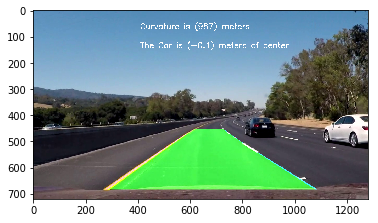

In [189]:
lane_line_finder  = adv_laneline_detection.LaneLineFinder(mtx, dist)
img = np.array(Image.open('13.png'))
plt.imshow(lane_line_finder.process_image(img))

655
0
left curv 386.86179359093404
right curv 736.707903914403


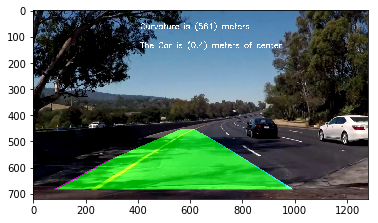

In [190]:
lane_line_finder  = adv_laneline_detection.LaneLineFinder(mtx, dist)
img = np.array(Image.open('14.png'))
plt.imshow(lane_line_finder.process_image(img))

792
885
left curv 405.8979641676476
right curv 472.55644902917504


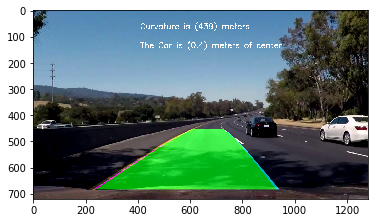

In [192]:
lane_line_finder  = adv_laneline_detection.LaneLineFinder(mtx, dist)
img = np.array(Image.open('16.png'))
plt.imshow(lane_line_finder.process_image(img))

### Harder Challenge Video

In [14]:
lane_line_finderlane_lin  = adv_laneline_detection.LaneLineFinder(mtx, dist)#, k_model)
harder_challenge_output = 'videos/harder_challenge_video_CV.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(lane_line_finder.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(harder_challenge_output, audio=False)
#Close the reader properly 
clip1.reader.close()
clip1.audio.reader.close_proc()

[MoviePy] >>>> Building video videos/harder_challenge_video_CV.mp4
[MoviePy] Writing video videos/harder_challenge_video_CV.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [06:53<00:00,  2.90it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/harder_challenge_video_CV.mp4 

Wall time: 6min 54s


## Some Scripts

### Script to Make Training labels 
This script gets different segmentations the drivable area label and the cars labels and combines them into one label image that then saved for training.

In [ ]:
seg = './bb/seg/'
drive = './bb/labels_drivable/'
new_labels = './bb/new_labels'

def preprocess_image_labels(img_name, label_image, seg_image):
    LANE_LABEL = 255
    CAR_LABEL = 142
    labels_new = np.zeros_like(label_image[:, :, :])

    # Identify lane marking pixels (label is 255)
    lane_marking_pixels = (label_image[:, :, 0]).nonzero()
    labels_new[:, :, 2][lane_marking_pixels] = 1

    # Identify car pixels (label is 142)
    car_pixels = (seg_image[:, :, 2] == CAR_LABEL).nonzero()
    labels_new[:, :, 1][car_pixels] = 1


    # Find all other labels
    other_pixels = ((label_image[:, :, 0] != LANE_LABEL) 
                    & (seg_image[:, :, 2] != CAR_LABEL))
    # Remove the labels by setting their pixels to 0 ~ None
    labels_new[:, :, 0][other_pixels] = 1
    img_name = '{}/{}.png'.format(new_labels ,img_name)
#     img = Image.fromarray(labels_new)
    return cv2.imwrite(img_name, labels_new)#cv2.resize(labels_new, (256, 256))

for drive_img, seg_img in zip(os.listdir(drive), os.listdir(seg)):
    image_name = drive_img.replace(drive, '').replace('_drivable_color.png', '')
    preprocess_image_labels(image_name, np.array(Image.open(os.path.join(drive, drive_img))),
                        np.array(Image.open(os.path.join(seg, seg_img))))

In [24]:
seg = './seg_train/masks/'
new_labels = './seg_train/new_labels'
def preprocess_image_labels(img_name,  seg_image):
    LANE_LABEL = 7
    CAR_LABEL = 26
    labels_new = np.zeros_like(seg_image[:, :, :])

    # Identify lane marking pixels (label is 255)
    lane_marking_pixels = (seg_image[:, :, 0] == LANE_LABEL).nonzero()
    labels_new[:, :, 2][lane_marking_pixels] = 1

    # Identify car pixels (label is 142)
    car_pixels = (seg_image[:, :, 0] == CAR_LABEL).nonzero()
    labels_new[:, :, 1][car_pixels] = 1


    # Find all other labels
    other_pixels = ((seg_image[:, :, 0] != LANE_LABEL) 
                    & (seg_image[:, :, 2] != CAR_LABEL))
    # Remove the labels by setting their pixels to 0 ~ None
    labels_new[:, :, 0][other_pixels] = 1
    img_name = '{}/{}'.format(new_labels ,img_name)
    return cv2.imwrite(img_name, labels_new)#cv2.resize(labels_new, (256, 256))

for seg_img in os.listdir(seg):
    image_name = seg_img.replace('_mask', '')
    preprocess_image_labels(image_name,
                        np.array(Image.open(os.path.join(seg, seg_img))))


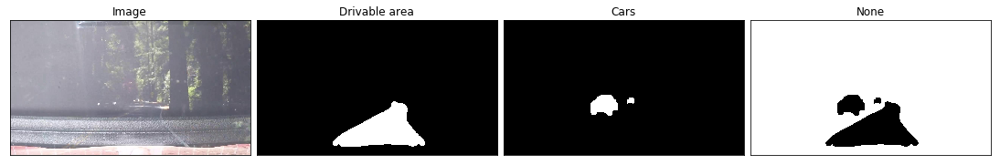

In [45]:
i = np.array(Image.open('./seg_train/new_labels/29.png'))
img = np.array(Image.open('./seg_train/train/29.jpg'))
utils.show_images([img, i[:,:,0], i[:,:,1], i[:,:,2]],
                  ['Image', 'Drivable area', 'Cars', 'None'], image_name='final_labels', cols=4)

In [ ]:
seg_image = np.array(Image.open('./bb/train/035b1b38-07da7a0c.jpg'))
i = Image.fromarray(seg_image.astype('uint8'), 'RGB').rotate(-45)
plt.imshow(i)
plt.show()
plt.imshow(seg_image[:, :, :])
print(seg_image[500, 1000, 0])
print(np.array(i)[500, 1000, 0])
plt.show()
plt.imshow(seg_image[:, :, 2])
plt.show()